In [1]:
# %% init
import os
os.chdir("/home/tangir/crmbm/python/pastis")

from IPython import get_ipython
get_ipython().magic("clear")

import matplotlib.pylab as plt
import matplotlib.dates as mdates
import mrs.reco as reco
import mrs.sim as sim
import mrs.db as db
import mrs.log as log
import mrs.aliases as xxx
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
import suspect
from datetime import datetime

plt.close("all")
plt.rcParams['figure.dpi'] = 75
plt.rcParams['figure.max_open_warning'] = 1000
plt.rcParams["figure.figsize"] = [8, 6]
# get_ipython().magic("matplotlib inline")
get_ipython().magic("matplotlib notebook")
log.setLevel(log.INFO)

cm = sns.color_palette("rocket", as_cmap=True)
pd.set_option('display.max_rows', 50)
pd.options.mode.chained_assignment = None  # default='warn'

(DEBUG) Loaded backend nbAgg version unknown.


# Select datasets

## Load data
Load datasets from SC and brain

In [2]:
rdb_sc = db.data_db("/home/tangir/crmbm/acq_db/sc.pkl")
df_sc = rdb_sc.extend_df_reco(True)
del(rdb_sc)

(INFO)  data_db.__init__: initializing db files [in progress]
(INFO)  data_db.__init__: /home/tangir/crmbm/acq_db/sc.pkl
(INFO)  data_db.__init__: /home/tangir/crmbm/acq_db/sc_fit.pkl
(INFO)  data_db.read_pickle_files: reading storage file [done]...
(INFO)  data_db.read_pickle_files: reading storage file [/home/tangir/crmbm/acq_db/sc_fit.pkl]...
(INFO)  data_db.read_pickle_files: reading storage file [done]...
(INFO)  data_db.__init__: initializing db files [done]
(INFO)  data_db.extend_df_reco: extending dataframe by scraping data...


In [3]:
rdb_sc_no_dr = db.data_db("/home/tangir/crmbm/acq_db/sc_nodr.pkl")
df_sc_no_dr = rdb_sc_no_dr.extend_df_reco(True)
del(rdb_sc_no_dr)

(INFO)  data_db.__init__: initializing db files [in progress]
(INFO)  data_db.__init__: /home/tangir/crmbm/acq_db/sc_nodr.pkl
(INFO)  data_db.__init__: /home/tangir/crmbm/acq_db/sc_nodr_fit.pkl
(INFO)  data_db.read_pickle_files: reading storage file [done]...
(INFO)  data_db.read_pickle_files: reading storage file [/home/tangir/crmbm/acq_db/sc_nodr_fit.pkl]...
(INFO)  data_db.read_pickle_files: reading storage file [done]...
(INFO)  data_db.__init__: initializing db files [done]
(INFO)  data_db.extend_df_reco: extending dataframe by scraping data...


In [4]:
rdb_sc_no_dr_no_rea = db.data_db("/home/tangir/crmbm/acq_db/sc_nodr_norea.pkl")
df_sc_no_dr_no_rea = rdb_sc_no_dr_no_rea.extend_df_reco(True)
del(rdb_sc_no_dr_no_rea)

(INFO)  data_db.__init__: initializing db files [in progress]
(INFO)  data_db.__init__: /home/tangir/crmbm/acq_db/sc_nodr_norea.pkl
(INFO)  data_db.__init__: /home/tangir/crmbm/acq_db/sc_nodr_norea_fit.pkl
(INFO)  data_db.read_pickle_files: reading storage file [done]...
(INFO)  data_db.read_pickle_files: reading storage file [/home/tangir/crmbm/acq_db/sc_nodr_norea_fit.pkl]...
(INFO)  data_db.read_pickle_files: reading storage file [done]...
(INFO)  data_db.__init__: initializing db files [done]
(INFO)  data_db.extend_df_reco: extending dataframe by scraping data...


In [5]:
rdb_brain = db.data_db("/home/tangir/crmbm/acq_db/brain.pkl")
df_brain = rdb_brain.extend_df_reco(True)
del(rdb_brain)

(INFO)  data_db.__init__: initializing db files [in progress]
(INFO)  data_db.__init__: /home/tangir/crmbm/acq_db/brain.pkl
(INFO)  data_db.__init__: /home/tangir/crmbm/acq_db/brain_fit.pkl
(INFO)  data_db.read_pickle_files: reading storage file [done]...
(INFO)  data_db.read_pickle_files: reading storage file [/home/tangir/crmbm/acq_db/brain_fit.pkl]...
(INFO)  data_db.read_pickle_files: reading storage file [done]...
(INFO)  data_db.__init__: initializing db files [done]
(INFO)  data_db.extend_df_reco: extending dataframe by scraping data...


## Adding additional columns
Like BMI, BFP, etc.

SNR is normalized by:
* voxel size
* number of averages (post-data-rejection)

Therefore
* SNR values are divided by voxel volume and multiplied by a mean volume to get usual SNR values
* SNR values are divided by $\sqrt(NA)$ kept after data rejection and multiplied by $\sqrt(128)$

In [6]:
import datetime

def add_columns(this_df, data_rejection=True, display_artefact_measurement=True):

    this_year = datetime.date.today().year

    # create a patient*study id number
    this_df["patient_study_id"] = this_df["patient"].astype(str) + "_" + this_df["study"].astype(str)

    # calculate age
    this_df["dataset_raw_data__patient_age"] = (this_year - pd.DatetimeIndex(this_df["dataset_raw_data__patient_birthday"]).year)
    
    # calculate bmi
    this_df["dataset_patient_bmi"] = this_df["dataset_raw_data__patient_weight"] / \
        this_df["dataset_raw_data__patient_height"]**2

    # calculate BFP (IMG)
    this_df["dataset_patient_bfp"] = 1.39 * this_df["dataset_patient_bmi"]
    + 0.16 * this_df["dataset_raw_data__patient_age"]
    - 10.34 * (this_df["dataset_raw_data__patient_sex"] == "M").astype(int)
    - 9

    # SNR
    # final estimations
    this_df["dataset_snr_final"] = this_df["dataset_raw_analysis-results_cropping_snr"]
    this_df["dataset_lw"] = this_df["dataset_raw_analysis-results_cropping_lw"]
    this_df["dataset_snr_norm"] = this_df["dataset_raw_analysis-results_cropping_snr"]

    # voxel dimensions in X, Y and Z
    # first voxel dimensions order
    this_df["dataset_voxel_size_argsort"] = [np.argsort(o.voxel_size) for o in this_df["dataset_raw_data_obj"]]
    # reorder
    this_df["dataset_voxel_size_X_mm"] = [o.voxel_size[inds][1] for o, inds in zip(this_df["dataset_raw_data_obj"], this_df["dataset_voxel_size_argsort"])]
    this_df["dataset_voxel_size_Y_mm"] = [o.voxel_size[inds][0] for o, inds in zip(this_df["dataset_raw_data_obj"], this_df["dataset_voxel_size_argsort"])]
    this_df["dataset_voxel_size_Z_mm"] = [o.voxel_size[inds][2] for o, inds in zip(this_df["dataset_raw_data_obj"], this_df["dataset_voxel_size_argsort"])]
    # calculate voxel volume
    this_df["dataset_voxel_size_min"] = [np.min(o.voxel_size) for o in this_df["dataset_raw_data_obj"]]
    this_df["dataset_voxel_vol_cm3"] = this_df["dataset_voxel_size_X_mm"]/10 * this_df["dataset_voxel_size_Y_mm"]/10 * this_df["dataset_voxel_size_Z_mm"]/10
    
    # CSDE
    this_df["dataset_csde_X"] = [3400.0 if(type(o.sequence) == sim.mrs_seq_eja_svs_slaser) else np.nan for o in this_df["dataset_raw_data_obj"]]
    this_df["dataset_csde_X"] = this_df["dataset_csde_X"] / (this_df["dataset_voxel_size_X_mm"] * 0.001)
    this_df["dataset_csde_X"] = 1000.0 * this_df["dataset_raw_data__f0"] / this_df["dataset_csde_X"]
    this_df["dataset_csde_X"] = this_df["dataset_csde_X"] / this_df["dataset_voxel_size_X_mm"] * 100.0
    
    this_df["dataset_csde_Y"] = [o.sequence.pulse_rfc_r / (o.sequence.pulse_rfc_duration / 1000.0) 
                                 if(type(o.sequence) == sim.mrs_seq_eja_svs_slaser) else np.nan 
                                 for o in this_df["dataset_raw_data_obj"]]
    this_df["dataset_csde_Y"] = this_df["dataset_csde_Y"] / (this_df["dataset_voxel_size_Y_mm"] * 0.001)
    this_df["dataset_csde_Y"] = 1000.0 * this_df["dataset_raw_data__f0"] / this_df["dataset_csde_Y"]
    this_df["dataset_csde_Y"] = this_df["dataset_csde_Y"] / this_df["dataset_voxel_size_Y_mm"] * 100.0 
    
    this_df["dataset_csde_Z"] = [o.sequence.pulse_rfc_r / (o.sequence.pulse_rfc_duration / 1000.0) 
                                 if(type(o.sequence) == sim.mrs_seq_eja_svs_slaser) else np.nan 
                                 for o in this_df["dataset_raw_data_obj"]]
    this_df["dataset_csde_Z"] = this_df["dataset_csde_Z"] / (this_df["dataset_voxel_size_Z_mm"] * 0.001)
    this_df["dataset_csde_Z"] = 1000.0 * this_df["dataset_raw_data__f0"] / this_df["dataset_csde_Z"]
    this_df["dataset_csde_Z"] = this_df["dataset_csde_Z"] / this_df["dataset_voxel_size_Z_mm"] * 100.0 
    
    # voxel positions
    this_df["dataset_raw_data_posX_mm"] = np.array([o.to_scanner(0,0,0)[0] for o in this_df["dataset_raw_data_obj"]])
    this_df["dataset_raw_data_posY_mm"] = np.array([o.to_scanner(0,0,0)[1] for o in this_df["dataset_raw_data_obj"]])
    this_df["dataset_raw_data_posZ_mm"] = np.array([o.to_scanner(0,0,0)[2] for o in this_df["dataset_raw_data_obj"]])

    mean_voxel_vol = this_df["dataset_voxel_vol_cm3"].mean()
    this_df["dataset_snr_norm"] = this_df["dataset_snr_norm"] / this_df["dataset_voxel_vol_cm3"] * mean_voxel_vol

    # NA normalization
    na_norm = 128.0
    if(data_rejection):
        this_df["dataset_snr_norm"] = this_df["dataset_snr_norm"] / np.sqrt(this_df["dataset_raw_data__data_rejection[0]_Post-rejection_na"]) * np.sqrt(na_norm)

        # signal stability
        this_df["dataset_prerej_amplitude_mean"] = [s[:,0].mean(axis=0) if(type(s) != np.float) else np.nan for s in this_df["dataset_raw_data__data_rejection[0]_Pre-rejection_measurements"]]
        this_df["dataset_prerej_amplitude_std"] = [s[:,0].std(axis=0) if(type(s) != np.float) else np.nan for s in this_df["dataset_raw_data__data_rejection[0]_Pre-rejection_measurements"]]
        this_df["dataset_prerej_linewidth_mean"] = [s[:,1].mean(axis=0) if(type(s) != np.float) else np.nan for s in this_df["dataset_raw_data__data_rejection[0]_Pre-rejection_measurements"]]
        this_df["dataset_prerej_linewidth_std"] = [s[:,1].std(axis=0) if(type(s) != np.float) else np.nan for s in this_df["dataset_raw_data__data_rejection[0]_Pre-rejection_measurements"]]
        this_df["dataset_prerej_chemical_shift_mean"] = [s[:,2].mean(axis=0) if(type(s) != np.float) else np.nan for s in this_df["dataset_raw_data__data_rejection[0]_Pre-rejection_measurements"]]
        this_df["dataset_prerej_chemical_shift_std"] = [s[:,2].std(axis=0) if(type(s) != np.float) else np.nan for s in this_df["dataset_raw_data__data_rejection[0]_Pre-rejection_measurements"]]
        this_df["dataset_prerej_phase_mean"] = [s[:,3].mean(axis=0) if(type(s) != np.float) else np.nan for s in this_df["dataset_raw_data__data_rejection[0]_Pre-rejection_measurements"]]
        this_df["dataset_prerej_phase_std"] = [s[:,3].std(axis=0) if(type(s) != np.float) else np.nan for s in this_df["dataset_raw_data__data_rejection[0]_Pre-rejection_measurements"]]

        # calculating data rejection rate
        this_df["dataset_rejection_rate_prct"] = (this_df["dataset_raw_data__data_rejection[0]_Pre-rejection_na"] - 
        this_df["dataset_raw_data__data_rejection[0]_Post-rejection_na"]) / this_df["dataset_raw_data__data_rejection[0]_Pre-rejection_na"] * 100.0
 
    # calculate theoretical scan time knowing NA and TR, neglicting resp. trig
    this_df["dataset_acqtime"] = this_df["dataset_raw_data__sequence_tr"] / 1000.0 * (this_df["dataset_raw_data__sequence_na"] + this_df["dataset_raw_data__sequence_ds"])
    this_df["dataset_acqtime_eff"] = this_df["dataset_dcm_data__sequence_eff_acquisition_time"]

    # estimate artefact intensity for each dataset
    this_df["dataset_artefact_signal"] = np.array([o.analyze_snr_1d([4.9, 5.5], [-2, -1], True, display_artefact_measurement) for o in this_df["dataset_raw_data_obj"]])[:, 1]

    # estimate water intensity for each dataset
    this_df["dataset_water_signal"] = np.array([o.analyze_snr_1d([4.6, 4.8], [-2, -1], True, display_artefact_measurement) for o in this_df["dataset_raw_data_obj"]])[:, 1]

    return(this_df)

df_sc = add_columns(df_sc, True, False)
df_sc_no_dr = add_columns(df_sc_no_dr, False, False)
df_sc_no_dr_no_rea = add_columns(df_sc_no_dr_no_rea, False, False)
df_brain = add_columns(df_brain, True, False)


(INFO)  MRSData2.analyze_snr_1d: results for [#0 STEAM [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 3.54E+03, N = 1.86E+02, SNR = 18.99!
(INFO)  MRSData2.analyze_snr_1d: results for [#1 sLASER R:N=20:1 [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 6.20E+03, N = 1.75E+02, SNR = 35.38!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER R:N=25:1 [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 7.36E+03, N = 1.90E+02, SNR = 38.85!
(INFO)  MRSData2.analyze_snr_1d: results for [#1 sLASER R:N=25:1 trig [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 7.21E+03, N = 1.89E+02, SNR = 38.17!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 crappy [DCM]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 1.08E+04, N = 1.02E+02, SNR = 105.83!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER 20:1 cardiac trig [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 6.05E+03, N = 3.31E+02, SNR = 18.28!
(INFO)  MRSData2.analyze_snr_1d: results for [#1 sLASER 20:1 resp tr

(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER 20:1 [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 8.17E+04, N = 2.11E+02, SNR = 387.18!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER 20:1 [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 2.87E+04, N = 4.59E+02, SNR = 62.45!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER 20:1 [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 8.17E+04, N = 2.14E+02, SNR = 382.24!
(INFO)  MRSData2.analyze_snr_1d: results for [#1 sLASER 5:5 [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 6.48E+04, N = 2.86E+02, SNR = 226.72!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER 20:1 [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 2.93E+04, N = 2.27E+02, SNR = 128.88!
(INFO)  MRSData2.analyze_snr_1d: results for [#1 sLASER 5:5 [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 4.08E+04, N = 2.32E+02, SNR = 175.67!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER 20:1 [RAW]] coming...
(INFO) 

(INFO)  MRSData2.analyze_snr_1d: S = 2.13E+05, N = 1.20E+02, SNR = 1777.18!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER 20:1 [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 5.30E+03, N = 2.14E+02, SNR = 24.73!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER 20:1 WS [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 7.94E+03, N = 1.85E+02, SNR = 42.95!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER 20:1 (REF with OVS) [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 3.76E+03, N = 1.78E+02, SNR = 21.15!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER 10:2 (REF with OVS) [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 5.12E+03, N = 2.19E+02, SNR = 23.41!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER TE=52ms [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 5.21E+03, N = 2.22E+02, SNR = 23.48!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 1st try (30-40Hz water LW) [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S 

(INFO)  MRSData2.analyze_snr_1d: S = 2.85E+04, N = 1.35E+02, SNR = 210.36!
(INFO)  MRSData2.analyze_snr_1d: results for [#1 sLASER 20/1 NA=64 notrig [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 1.38E+04, N = 2.08E+02, SNR = 66.47!
(INFO)  MRSData2.analyze_snr_1d: results for [#2 sLASER 5/5 NA=64 notrig [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 1.57E+04, N = 2.36E+02, SNR = 66.33!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER 10/2 NA=64 trig [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 4.62E+04, N = 1.95E+02, SNR = 236.54!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER 20/1 [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 2.29E+04, N = 1.76E+02, SNR = 130.50!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER 20/1 [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 3.14E+04, N = 2.08E+02, SNR = 151.41!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER 20/1 NA=128 [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 4.14

(INFO)  MRSData2.analyze_snr_1d: S = 3.90E+04, N = 1.66E+02, SNR = 234.70!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 crappy [DCM]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 6.64E+04, N = 1.02E+02, SNR = 652.41!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER 20:1 cardiac trig [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 4.14E+04, N = 2.66E+02, SNR = 155.61!
(INFO)  MRSData2.analyze_snr_1d: results for [#1 sLASER 20:1 resp trig [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 5.73E+04, N = 2.67E+02, SNR = 214.40!
(INFO)  MRSData2.analyze_snr_1d: results for [#2 sLASER 20:1 no trig [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 3.62E+04, N = 3.11E+02, SNR = 116.26!
(INFO)  MRSData2.analyze_snr_1d: results for [#3 sLASER 10:2 repos. + resp trig [RAW]] coming...
(INFO)  MRSData2.analyze_snr_1d: S = 7.36E+04, N = 3.36E+02, SNR = 218.99!
(INFO)  MRSData2.analyze_snr_1d: results for [#0 sLASER 20:1 resp trig [RAW]] coming...
(INFO)  MRSData2.analyze_sn

## Fix LW for one dataset

removing residual water peak with HSVD: ██████████████████████████████

<IPython.core.display.Javascript object>


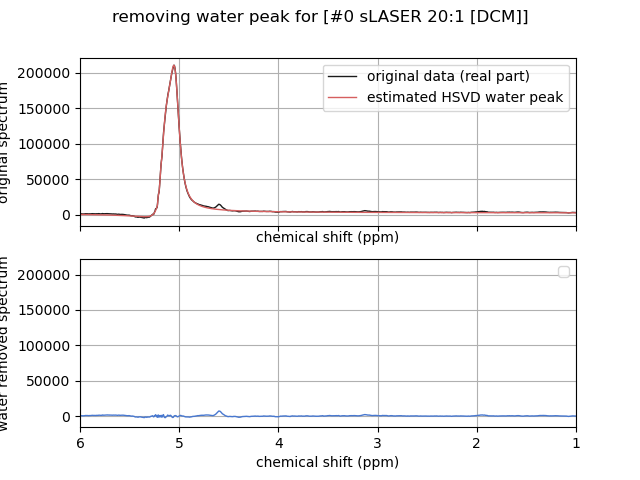

(WARNING) No handles with labels found to put in legend.


 done.


(INFO)  MRSData2.analyze_linewidth_1d: results for [#0 sLASER 20:1 [DCM]] coming...
(INFO)  MRSData2.analyze_linewidth_1d: LW = 19.53 Hz!


<IPython.core.display.Javascript object>


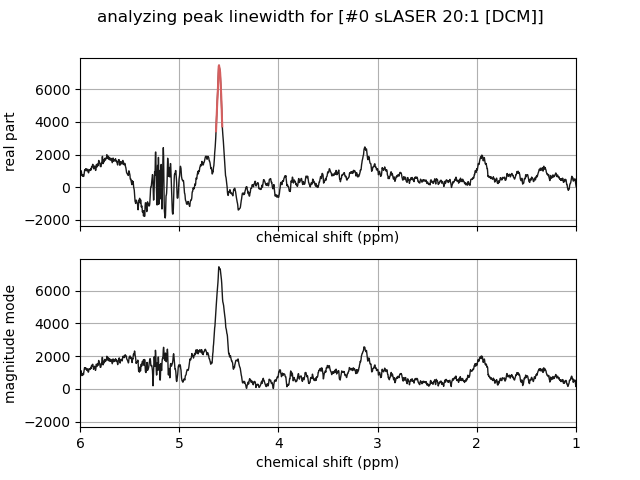

removing residual water peak with HSVD: ██████████████████████████████

(WARNING) No handles with labels found to put in legend.


 done.


(INFO)  MRSData2.analyze_linewidth_1d: results for [#0 sLASER 20:1 [DCM]] coming...
(INFO)  MRSData2.analyze_linewidth_1d: LW = 19.53 Hz!


removing residual water peak with HSVD: ██████████████████████████████

(WARNING) No handles with labels found to put in legend.


 done.


(INFO)  MRSData2.analyze_linewidth_1d: results for [#0 sLASER 20:1 [DCM]] coming...
(INFO)  MRSData2.analyze_linewidth_1d: LW = 19.53 Hz!


In [7]:
def fix_bad_lw(this_df):
    scan_hash_bad_lw = this_df.loc[this_df["dataset_lw"] > 100].index[0]
    # get MRSData2 obj
    s = this_df.at[scan_hash_bad_lw, "dataset_raw_data_obj"]
    # remove artefact
    s = s.correct_water_removal_1d(5, [4.75, 5.5], True)
    this_lw = s.analyze_linewidth_1d([4.5, 5], False, True)
    this_df.at[scan_hash_bad_lw, "dataset_lw"] = this_lw
    
    return(this_df)
    
df_sc = fix_bad_lw(df_sc)
df_sc_no_dr = fix_bad_lw(df_sc_no_dr)
df_sc_no_dr_no_rea = fix_bad_lw(df_sc_no_dr_no_rea)
#df_brain = fix_bad_lw(df_brain)
    

## Keep only resp-gating sLASER scans
Keep only:
* semi-LASER scans
* with resp gating
and check that it does not remove any patient of study

In [8]:
n_patient_study_p1_orig = df_sc.loc[df_sc["study"] == 1]["patient"].nunique()

# keep this for big stats about data quality
df_sc_slaser = df_sc.loc[(df_sc["dataset_raw_data__sequence_name"] == "eja_svs_slaser")]
df_brain_slaser = df_brain.loc[df_brain["dataset_raw_data__sequence_name"] == "eja_svs_slaser"]

df_sc_slaser_resptrig = df_sc.loc[(df_sc["dataset_raw_data__sequence_name"] == "eja_svs_slaser")
                          & (df_sc["dataset_raw_data__sequence_gating_mode"] == sim.gating_signal_source.RESP_GATING)]

df_removed = df_sc.loc[(df_sc["dataset_raw_data__sequence_name"] != "eja_svs_slaser")
                  | (df_sc["dataset_raw_data__sequence_gating_mode"] != sim.gating_signal_source.RESP_GATING)]

# check that we did not remove any patient/study
n_patient_study_p1_after_filtering_slaser = df_sc_slaser.loc[df_sc_slaser["study"] == 1]["patient"].nunique()
n_patient_study_p1_after_filtering_slaser_resptrig = df_sc_slaser_resptrig.loc[df_sc_slaser_resptrig["study"] == 1]["patient"].nunique()

df_removed

,patient,study,dataset_legend,dataset_raw_files[0],dataset_raw_files[1],dataset_raw_data_obj,dataset_raw_data__dt,dataset_raw_data__f0,dataset_raw_data__te,dataset_raw_data__tr,...,dataset_prerej_linewidth_std,dataset_prerej_chemical_shift_mean,dataset_prerej_chemical_shift_std,dataset_prerej_phase_mean,dataset_prerej_phase_std,dataset_rejection_rate_prct,dataset_acqtime,dataset_acqtime_eff,dataset_artefact_signal,dataset_water_signal
scan_hash,,,,,,,,,,,,,,,,,,,,,
5010227e1b906e17fdeac0fdff8396b2,296,1,#0 STEAM,/home/tangir/crmbm/acq_twix/296_ym_p1_brainmoe...,/home/tangir/crmbm/acq_twix/296_ym_p1_brainmoe...,"[(5.906507327308433+113.6085493880716j), (-39....",0.0001,297.205422,3.48,3000.0,...,6.386165,1.165734e-15,0.131206,1.110223e-16,1.960898,64.06250,396.00,521.0,3536.912930,11523.848017
405976f0de3db2b1ea8b83c3accc8994,296,1,#1 sLASER R:N=20:1,/home/tangir/crmbm/acq_twix/296_ym_p1_brainmoe...,/home/tangir/crmbm/acq_twix/296_ym_p1_brainmoe...,"[(328.82776378508504+27.216353213341588j), (31...",0.0001,297.205422,49.96,3690.0,...,5.862235,1.082467e-15,0.026842,6.938894e-18,0.582657,2.34375,487.08,570.0,6198.742263,54192.377978
fb81785a61e346c7fdbb37479f312ca5,300,1,#0 sLASER R:N=25:1,/home/tangir/crmbm/acq_twix/300-pm-p1-moelle/m...,/home/tangir/crmbm/acq_twix/300-pm-p1-moelle/m...,"[(426.508162270165-25.29576424165769j), (419.8...",0.0001,297.206850,49.96,3550.0,...,4.588132,0.000000e+00,0.000000,1.214306e-17,0.228364,3.12500,468.60,NaN,7363.055537,63713.006135
77db8d723204884d29a997944390611b,304,1,#0 crappy,/home/tangir/crmbm/acq/304-ka-p1-moelle/201908...,/home/tangir/crmbm/acq/304-ka-p1-moelle/201908...,"[(936.8425903320312+83.49891662597656j), (740....",0.0002,297.204465,49.96,4610.0,...,NaN,NaN,NaN,NaN,NaN,NaN,608.52,233.0,10772.045894,66405.722470
40ef3af628211f936a93c79adb00ac9d,307,1,#0 sLASER 20:1 cardiac trig,/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/m...,/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/m...,"[(407.49602726268415-207.9086346239237j), (425...",0.0001,297.206696,49.96,4290.0,...,5.451473,1.110223e-16,0.028608,6.938894e-18,0.512939,35.93750,291.72,349.0,6045.466805,55922.483183
4a3a0b1b9f85f1928b9bfb342358fef4,307,1,#2 sLASER 20:1 no trig,/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/m...,/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/m...,"[(509.3192079352583+42.15127719925854j), (507....",0.0001,297.206696,49.96,4290.0,...,13.599369,1.110223e-16,0.024930,4.163336e-17,0.667752,28.12500,291.72,274.0,7027.041068,43694.626555
90a5b0c9d27daa2396d73e53f5a90afe,355,1,#0 sLASER TE=52ms,/home/tangir/crmbm/acq_twix/355-st-p1-moelle/m...,/home/tangir/crmbm/acq_twix/355-st-p1-moelle/m...,"[(407.26385440251784-8.685654423232418j), (368...",0.0001,297.205545,52.48,5390.0,...,7.873239,-2.775558e-16,0.136410,-2.081668e-17,0.845168,11.71875,711.48,692.0,5037.329230,23101.109765
caf8ec7f9e1026afbfa1e2c41ba43539,311,2,#1 sLASER 20/1 NA=128 notrig,/home/tangir/crmbm/acq_twix/311-sl-p2-moelle/m...,/home/tangir/crmbm/acq_twix/311-sl-p2-moelle/m...,"[(273.0080880478138+48.28108955825748j), (269....",0.0001,297.206030,52.48,5410.0,...,2.441215,0.000000e+00,0.003959,-4.770490e-18,0.213035,10.15625,714.12,699.0,4215.349858,42850.848720
355445d1bac5ee682c88f889b4c01d09,336,2,#0 sLASER 10/2 NA=64 notrig,/home/tangir/crmbm/acq_twix/336-nb-p2-moelle/m...,/home/tangir/crmbm/acq_twix/336-nb-p2-moelle/m...,"[(382.94042219267186+82.29010962310511j), (340...",0.0001,297.205894,32.28,5300.0,...,3.564331,-5.551115e-16,0.016360,1.734723e-18,0.389419,4.68750,360.40,NaN,6586.186608,32263.037103


I have been going over the datasets rejected here:

* 296_ym_p1_brainmoelle: one of the first SC scans, was not resp gating at the time, too bad but only P1 (no P2)
* 300_pm_p1_moelle: removing one no gating scan, there is another one with trig so OK
* 304_ka_p1_moelle: removing this P1 study (there is a P2 that will be considered P1), data was crappy, dicom only, and no trig for some reason
* 307_ap_p1_moelle: removing 2 scans (no trig and cardiac trig) that were done for tests, still a 2 resp trig left)
* 355_st_p1_moelle: removing scan and therefore patient, no resp trig because I was in hurry. Too bad, the data is not soo bad and it was a fat guy (cohort stats) :(
* 311_sl_p2_moelle, 336_nb_p2_moelle: just some trig tests removed, no patient or study removed

So removed 3 patient or study in total because not following the standard protocol (semiLASER + resp gating)

In [9]:
print("* original number of P1 patients = %d" % n_patient_study_p1_orig)
print("* number of P1 patients after keeping only sLASER = %d" % n_patient_study_p1_after_filtering_slaser)
print("* number of P1 patients after keeping only resp. trig. sLASER = %d" % n_patient_study_p1_after_filtering_slaser_resptrig)


* original number of P1 patients = 18
* number of P1 patients after keeping only sLASER = 18
* number of P1 patients after keeping only resp. trig. sLASER = 15


## Remove 310-mg-p1-moelle
I choose not to include this subject in the group: very strong side MRI effects, nearly puked, probably moved
In other words, if the inclusion process was improved, he would not have passed.

In [10]:
df = df_sc_slaser_resptrig

df_310 = df.loc[ (df["patient"] == 310) ]
df_sc_slaser_resptrig_no_310 = df.drop(df_310.index)

n_patient_study_p1_after_filtering_slaser_resptrig_no_310 = df_sc_slaser_resptrig_no_310.loc[df_sc_slaser_resptrig_no_310["study"] == 1]["patient"].nunique()

df_310

,patient,study,dataset_legend,dataset_raw_files[0],dataset_raw_files[1],dataset_raw_data_obj,dataset_raw_data__dt,dataset_raw_data__f0,dataset_raw_data__te,dataset_raw_data__tr,...,dataset_prerej_linewidth_std,dataset_prerej_chemical_shift_mean,dataset_prerej_chemical_shift_std,dataset_prerej_phase_mean,dataset_prerej_phase_std,dataset_rejection_rate_prct,dataset_acqtime,dataset_acqtime_eff,dataset_artefact_signal,dataset_water_signal
scan_hash,,,,,,,,,,,,,,,,,,,,,
01a46c3d8ebdb2912567745a61ef0d24,310,1,#0 sLASER 20:1,/home/tangir/crmbm/acq_twix/310-mg-p1-moelle/m...,/home/tangir/crmbm/acq_twix/310-mg-p1-moelle/m...,"[(521.3062355513863+231.5798734836309j), (446....",0.0001,297.205166,58.48,5060.0,...,12.76898,-2.775558e-16,0.167981,-2.255141e-17,0.851033,23.4375,667.92,934.0,21843.056019,27955.940205


## Height & Weight & BMI (initial)

Find any orphan P2 studies and set them as P1 :)

In [11]:
# using previously filtered db
df = df_sc_slaser_resptrig_no_310

df_p1 = df.loc[(df["study"] == 1)]

df_p2_orphan = df.loc[ (df["study"] == 2) &
                        ~(df["patient"].isin(list(df_p1["patient"].unique()))) ]
df_p2_orphan

,patient,study,dataset_legend,dataset_raw_files[0],dataset_raw_files[1],dataset_raw_data_obj,dataset_raw_data__dt,dataset_raw_data__f0,dataset_raw_data__te,dataset_raw_data__tr,...,dataset_prerej_linewidth_std,dataset_prerej_chemical_shift_mean,dataset_prerej_chemical_shift_std,dataset_prerej_phase_mean,dataset_prerej_phase_std,dataset_rejection_rate_prct,dataset_acqtime,dataset_acqtime_eff,dataset_artefact_signal,dataset_water_signal
scan_hash,,,,,,,,,,,,,,,,,,,,,
42063831757801c81193689ead085d37,304,2,#0 1st try (30-40Hz water LW),/home/tangir/crmbm/acq_twix/304-ka-p2-moelle/m...,/home/tangir/crmbm/acq_twix/304-ka-p2-moelle/m...,"[(3219.131539558533+199.63577279252735j), (327...",0.0001,297.204932,43.96,4170.0,...,3.422733,-2.220446e-16,0.019246,-4.625929e-18,0.197257,4.166667,417.00,633.0,245816.065807,58059.621576
8b934ce052f541a6923805395f44bfb8,304,2,#1 2nd try (25Hz water LW),/home/tangir/crmbm/acq_twix/304-ka-p2-moelle/m...,/home/tangir/crmbm/acq_twix/304-ka-p2-moelle/m...,"[(2954.9663979595907-158.85486067839136j), (29...",0.0001,297.204932,52.48,4690.0,...,3.239967,4.440892e-16,0.023075,6.938894e-18,0.217046,3.125000,168.84,280.0,197078.166632,43156.862051


In [12]:
# changed to P1
df_sc_orphan_p2_fix = df
for this_index in list(df_p2_orphan.index):
    df_sc_orphan_p2_fix.at[this_index, "study"] = 1
    df_sc_orphan_p2_fix.at[this_index, "patient_study_id"] = df_sc_orphan_p2_fix.at[this_index, "patient_study_id"] + "_orphan"

df_sc_orphan_p2_fix

,patient,study,dataset_legend,dataset_raw_files[0],dataset_raw_files[1],dataset_raw_data_obj,dataset_raw_data__dt,dataset_raw_data__f0,dataset_raw_data__te,dataset_raw_data__tr,...,dataset_prerej_linewidth_std,dataset_prerej_chemical_shift_mean,dataset_prerej_chemical_shift_std,dataset_prerej_phase_mean,dataset_prerej_phase_std,dataset_rejection_rate_prct,dataset_acqtime,dataset_acqtime_eff,dataset_artefact_signal,dataset_water_signal
scan_hash,,,,,,,,,,,,,,,,,,,,,
2fff316122fc89a0b4d1f918f6cd62d8,300,1,#1 sLASER R:N=25:1 trig,/home/tangir/crmbm/acq_twix/300-pm-p1-moelle/m...,/home/tangir/crmbm/acq_twix/300-pm-p1-moelle/m...,"[(466.7910467092009+42.6625311942012j), (449.5...",0.0001,297.206850,49.96,3550.0,...,7.964201,1.387779e-16,0.039159,5.204170e-18,0.291642,16.406250,468.60,NaN,7208.212015,62234.761255
159437f4b7de93d40c7fef7853019df3,307,1,#1 sLASER 20:1 resp trig,/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/m...,/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/m...,"[(498.05689346512656+329.8932319576538j), (420...",0.0001,297.206696,49.96,4290.0,...,17.893917,-5.551115e-16,0.005962,5.551115e-17,0.361885,29.687500,291.72,460.0,9565.560998,65713.221497
1baf6b702f39fefb5ad9e44179057ef7,307,1,#3 sLASER 10:2 repos. + resp trig,/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/m...,/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/m...,"[(781.0128721121888-57.03888725364891j), (754....",0.0001,297.205912,29.96,4570.0,...,4.756216,2.220446e-16,0.002965,0.000000e+00,0.292821,15.625000,310.76,425.0,12674.001356,78781.944153
a2b582b37a04bd4efc43138368bc0b96,308,1,#0 sLASER 20:1 resp trig,/home/tangir/crmbm/acq_twix/308-rs-p1-moelle/m...,/home/tangir/crmbm/acq_twix/308-rs-p1-moelle/m...,"[(425.20132747556744+26.922286521821697j), (40...",0.0001,297.204864,41.96,3780.0,...,8.776508,-7.771561e-16,0.036236,-6.938894e-18,0.695026,14.062500,498.96,799.0,12466.505434,27047.133237
7cb024e470b0b2b072436635a19a1c00,311,1,#0 sLASER 20:1,/home/tangir/crmbm/acq_twix/311-sl-p1-moelle/m...,/home/tangir/crmbm/acq_twix/311-sl-p1-moelle/m...,"[(454.6048151740534-114.46837806711163j), (472...",0.0001,297.205785,90.00,5810.0,...,19.794620,-2.386980e-15,0.014645,-8.673617e-17,0.724501,17.968750,766.92,NaN,10144.079020,81678.461267
9f8067ea065153da5b3a352d58f6ca23,313,1,#0 sLASER 20:1,/home/tangir/crmbm/acq_twix/313-ft-p1-moelle/m...,/home/tangir/crmbm/acq_twix/313-ft-p1-moelle/m...,"[(1108.8833324440807-501.8758589220622j), (116...",0.0001,297.206221,49.96,4290.0,...,7.972431,-5.273559e-16,0.097170,-6.938894e-18,0.566541,6.250000,566.28,888.0,8175.118929,28657.452328
0a58f85af8c32d06cbbca74391447ad2,314,1,#0 sLASER 20:1,/home/tangir/crmbm/acq_twix/314-yt-p1-moelle/m...,/home/tangir/crmbm/acq_twix/314-yt-p1-moelle/m...,"[(730.3440293819107-125.91066233625389j), (712...",0.0001,297.205966,41.68,4130.0,...,2.213875,6.106227e-16,0.003605,-6.938894e-18,0.240678,5.468750,545.16,893.0,10881.861401,81685.213701
2195967ae34d5ef7dcfba4fc93a9e121,314,1,#1 sLASER 5:5,/home/tangir/crmbm/acq_twix/314-yt-p1-moelle/m...,/home/tangir/crmbm/acq_twix/314-yt-p1-moelle/m...,"[(1008.4807903081726-17.76038805871182j), (881...",0.0001,297.205946,19.96,3690.0,...,3.610977,-3.330669e-16,0.001796,-6.938894e-18,0.148106,4.687500,250.92,408.0,14092.724989,64816.699975
fe34c6902afd341a0c81de0a0b6d6373,316,1,#0 sLASER 20:1,/home/tangir/crmbm/acq_twix/316-ap-p1-moelle/m...,/home/tangir/crmbm/acq_twix/316-ap-p1-moelle/m...,"[(526.3710825321402-109.50225527879674j), (518...",0.0001,297.205277,45.96,4010.0,...,5.493775,0.000000e+00,0.000000,2.081668e-17,0.329557,3.125000,529.32,690.0,29196.639993,29295.532706


In [13]:
df = df_sc_orphan_p2_fix.loc[df_sc["study"] == 1]

print("Mean weight = %.2fkgs +/-%.2f " % (df["dataset_raw_data__patient_weight"].mean(),
                                          df["dataset_raw_data__patient_weight"].std()))
print("Mean height = %.2fm +/-%.2f " % (df["dataset_raw_data__patient_height"].mean(),
                                        df["dataset_raw_data__patient_height"].std()))
print("Mean age = %.2fy +/-%.2f " % (df["dataset_raw_data__patient_age"].mean(),
                                        df["dataset_raw_data__patient_age"].std()))
print("Mean height = %.2fm +/-%.2f " % (df["dataset_raw_data__patient_height"].mean(),
                                        df["dataset_raw_data__patient_height"].std()))
print("Mean BMI = %.2f +/-%.2f " % (df["dataset_patient_bmi"].mean(), 
                                    df["dataset_patient_bmi"].std()))

sex_counts = df.groupby("dataset_raw_data__patient_sex")
print("Sex = M(%d) F(%d)" % (df.loc[sex_counts.groups["M"]]["patient"].nunique(), 
                             df.loc[sex_counts.groups["F"]]["patient"].nunique()))

Mean weight = 56.58kgs +/-14.08 
Mean height = 1.64m +/-0.12 
Mean age = 28.26y +/-4.68 
Mean height = 1.64m +/-0.12 
Mean BMI = 20.62 +/-2.71 
Sex = M(4) F(10)


## Remove strong artefact datasets
Criteria: when the artefact is stronger than the residual water peak

In [14]:
df = df_sc_slaser_resptrig_no_310

df_strong_artefact_to_remove=df.loc[ (df["dataset_artefact_signal"] > df["dataset_water_signal"])  ]
df_sc_slaser_resptrig_no_310_no_artefact = df.drop(df_strong_artefact_to_remove.index)

n_patient_study_p1_after_filtering_slaser_resptrig_no_310_no_artefact = df_sc_slaser_resptrig_no_310_no_artefact.loc[df_sc_slaser_resptrig_no_310_no_artefact["study"] == 1]["patient"].nunique()

df_strong_artefact_to_remove

,patient,study,dataset_legend,dataset_raw_files[0],dataset_raw_files[1],dataset_raw_data_obj,dataset_raw_data__dt,dataset_raw_data__f0,dataset_raw_data__te,dataset_raw_data__tr,...,dataset_prerej_linewidth_std,dataset_prerej_chemical_shift_mean,dataset_prerej_chemical_shift_std,dataset_prerej_phase_mean,dataset_prerej_phase_std,dataset_rejection_rate_prct,dataset_acqtime,dataset_acqtime_eff,dataset_artefact_signal,dataset_water_signal
scan_hash,,,,,,,,,,,,,,,,,,,,,
3695a02a4fbf0153215cf09eaa21658e,333,1,#0 sLASER 20:1,/home/tangir/crmbm/acq/333-sc-p1-moelle/201911...,/home/tangir/crmbm/acq/333-sc-p1-moelle/201911...,"[(5208.6240234375+896.160888671875j), (4583.44...",0.0002,297.205455,45.96,4130.0,...,NaN,NaN,NaN,NaN,NaN,NaN,545.16,565.0,212846.512882,45736.358792
42063831757801c81193689ead085d37,304,1,#0 1st try (30-40Hz water LW),/home/tangir/crmbm/acq_twix/304-ka-p2-moelle/m...,/home/tangir/crmbm/acq_twix/304-ka-p2-moelle/m...,"[(3219.131539558533+199.63577279252735j), (327...",0.0001,297.204932,43.96,4170.0,...,3.422733,-2.220446e-16,0.019246,-4.625929e-18,0.197257,4.166667,417.00,633.0,245816.065807,58059.621576
8b934ce052f541a6923805395f44bfb8,304,1,#1 2nd try (25Hz water LW),/home/tangir/crmbm/acq_twix/304-ka-p2-moelle/m...,/home/tangir/crmbm/acq_twix/304-ka-p2-moelle/m...,"[(2954.9663979595907-158.85486067839136j), (29...",0.0001,297.204932,52.48,4690.0,...,3.239967,4.440892e-16,0.023075,6.938894e-18,0.217046,3.125000,168.84,280.0,197078.166632,43156.862051


In [15]:
print("* original number of P1 patients = %d" % n_patient_study_p1_orig)
print("* number of P1 patients after keeping only sLASER = %d" % n_patient_study_p1_after_filtering_slaser)
print("* number of P1 patients after keeping only resp. trig. sLASER = %d" % n_patient_study_p1_after_filtering_slaser_resptrig)
print("* number of P1 patients after keeping only resp. trig. sLASER, removing pukish subject = %d" % n_patient_study_p1_after_filtering_slaser_resptrig_no_310)
print("* number of P1 patients after keeping only resp. trig. sLASER, removing pukish subject, no artefact = %d" % n_patient_study_p1_after_filtering_slaser_resptrig_no_310_no_artefact)


* original number of P1 patients = 18
* number of P1 patients after keeping only sLASER = 18
* number of P1 patients after keeping only resp. trig. sLASER = 15
* number of P1 patients after keeping only resp. trig. sLASER, removing pukish subject = 14
* number of P1 patients after keeping only resp. trig. sLASER, removing pukish subject, no artefact = 13


## Find any orphan P2 studies
and set them as P1 :)

In [16]:
# using previously filtered db
df = df_sc_slaser_resptrig_no_310_no_artefact

df_p1 = df.loc[(df["study"] == 1)]

df_p2_orphan = df.loc[ (df["study"] == 2) &
                        ~(df["patient"].isin(list(df_p1["patient"].unique()))) ]

df_p2_orphan

,patient,study,dataset_legend,dataset_raw_files[0],dataset_raw_files[1],dataset_raw_data_obj,dataset_raw_data__dt,dataset_raw_data__f0,dataset_raw_data__te,dataset_raw_data__tr,...,dataset_prerej_linewidth_std,dataset_prerej_chemical_shift_mean,dataset_prerej_chemical_shift_std,dataset_prerej_phase_mean,dataset_prerej_phase_std,dataset_rejection_rate_prct,dataset_acqtime,dataset_acqtime_eff,dataset_artefact_signal,dataset_water_signal
scan_hash,,,,,,,,,,,,,,,,,,,,,
da13ac26d45806eaced75e7dd71df1f3,333,2,#0 sLASER 20/1,/home/tangir/crmbm/acq_twix/333-sc-p2-moelle/m...,/home/tangir/crmbm/acq_twix/333-sc-p2-moelle/m...,"[(441.56129217352776+22.05538021997875j), (421...",0.0001,297.205864,49.96,4070.0,...,13.849423,-1.443290e-15,0.015939,-4.163336e-17,0.759442,5.46875,537.24,919.0,8612.360242,33756.197836


In [17]:
# changed to P1
df_sc_orphan_p2_fix = df
for this_index in list(df_p2_orphan.index):
    df_sc_orphan_p2_fix.at[this_index, "study"] = 1
    df_sc_orphan_p2_fix.at[this_index, "patient_study_id"] = df_sc_orphan_p2_fix.at[this_index, "patient_study_id"] + "_orphan"
        
df_sc_orphan_p2_fix

,patient,study,dataset_legend,dataset_raw_files[0],dataset_raw_files[1],dataset_raw_data_obj,dataset_raw_data__dt,dataset_raw_data__f0,dataset_raw_data__te,dataset_raw_data__tr,...,dataset_prerej_linewidth_std,dataset_prerej_chemical_shift_mean,dataset_prerej_chemical_shift_std,dataset_prerej_phase_mean,dataset_prerej_phase_std,dataset_rejection_rate_prct,dataset_acqtime,dataset_acqtime_eff,dataset_artefact_signal,dataset_water_signal
scan_hash,,,,,,,,,,,,,,,,,,,,,
2fff316122fc89a0b4d1f918f6cd62d8,300,1,#1 sLASER R:N=25:1 trig,/home/tangir/crmbm/acq_twix/300-pm-p1-moelle/m...,/home/tangir/crmbm/acq_twix/300-pm-p1-moelle/m...,"[(466.7910467092009+42.6625311942012j), (449.5...",0.0001,297.206850,49.96,3550.0,...,7.964201,1.387779e-16,0.039159,5.204170e-18,0.291642,16.406250,468.60,NaN,7208.212015,62234.761255
159437f4b7de93d40c7fef7853019df3,307,1,#1 sLASER 20:1 resp trig,/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/m...,/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/m...,"[(498.05689346512656+329.8932319576538j), (420...",0.0001,297.206696,49.96,4290.0,...,17.893917,-5.551115e-16,0.005962,5.551115e-17,0.361885,29.687500,291.72,460.0,9565.560998,65713.221497
1baf6b702f39fefb5ad9e44179057ef7,307,1,#3 sLASER 10:2 repos. + resp trig,/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/m...,/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/m...,"[(781.0128721121888-57.03888725364891j), (754....",0.0001,297.205912,29.96,4570.0,...,4.756216,2.220446e-16,0.002965,0.000000e+00,0.292821,15.625000,310.76,425.0,12674.001356,78781.944153
a2b582b37a04bd4efc43138368bc0b96,308,1,#0 sLASER 20:1 resp trig,/home/tangir/crmbm/acq_twix/308-rs-p1-moelle/m...,/home/tangir/crmbm/acq_twix/308-rs-p1-moelle/m...,"[(425.20132747556744+26.922286521821697j), (40...",0.0001,297.204864,41.96,3780.0,...,8.776508,-7.771561e-16,0.036236,-6.938894e-18,0.695026,14.062500,498.96,799.0,12466.505434,27047.133237
7cb024e470b0b2b072436635a19a1c00,311,1,#0 sLASER 20:1,/home/tangir/crmbm/acq_twix/311-sl-p1-moelle/m...,/home/tangir/crmbm/acq_twix/311-sl-p1-moelle/m...,"[(454.6048151740534-114.46837806711163j), (472...",0.0001,297.205785,90.00,5810.0,...,19.794620,-2.386980e-15,0.014645,-8.673617e-17,0.724501,17.968750,766.92,NaN,10144.079020,81678.461267
9f8067ea065153da5b3a352d58f6ca23,313,1,#0 sLASER 20:1,/home/tangir/crmbm/acq_twix/313-ft-p1-moelle/m...,/home/tangir/crmbm/acq_twix/313-ft-p1-moelle/m...,"[(1108.8833324440807-501.8758589220622j), (116...",0.0001,297.206221,49.96,4290.0,...,7.972431,-5.273559e-16,0.097170,-6.938894e-18,0.566541,6.250000,566.28,888.0,8175.118929,28657.452328
0a58f85af8c32d06cbbca74391447ad2,314,1,#0 sLASER 20:1,/home/tangir/crmbm/acq_twix/314-yt-p1-moelle/m...,/home/tangir/crmbm/acq_twix/314-yt-p1-moelle/m...,"[(730.3440293819107-125.91066233625389j), (712...",0.0001,297.205966,41.68,4130.0,...,2.213875,6.106227e-16,0.003605,-6.938894e-18,0.240678,5.468750,545.16,893.0,10881.861401,81685.213701
2195967ae34d5ef7dcfba4fc93a9e121,314,1,#1 sLASER 5:5,/home/tangir/crmbm/acq_twix/314-yt-p1-moelle/m...,/home/tangir/crmbm/acq_twix/314-yt-p1-moelle/m...,"[(1008.4807903081726-17.76038805871182j), (881...",0.0001,297.205946,19.96,3690.0,...,3.610977,-3.330669e-16,0.001796,-6.938894e-18,0.148106,4.687500,250.92,408.0,14092.724989,64816.699975
fe34c6902afd341a0c81de0a0b6d6373,316,1,#0 sLASER 20:1,/home/tangir/crmbm/acq_twix/316-ap-p1-moelle/m...,/home/tangir/crmbm/acq_twix/316-ap-p1-moelle/m...,"[(526.3710825321402-109.50225527879674j), (518...",0.0001,297.205277,45.96,4010.0,...,5.493775,0.000000e+00,0.000000,2.081668e-17,0.329557,3.125000,529.32,690.0,29196.639993,29295.532706


## Keep only one scan per study
Now, on resp-gating sLASER, keep only one scan per study based on SNR and LW. This is the core group that will be used for the paper's stats.

In [18]:
# using previously filtered db
df = df_sc_orphan_p2_fix

df_sc_onescan_per_study = pd.DataFrame(columns=df.columns)
patient_study_id_done = []
for this_index, this_row in df.iterrows():
    # find duplicates
    if(this_row["patient_study_id"] not in patient_study_id_done):
        this_df_dup = df.loc[df["patient_study_id"] == this_row["patient_study_id"]]
        this_df_dup_best_snr = this_df_dup.loc[this_df_dup["dataset_raw_analysis-results_cropping_snr"] == this_df_dup["dataset_raw_analysis-results_cropping_snr"].max()]
        df_sc_onescan_per_study = df_sc_onescan_per_study.append([this_df_dup_best_snr])
        patient_study_id_done.append(this_row["patient_study_id"])

n_patient_study_p1_after_filtering_all = df_sc_onescan_per_study.loc[df_sc_onescan_per_study["study"] == 1]["patient_study_id"].nunique()
    
df_sc_onescan_per_study

,patient,study,dataset_legend,dataset_raw_files[0],dataset_raw_files[1],dataset_raw_data_obj,dataset_raw_data__dt,dataset_raw_data__f0,dataset_raw_data__te,dataset_raw_data__tr,...,dataset_prerej_linewidth_std,dataset_prerej_chemical_shift_mean,dataset_prerej_chemical_shift_std,dataset_prerej_phase_mean,dataset_prerej_phase_std,dataset_rejection_rate_prct,dataset_acqtime,dataset_acqtime_eff,dataset_artefact_signal,dataset_water_signal
2fff316122fc89a0b4d1f918f6cd62d8,300,1,#1 sLASER R:N=25:1 trig,/home/tangir/crmbm/acq_twix/300-pm-p1-moelle/m...,/home/tangir/crmbm/acq_twix/300-pm-p1-moelle/m...,"[(466.7910467092009+42.6625311942012j), (449.5...",0.0001,297.206850,49.96,3550.0,...,7.964201,1.387779e-16,0.039159,5.204170e-18,0.291642,16.406250,468.60,NaN,7208.212015,62234.761255
1baf6b702f39fefb5ad9e44179057ef7,307,1,#3 sLASER 10:2 repos. + resp trig,/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/m...,/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/m...,"[(781.0128721121888-57.03888725364891j), (754....",0.0001,297.205912,29.96,4570.0,...,4.756216,2.220446e-16,0.002965,0.000000e+00,0.292821,15.625000,310.76,425.0,12674.001356,78781.944153
a2b582b37a04bd4efc43138368bc0b96,308,1,#0 sLASER 20:1 resp trig,/home/tangir/crmbm/acq_twix/308-rs-p1-moelle/m...,/home/tangir/crmbm/acq_twix/308-rs-p1-moelle/m...,"[(425.20132747556744+26.922286521821697j), (40...",0.0001,297.204864,41.96,3780.0,...,8.776508,-7.771561e-16,0.036236,-6.938894e-18,0.695026,14.062500,498.96,799.0,12466.505434,27047.133237
7cb024e470b0b2b072436635a19a1c00,311,1,#0 sLASER 20:1,/home/tangir/crmbm/acq_twix/311-sl-p1-moelle/m...,/home/tangir/crmbm/acq_twix/311-sl-p1-moelle/m...,"[(454.6048151740534-114.46837806711163j), (472...",0.0001,297.205785,90.00,5810.0,...,19.794620,-2.386980e-15,0.014645,-8.673617e-17,0.724501,17.968750,766.92,NaN,10144.079020,81678.461267
9f8067ea065153da5b3a352d58f6ca23,313,1,#0 sLASER 20:1,/home/tangir/crmbm/acq_twix/313-ft-p1-moelle/m...,/home/tangir/crmbm/acq_twix/313-ft-p1-moelle/m...,"[(1108.8833324440807-501.8758589220622j), (116...",0.0001,297.206221,49.96,4290.0,...,7.972431,-5.273559e-16,0.097170,-6.938894e-18,0.566541,6.250000,566.28,888.0,8175.118929,28657.452328
0a58f85af8c32d06cbbca74391447ad2,314,1,#0 sLASER 20:1,/home/tangir/crmbm/acq_twix/314-yt-p1-moelle/m...,/home/tangir/crmbm/acq_twix/314-yt-p1-moelle/m...,"[(730.3440293819107-125.91066233625389j), (712...",0.0001,297.205966,41.68,4130.0,...,2.213875,6.106227e-16,0.003605,-6.938894e-18,0.240678,5.468750,545.16,893.0,10881.861401,81685.213701
5f9a42662bfe3586bee57f3ead964778,316,1,#1 sLASER 5:5,/home/tangir/crmbm/acq_twix/316-ap-p1-moelle/m...,/home/tangir/crmbm/acq_twix/316-ap-p1-moelle/m...,"[(535.8489858681635+21.802746814175052j), (534...",0.0001,297.205276,21.16,3490.0,...,3.663561,0.000000e+00,0.000000,1.156482e-18,0.298090,2.083333,349.00,486.0,14912.680007,40761.401680
f416f6db6cda52195e3b8046fc586ef2,319,1,#1 sLASER 10:2,/home/tangir/crmbm/acq_twix/319-fc-p1-moelle/m...,/home/tangir/crmbm/acq_twix/319-fc-p1-moelle/m...,"[(1760.5827174966569-749.9357520232237j), (188...",0.0001,297.205787,38.96,6190.0,...,8.637058,1.480297e-15,0.075495,1.850372e-17,0.599244,18.750000,619.00,676.0,14410.552598,98877.792137
b9875913db5c0f321922f819401cc02e,328,1,#0 sLASER 20:1,/home/tangir/crmbm/acq_twix/328-af-p1-moelle/m...,/home/tangir/crmbm/acq_twix/328-af-p1-moelle/m...,"[(343.0588823233081-161.2041404346132j), (367....",0.0001,297.205548,50.28,4840.0,...,11.597166,-1.110223e-16,0.180452,1.387779e-17,0.857479,10.156250,638.88,843.0,7083.762108,38935.585001
fc8cb0e8f7b3747a10eeabc1cf8ab9fb,329,1,#0 sLASER 20:1,/home/tangir/crmbm/acq_twix/329-pi-p1-moelle/m...,/home/tangir/crmbm/acq_twix/329-pi-p1-moelle/m...,"[(720.6111834553235+65.9576964885443j), (683.9...",0.0001,297.206029,45.96,4190.0,...,3.058720,4.996004e-16,0.005809,-1.734723e-18,0.161198,13.281250,553.08,678.0,10929.409805,64697.452980


Now on brain data:

In [19]:
# using previously filtered db
df = df_brain_slaser

df_brain_onescan_per_study = pd.DataFrame(columns=df.columns)
patient_study_id_done = []
for this_index, this_row in df.iterrows():
    # find duplicates
    if(this_row["patient_study_id"] not in patient_study_id_done):
        this_df_dup = df.loc[df["patient_study_id"] == this_row["patient_study_id"]]
        this_df_dup_best_snr = this_df_dup.loc[this_df_dup["dataset_raw_analysis-results_cropping_snr"] == this_df_dup["dataset_raw_analysis-results_cropping_snr"].max()]
        df_brain_onescan_per_study = df_brain_onescan_per_study.append([this_df_dup_best_snr])
        patient_study_id_done.append(this_row["patient_study_id"])

df_brain_onescan_per_study

,patient,study,dataset_legend,dataset_raw_files[0],dataset_raw_files[1],dataset_raw_data_obj,dataset_raw_data__dt,dataset_raw_data__f0,dataset_raw_data__te,dataset_raw_data__tr,...,dataset_prerej_linewidth_std,dataset_prerej_chemical_shift_mean,dataset_prerej_chemical_shift_std,dataset_prerej_phase_mean,dataset_prerej_phase_std,dataset_rejection_rate_prct,dataset_acqtime,dataset_acqtime_eff,dataset_artefact_signal,dataset_water_signal
b057a3e07319341e032e3c6c36ec4d83,296,1,#1 brain - sLASER R:N=25:1,/home/tangir/crmbm/acq_twix/296_ym_p1_brainmoe...,/home/tangir/crmbm/acq_twix/296_ym_p1_brainmoe...,"[(689.0669802502591-136.65124370561344j), (671...",0.0001,297.206367,49.96,3500.0,...,1.126103,-5.551115e-17,0.001703,-2.862294e-17,0.109054,0.0,462.00,531.0,5226.209137,36309.164539
c8c12d0843d056ad058d51fd96b360f5,308,1,#0 brain - sLASER 20:1 resp trig,/home/tangir/crmbm/acq_twix/308-rs-p1-moelle/m...,/home/tangir/crmbm/acq_twix/308-rs-p1-moelle/m...,"[(813.0401020344693-48.68837082080384j), (795....",0.0001,297.206456,49.96,3000.0,...,2.202967,2.775558e-16,0.000723,1.821460e-17,0.058923,0.0,204.00,199.0,6918.903997,58691.942749
c7afef7aa25e055763846fa0ec43d26d,347,1,#0 sLASER 10:2 TE=30ms,/home/tangir/crmbm/acq_twix/347-re-p1-moelle/m...,/home/tangir/crmbm/acq_twix/347-re-p1-moelle/m...,"[(309.48049560871294+61.897647154302284j), (27...",0.0001,297.206385,30.28,3660.0,...,3.974935,2.220446e-16,0.001518,1.908196e-17,0.163634,0.0,248.88,243.0,2128.053205,17660.961706


## Final dataframes
For SC and brain

In [20]:
# using previously filtered db
df_sc = df_sc_onescan_per_study
df_sc_all_slaser = df_sc_slaser
df_brain = df_brain_onescan_per_study

In [21]:
# check that we did not remove any patient/study
print("* original number of P1 patients = %d" % n_patient_study_p1_orig)
print("* number of P1 patients after keeping only sLASER = %d" % n_patient_study_p1_after_filtering_slaser)
print("* number of P1 patients after keeping only resp. trig. sLASER = %d" % n_patient_study_p1_after_filtering_slaser_resptrig)
print("* number of P1 patients after keeping only resp. trig. sLASER, removing pukish subject = %d" % n_patient_study_p1_after_filtering_slaser_resptrig_no_310)
print("* number of P1 patients after keeping only resp. trig. sLASER, removing pukish subject, no artefact = %d" % n_patient_study_p1_after_filtering_slaser_resptrig_no_310_no_artefact)
print("* final number of P1 patients = %d" % n_patient_study_p1_after_filtering_all)

n_patient_study_p2_after_filtering_all = df_sc.loc[df_sc["study"] == 2]["patient_study_id"].nunique()
print("* final number of P2 patients = %d" % n_patient_study_p2_after_filtering_all)

df_sc["patient_study_id"].unique()

* original number of P1 patients = 18
* number of P1 patients after keeping only sLASER = 18
* number of P1 patients after keeping only resp. trig. sLASER = 15
* number of P1 patients after keeping only resp. trig. sLASER, removing pukish subject = 14
* number of P1 patients after keeping only resp. trig. sLASER, removing pukish subject, no artefact = 13
* final number of P1 patients = 14
* final number of P2 patients = 7


array(['300_1', '307_1', '308_1', '311_1', '313_1', '314_1', '316_1',
       '319_1', '328_1', '329_1', '336_1', '338_1', '300_2', '349_1',
       '311_2', '336_2', '319_2', '313_2', '333_2_orphan', '314_2',
       '349_2'], dtype=object)

In [22]:
n_patient_study_final_brain = df_brain["patient"].nunique()
print("* final number of patients = %d" % n_patient_study_final_brain)
df_brain["patient_study_id"].unique()

* final number of patients = 3


array(['296_1', '308_1', '347_1'], dtype=object)

## Height & Weight & BMI (check orphan consequences)

In [23]:
df = df_sc_orphan_p2_fix.loc[df_sc_orphan_p2_fix["study"] == 1]

print("Mean weight = %.2fkgs +/-%.2f " % (df["dataset_raw_data__patient_weight"].mean(),
                                          df["dataset_raw_data__patient_weight"].std()))
print("Mean height = %.2fm +/-%.2f " % (df["dataset_raw_data__patient_height"].mean(),
                                        df["dataset_raw_data__patient_height"].std()))
print("Mean age = %.2fy +/-%.2f " % (df["dataset_raw_data__patient_age"].mean(),
                                        df["dataset_raw_data__patient_age"].std()))
print("Mean height = %.2fm +/-%.2f " % (df["dataset_raw_data__patient_height"].mean(),
                                        df["dataset_raw_data__patient_height"].std()))
print("Mean BMI = %.2f +/-%.2f " % (df["dataset_patient_bmi"].mean(), 
                                    df["dataset_patient_bmi"].std()))

sex_counts = df.groupby("dataset_raw_data__patient_sex")
print("Sex = M(%d) F(%d)" % (df.loc[sex_counts.groups["M"]]["patient"].nunique(), 
                             df.loc[sex_counts.groups["F"]]["patient"].nunique()))

Mean weight = 56.68kgs +/-14.00 
Mean height = 1.64m +/-0.12 
Mean age = 28.26y +/-4.68 
Mean height = 1.64m +/-0.12 
Mean BMI = 20.66 +/-2.68 
Sex = M(4) F(10)


## Height & Weight & BMI (brain)

In [24]:
df = df_brain.loc[df_brain["study"] == 1]

print("Mean weight = %.2fkgs +/-%.2f " % (df["dataset_raw_data__patient_weight"].mean(),
                                          df["dataset_raw_data__patient_weight"].std()))
print("Mean height = %.2fm +/-%.2f " % (df["dataset_raw_data__patient_height"].mean(),
                                        df["dataset_raw_data__patient_height"].std()))
print("Mean age = %.2fy +/-%.2f " % (df["dataset_raw_data__patient_age"].mean(),
                                        df["dataset_raw_data__patient_age"].std()))
print("Mean height = %.2fm +/-%.2f " % (df["dataset_raw_data__patient_height"].mean(),
                                        df["dataset_raw_data__patient_height"].std()))
print("Mean BMI = %.2f +/-%.2f " % (df["dataset_patient_bmi"].mean(), 
                                    df["dataset_patient_bmi"].std()))

sex_counts = df.groupby("dataset_raw_data__patient_sex")
print("Sex = M(%d) F(%d)" % (df.loc[sex_counts.groups["M"]]["patient"].nunique(), 
                             df.loc[sex_counts.groups["F"]]["patient"].nunique()))

Mean weight = 61.67kgs +/-20.21 
Mean height = 1.71m +/-0.19 
Mean age = 30.33y +/-0.58 
Mean height = 1.71m +/-0.19 
Mean BMI = 20.49 +/-2.95 
Sex = M(1) F(2)


## Give pretty subject names

In [25]:
def rename_patients(this_df, this_subject_name_map):
    # give pretty names
    this_df["patient_pretty"] = this_df["patient"].map(this_subject_name_map)
    this_df["patient_study_id_pretty"] = this_df["patient_pretty"] + " (P" + this_df["study"].astype(str) + ")"
    return(this_df)

# pretty names
# get list of patients
patient_list_int = df_sc["patient"].unique()
# build renaming dict
subject_name_map = {}
for this_index, this_patient in enumerate(patient_list_int):
    subject_name_map[this_patient] =  "S%02.d" % (this_index + 1)

df_sc = rename_patients(df_sc, subject_name_map)
df_sc_no_dr = rename_patients(df_sc_no_dr, subject_name_map)
df_sc_no_dr_no_rea = rename_patients(df_sc_no_dr_no_rea, subject_name_map)


df_brain = rename_patients(df_brain, subject_name_map)
subject_name_map

{300: 'S01',
 307: 'S02',
 308: 'S03',
 311: 'S04',
 313: 'S05',
 314: 'S06',
 316: 'S07',
 319: 'S08',
 328: 'S09',
 329: 'S10',
 336: 'S11',
 338: 'S12',
 349: 'S13',
 333: 'S14'}

## Propagate df filtering to other dfs and save
And save to *_notebook.pkl files

In [26]:
# get all indexes we kept
df_sc_no_dr = df_sc_no_dr.loc[df_sc_no_dr.index.isin(df_sc.index)]
df_sc_no_dr_no_rea = df_sc_no_dr_no_rea.loc[df_sc_no_dr_no_rea.index.isin(df_sc.index)]

In [27]:
# fixing orphan P2 studies
for this_index, this_row in df_p2_orphan.iterrows():
    df_sc_no_dr.at[this_index, "study"] = 1
    df_sc_no_dr.at[this_index, "patient_study_id"] = df_sc_no_dr.at[this_index, "patient_study_id"] + "_orphan"
    #
    df_sc_no_dr_no_rea.at[this_index, "study"] = 1
    df_sc_no_dr_no_rea.at[this_index, "patient_study_id"] = df_sc_no_dr_no_rea.at[this_index, "patient_study_id"] + "_orphan"

In [28]:
df_sc_no_dr.to_pickle("/home/tangir/crmbm/acq_db/sc_nodr_notebook.pkl")
df_sc_no_dr_no_rea.to_pickle("/home/tangir/crmbm/acq_db/sc_nodr_norea_notebook.pkl")

## Free some memory

In [29]:
def clean_mem(dir_result, except_list):
    for var_name in dir_result:
        if(eval("type(" + var_name + ")") == pd.DataFrame and var_name not in except_list):
            del globals()[var_name]
            
clean_mem(dir(), ["df_sc", "df_sc_all_slaser", "df_brain"])            
df_sc.info(memory_usage='deep')
df_sc_all_slaser.info(memory_usage='deep')
df_brain.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Index: 21 entries, 2fff316122fc89a0b4d1f918f6cd62d8 to 45b70edaa2460689b120a7ed10a1f6e1
Columns: 3191 entries, patient to patient_study_id_pretty
dtypes: datetime64[ns](30), float64(1799), object(1362)
memory usage: 1.5 MB
<class 'pandas.core.frame.DataFrame'>
Index: 40 entries, 405976f0de3db2b1ea8b83c3accc8994 to 45b70edaa2460689b120a7ed10a1f6e1
Columns: 3189 entries, patient to dataset_water_signal
dtypes: bool(81), datetime64[ns](30), float64(1799), int64(89), object(1190)
memory usage: 2.6 MB
<class 'pandas.core.frame.DataFrame'>
Index: 3 entries, b057a3e07319341e032e3c6c36ec4d83 to c7afef7aa25e055763846fa0ec43d26d
Columns: 1977 entries, patient to patient_study_id_pretty
dtypes: datetime64[ns](18), float64(997), object(962)
memory usage: 155.0 KB


# Cohort & anatomy

## Subject, height, weight, BMI, BFP
To check cohort characteristics

<IPython.core.display.Javascript object>


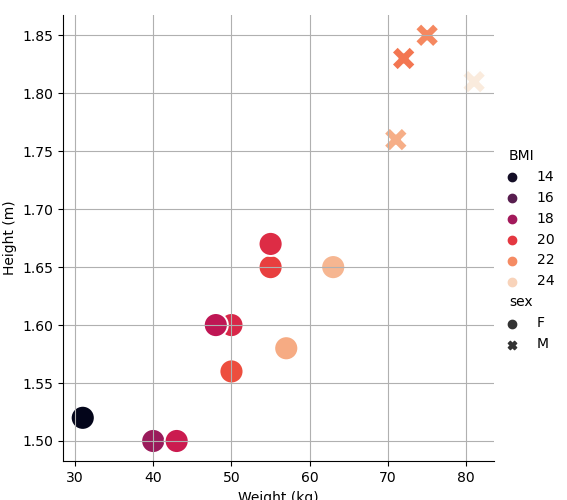

<IPython.core.display.Javascript object>


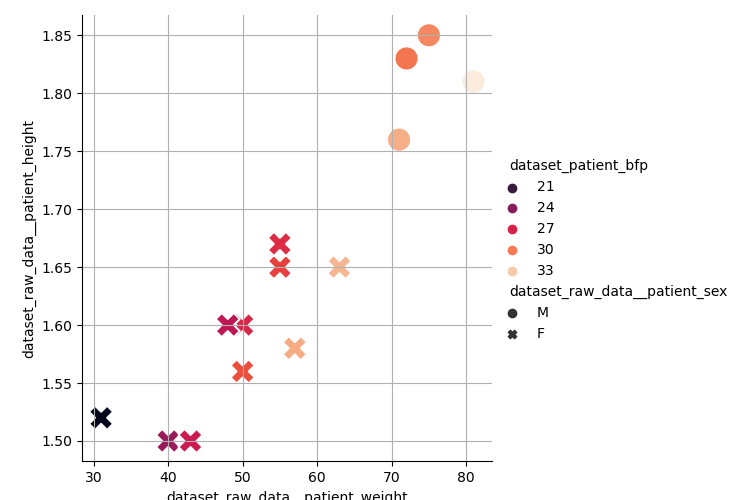

Mean weight = 56.50kgs +/-14.42 
Mean height = 1.65m +/-0.12 
Mean BMI = 20.43 +/-2.82 
Sex = M(4) F(10)


In [30]:
df = df_sc.loc[df_sc["study"] == 1]

this_df = df

this_df = this_df.rename(columns = {'dataset_raw_data__patient_weight':'Weight (kg)'})
this_df = this_df.rename(columns = {'dataset_raw_data__patient_height':'Height (m)'})
this_df = this_df.rename(columns = {'dataset_patient_bmi':'BMI'})
this_df = this_df.rename(columns = {'dataset_raw_data__patient_sex':'sex'})
 
g = sns.relplot(x="Weight (kg)", y="Height (m)", hue="BMI", palette=cm, style="sex", style_order=['F', 'M'],
                s=300, data=this_df)
g.ax.xaxis.grid(True)
g.ax.yaxis.grid(True)

x = df["dataset_raw_data__patient_weight"]
y = df["dataset_raw_data__patient_height"]
z = df["dataset_patient_bfp"]
zz = df["dataset_raw_data__patient_sex"]
g = sns.relplot(x=x, y=y, hue=z, palette=cm, style=zz, s=300)
g.ax.xaxis.grid(True)
g.ax.yaxis.grid(True)

print("Mean weight = %.2fkgs +/-%.2f " % (df["dataset_raw_data__patient_weight"].mean(),
                                          df["dataset_raw_data__patient_weight"].std()))
print("Mean height = %.2fm +/-%.2f " % (df["dataset_raw_data__patient_height"].mean(),
                                        df["dataset_raw_data__patient_height"].std()))
print("Mean BMI = %.2f +/-%.2f " % (df["dataset_patient_bmi"].mean(), 
                                    df["dataset_patient_bmi"].std()))

sex_counts = df["dataset_raw_data__patient_sex"].value_counts()
print("Sex = M(%d) F(%d)" % (sex_counts["M"], sex_counts["F"]))

Well ok, the cohort is not super... A lot of women, small and thin. :s

## $B_1$ power (ref. voltage) & BMI
Do we have a dependence between reference voltage and BMI/BFP?

<IPython.core.display.Javascript object>


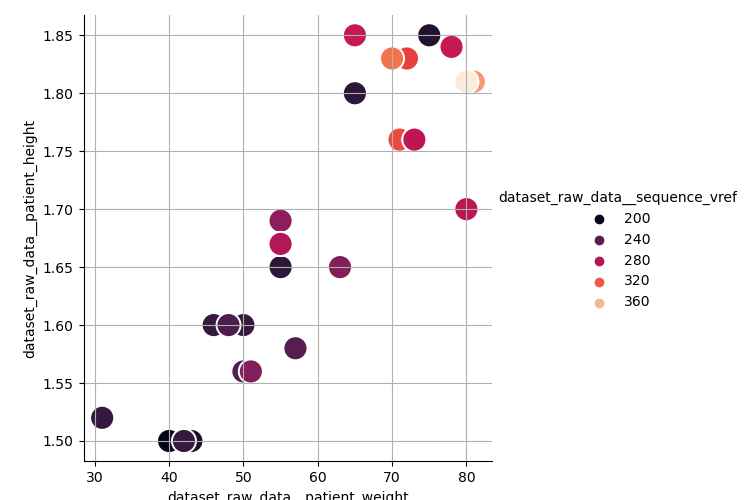

<IPython.core.display.Javascript object>


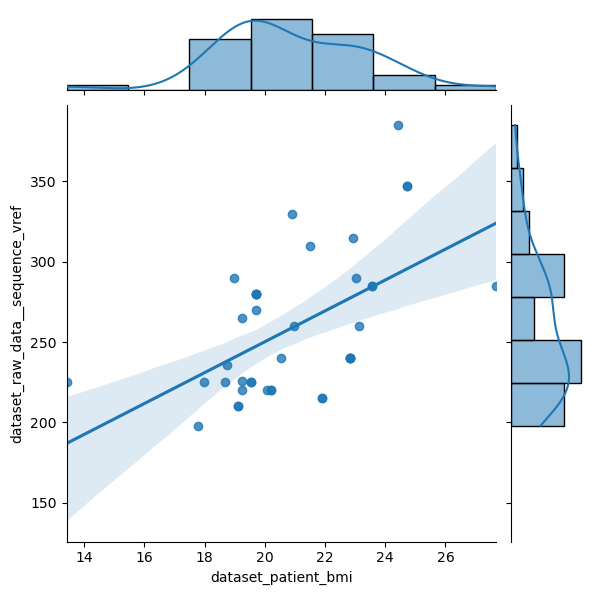

R = 0.55


<IPython.core.display.Javascript object>


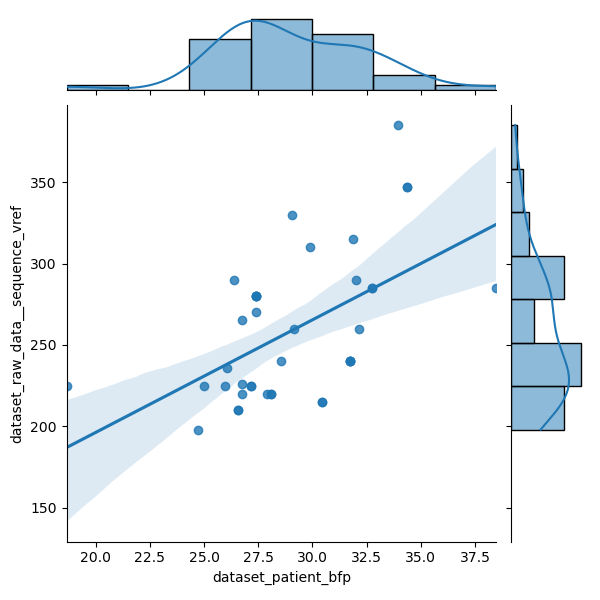

R = 0.55


In [31]:
df = df_sc_all_slaser

x = df["dataset_raw_data__patient_weight"]
y = df["dataset_raw_data__patient_height"]
z = df["dataset_raw_data__sequence_vref"]
g = sns.relplot(x=x, y=y, hue=z, palette=cm, s=300)
g.ax.xaxis.grid(True)
g.ax.yaxis.grid(True)

x = df["dataset_patient_bmi"]
y = df["dataset_raw_data__sequence_vref"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["dataset_patient_bfp"]
y = df["dataset_raw_data__sequence_vref"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

Like for SC imaging, there is here a "strong" correlation between Vref and BMI/BFP.

## Voxel position & BMI
Does the voxel position change with BMI?

<IPython.core.display.Javascript object>


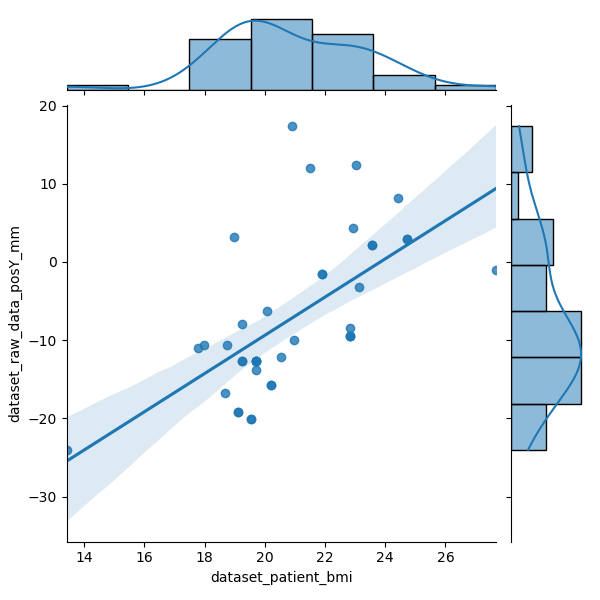

R = 0.63


<IPython.core.display.Javascript object>


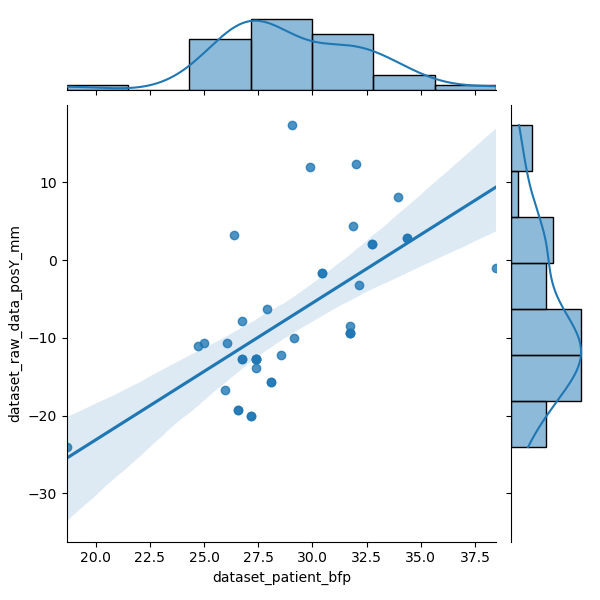

R = 0.63


In [32]:
df = df_sc_all_slaser

x = df["dataset_patient_bmi"]
y = -df["dataset_raw_data_posY_mm"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["dataset_patient_bfp"]
y = -df["dataset_raw_data_posY_mm"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

The voxel position in Y is nicely correlated with BMI/BFP. THe bigger you are, the higher will the voxel and therefore the further a way from the coil...

# Data quality

## SNR & LW vs. BMI

<IPython.core.display.Javascript object>


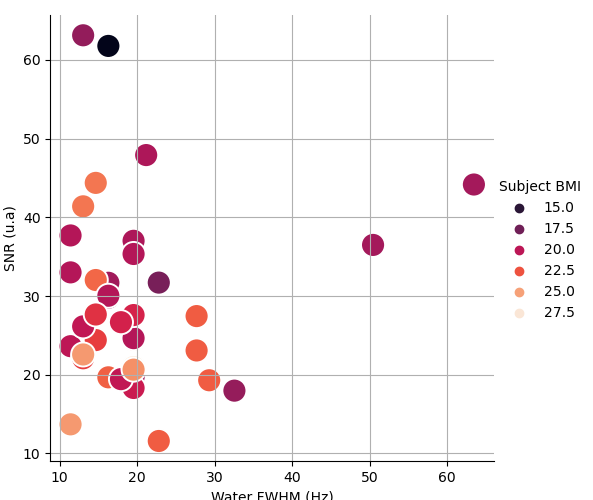

<IPython.core.display.Javascript object>


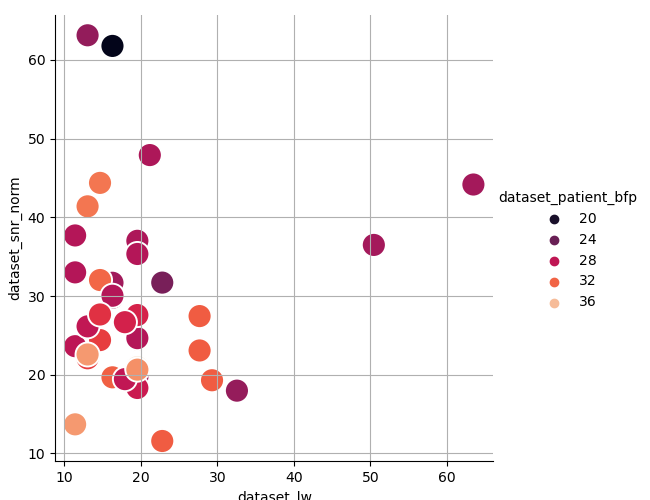

<IPython.core.display.Javascript object>


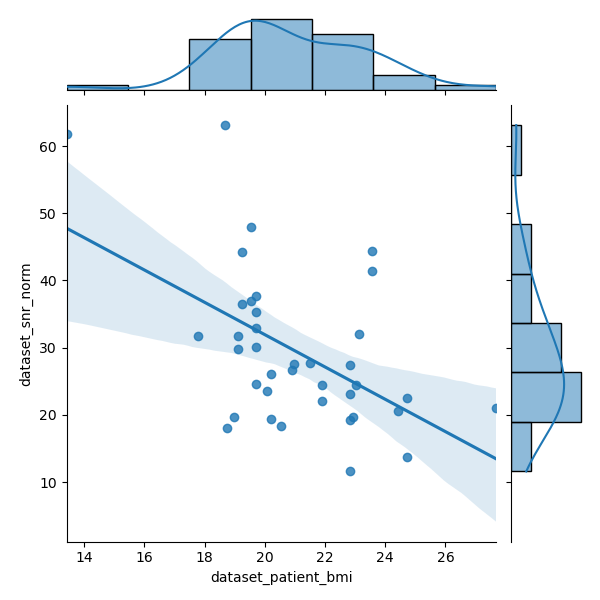

R = -0.52


<IPython.core.display.Javascript object>


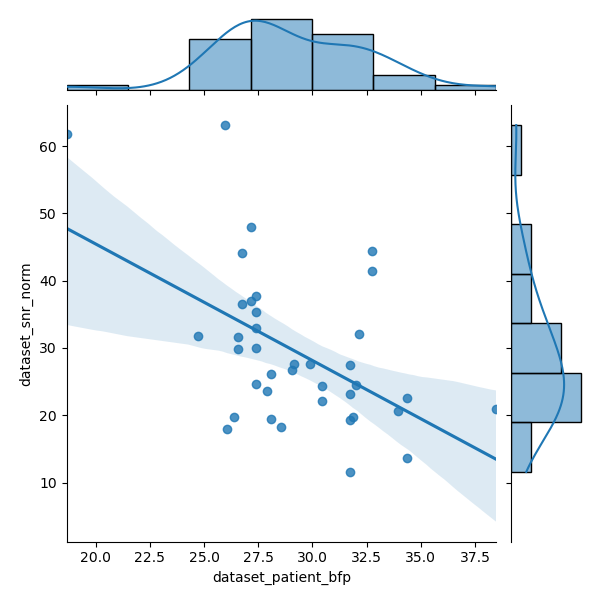

R = -0.52


In [33]:
df = df_sc_all_slaser

this_df = df
this_df = this_df.rename(columns = {'dataset_lw':'Water FWHM (Hz)'})
this_df = this_df.rename(columns = {'dataset_snr_norm':'SNR (u.a)'})
this_df = this_df.rename(columns = {'dataset_patient_bmi':'Subject BMI'})
g = sns.relplot(x="Water FWHM (Hz)", y="SNR (u.a)", hue="Subject BMI", palette=cm, s=300, data=this_df)
g.ax.xaxis.grid(True)
g.ax.yaxis.grid(True)

x = df["dataset_lw"]
y = df["dataset_snr_norm"]
z = df["dataset_patient_bfp"]
g = sns.relplot(x=x, y=y, hue=z, palette=cm, s=300)
g.ax.xaxis.grid(True)
g.ax.yaxis.grid(True)

# only SNR
x = df["dataset_patient_bmi"]
y = df["dataset_snr_norm"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["dataset_patient_bfp"]
y = df["dataset_snr_norm"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))


## SNR vs. voxel position (BMI)

There could be some slight SNR dependance with BMI...

SNR is normalized by:
* voxel position in Y

Therefore
* SNR values are multiplied by $(1+\frac{y^2}{R^2})^{\frac{2}{3}}$ and multiplied by $(1+\frac{y_{mean}^2}{R^2})^{\frac{2}{3}}$

According to the Biot–Savart law (Jackson, 1975), cited in https://doi.org/10.1201/9781315107325, the distance relative to the RF loop surface coil impacts SNR with a $(1+\frac{y^2}{R^2})^{\frac{2}{3}}$ term. $y$ is the absolute distance between the voxel and the RF coil, $R$ is the coil radius. $y_{mean}$ is the average $y$ position over the whole group.

The problem is to evaluate this absolute distance to coil when I only know the voxel position relative to the magnet center... Let's take the lowest voxel position in the study group, probably for the thinnest subject and consider that we were 4cm away from the coil.

Ok, another problem is that we were using a multi-channel Rx spinal cord coil. What do I put for the radius? Assuing a 14cm radius coil... Big approximation.

<IPython.core.display.Javascript object>


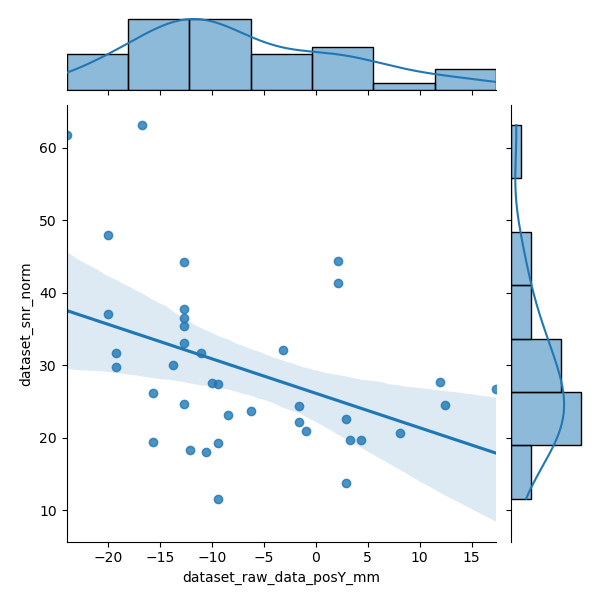

R = -0.41


<IPython.core.display.Javascript object>


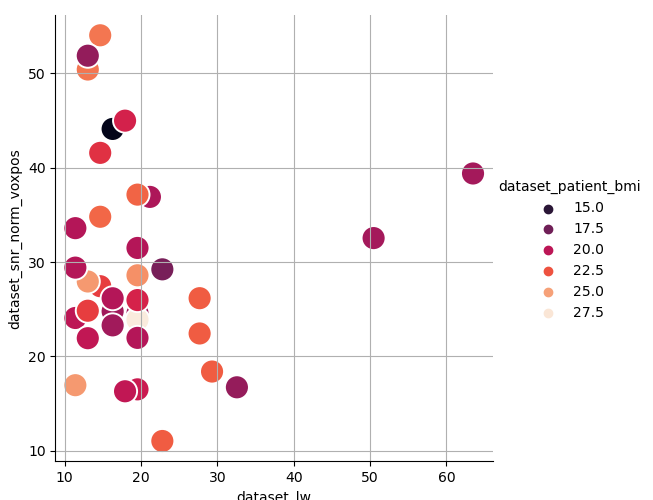

<IPython.core.display.Javascript object>


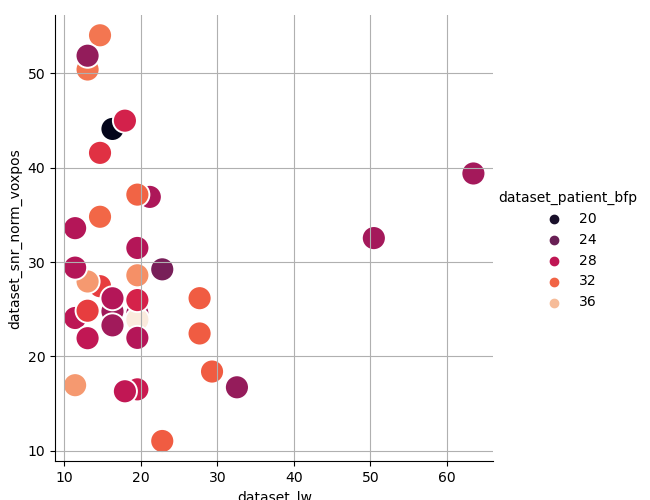

<IPython.core.display.Javascript object>


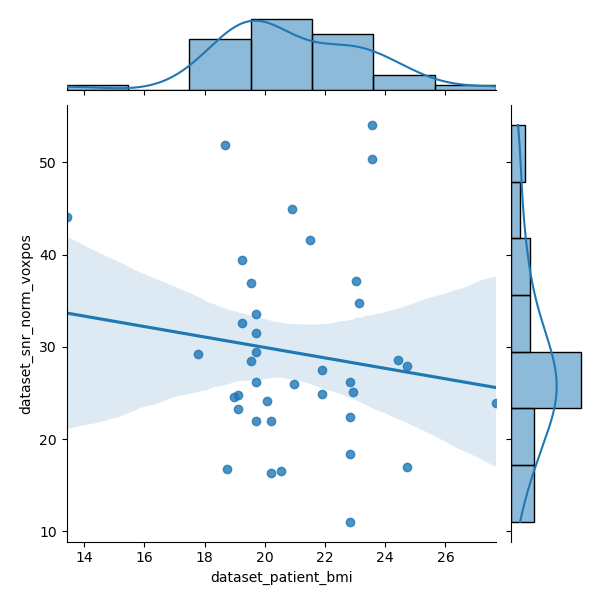

R = -0.14


<IPython.core.display.Javascript object>

R = -0.14


In [34]:
df = df_sc_all_slaser

# does the Y position has an effect on SNR?
x = -df["dataset_raw_data_posY_mm"]
y = df["dataset_snr_norm"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

# Y voxel position normalization
min_dist_voxel_coil_mm = 40.0  # mm
coil_radius_mm = 140.0 / 2  # mm 
# looking for minimum Y position
max_pos = np.max(df["dataset_raw_data_posY_mm"])
df["dataset_raw_data_posY_mm_abs"] = -(df["dataset_raw_data_posY_mm"] - max_pos) + min_dist_voxel_coil_mm
mean_abs_y_pos = df["dataset_raw_data_posY_mm_abs"].mean()
# normalization
df["dataset_snr_norm_voxpos"] = df["dataset_snr_norm"] * np.power(1 + np.power(df["dataset_raw_data_posY_mm_abs"], 2) / np.power(coil_radius_mm, 2), 3/2)
df["dataset_snr_norm_voxpos"] = df["dataset_snr_norm_voxpos"] / np.power(1 + np.power(mean_abs_y_pos, 2) / np.power(coil_radius_mm, 2), 3/2)

x = df["dataset_lw"]
y = df["dataset_snr_norm_voxpos"]
z = df["dataset_patient_bmi"]
g = sns.relplot(x=x, y=y, hue=z, palette=cm, s=300)
g.ax.xaxis.grid(True)
g.ax.yaxis.grid(True)

x = df["dataset_lw"]
y = df["dataset_snr_norm_voxpos"]
z = df["dataset_patient_bfp"]
g = sns.relplot(x=x, y=y, hue=z, palette=cm, s=300)
g.ax.xaxis.grid(True)
g.ax.yaxis.grid(True)

# only SNR
x = df["dataset_patient_bmi"]
y = df["dataset_snr_norm_voxpos"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["dataset_patient_bfp"]
y = df["dataset_snr_norm_voxpos"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

No more correlation in those last plots? Because we corected the SNR change due to voxel Y position.

To conclude, SNR is dependant on a few things:
* Of course, NA and voxel size
* But also Y voxel position and there those patient weight/height/BMI/BFP

# Signal stability, data quality & rejection

## SNR & signal stability
Before performing data rejection, the time evolution of the water peak amplitude, linewidth, chemical shift and phase are estimated. In a way, those estimations reflect signal stability or instability (due to physio motion). Could it affect the SNR?

<IPython.core.display.Javascript object>


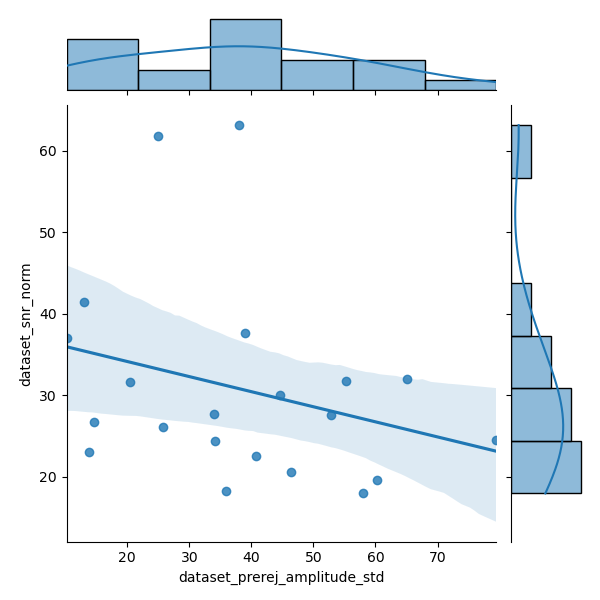

R = -0.28


<IPython.core.display.Javascript object>


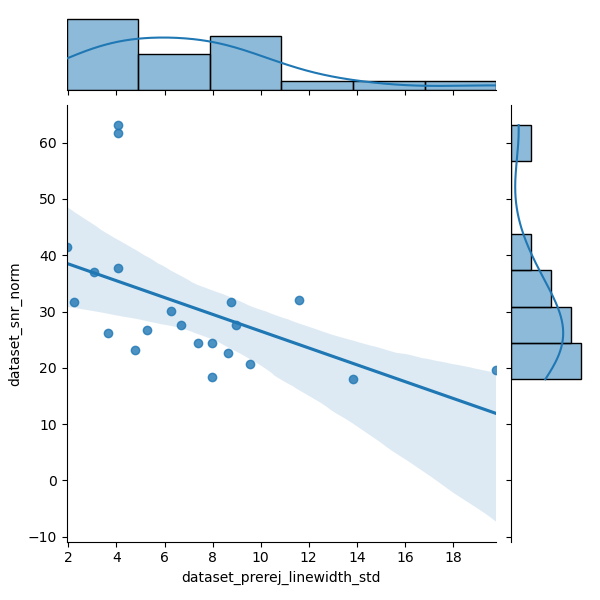

R = -0.51


<IPython.core.display.Javascript object>


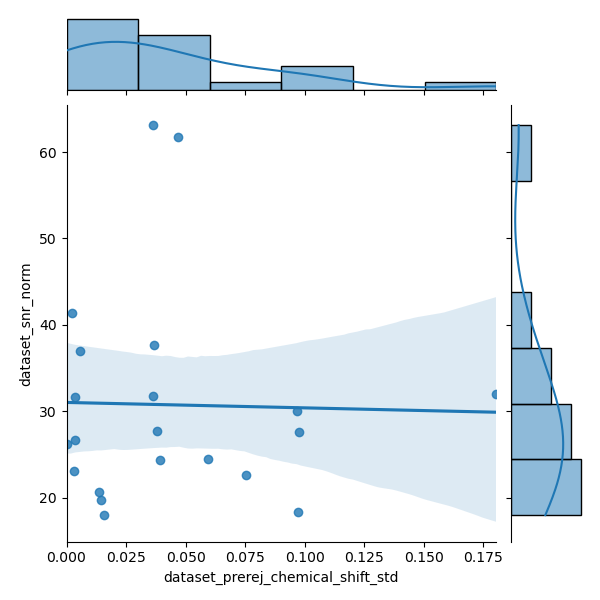

R = -0.02


<IPython.core.display.Javascript object>

R = -0.23


In [35]:
df = df_sc

x = df["dataset_prerej_amplitude_std"].astype(np.float)
y = df["dataset_snr_norm"].astype(np.float)
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["dataset_prerej_linewidth_std"].astype(np.float)
y = df["dataset_snr_norm"].astype(np.float)
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["dataset_prerej_chemical_shift_std"].astype(np.float)
y = df["dataset_snr_norm"].astype(np.float)
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["dataset_prerej_phase_std"].astype(np.float)
y = df["dataset_snr_norm"].astype(np.float)
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

Nice results but not very significant...
SNR increases if the acquired signal is stable in terms of amplitude, linewidth, chemical shift and phase

## Data rejection & signal stability

<IPython.core.display.Javascript object>

R = 0.25


<IPython.core.display.Javascript object>

R = 0.46


<IPython.core.display.Javascript object>


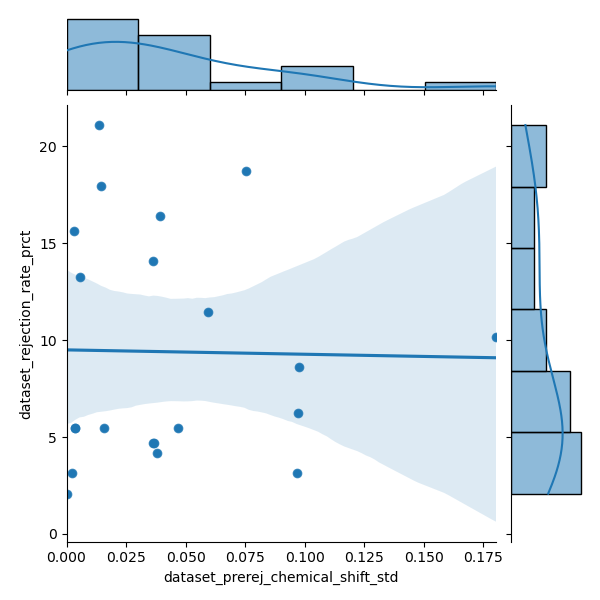

R = -0.02


<IPython.core.display.Javascript object>

R = 0.19


In [36]:
df = df_sc

x = df["dataset_prerej_amplitude_std"]
y = df["dataset_rejection_rate_prct"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["dataset_prerej_linewidth_std"]
y = df["dataset_rejection_rate_prct"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["dataset_prerej_chemical_shift_std"]
y = df["dataset_rejection_rate_prct"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["dataset_prerej_phase_std"]
y = df["dataset_rejection_rate_prct"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

Interesting but not super significant, as usual. The amount of data we rejected during reconstruction depends on the signal stability (amplitude, **linewidth**, chemical shift and phase).

## Data rejection rate & acquisition time

In [37]:
df = df_sc

x = df["dataset_acqtime_eff"]
y = df["dataset_rejection_rate_prct"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["dataset_acqtime"]
y = df["dataset_rejection_rate_prct"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

<IPython.core.display.Javascript object>

R = 0.05


<IPython.core.display.Javascript object>

R = 0.25


Interesting but not super significant, as usual. The amount of data we rejected during reconstruction depends on the acquisition time (the longer you scan, the higher the probability to have some motion).

## Signal stability & heart beat
What about physio motion like heart and respiration? It should be reflected in the signal instabilities...

<IPython.core.display.Javascript object>

R = -0.22


<IPython.core.display.Javascript object>


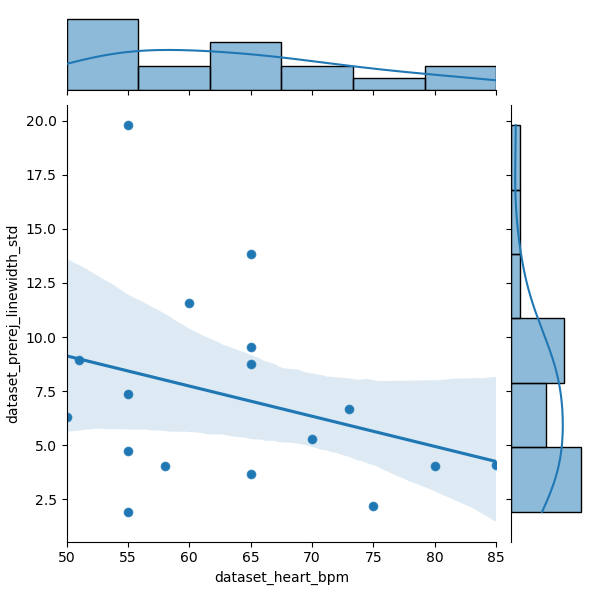

R = -0.31


<IPython.core.display.Javascript object>

R = -0.09


<IPython.core.display.Javascript object>

R = -0.26


In [38]:
df = df_sc

x = df["dataset_heart_bpm"].astype(np.float)
y = df["dataset_prerej_amplitude_std"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["dataset_heart_bpm"].astype(np.float)
y = df["dataset_prerej_linewidth_std"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["dataset_heart_bpm"].astype(np.float)
y = df["dataset_prerej_chemical_shift_std"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["dataset_heart_bpm"].astype(np.float)
y = df["dataset_prerej_phase_std"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

Well, heart beat has apparently no influence on signal stability and therefore on our MRS data quality...

## Signal stability & respiration
Maybe respiration does explain the differences in signal stability between subjects?

<IPython.core.display.Javascript object>

R = -0.47


<IPython.core.display.Javascript object>


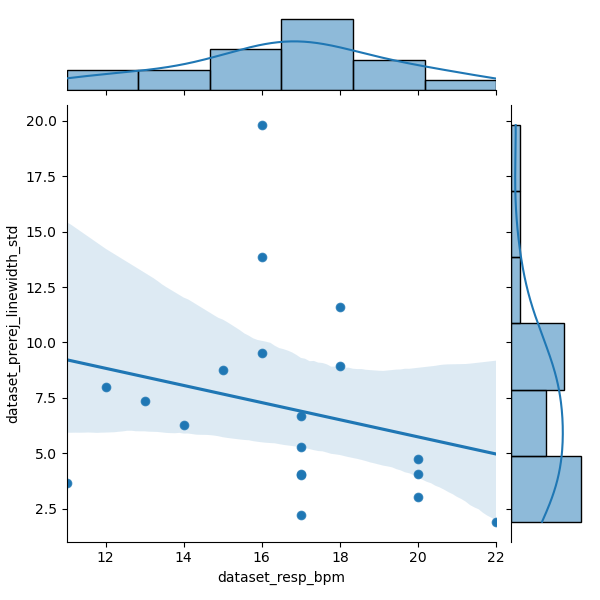

R = -0.25


<IPython.core.display.Javascript object>


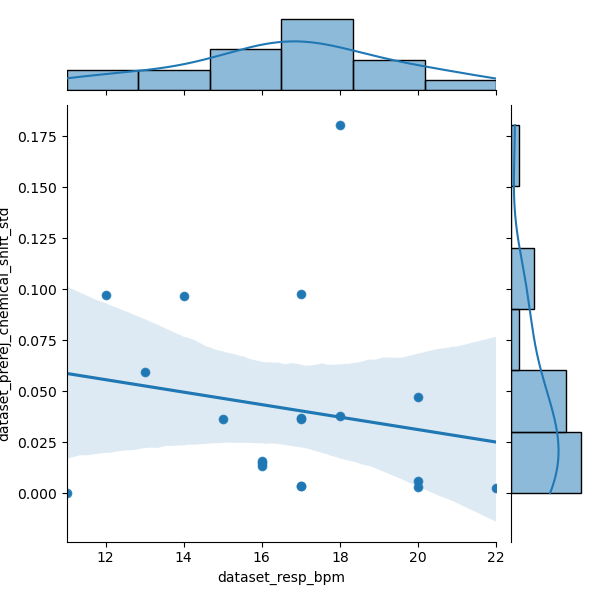

R = -0.18


<IPython.core.display.Javascript object>

R = -0.43


In [39]:
df = df_sc

x = df["dataset_resp_bpm"].astype(np.float)
y = df["dataset_prerej_amplitude_std"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["dataset_resp_bpm"].astype(np.float)
y = df["dataset_prerej_linewidth_std"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["dataset_resp_bpm"].astype(np.float)
y = df["dataset_prerej_chemical_shift_std"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["dataset_resp_bpm"].astype(np.float)
y = df["dataset_prerej_phase_std"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

Nope, does not make any sense.

## Signal stability & BMI/BFP
Maybe big people move less or more ? Just curious...

<IPython.core.display.Javascript object>

R = 0.19


<IPython.core.display.Javascript object>

R = 0.29


<IPython.core.display.Javascript object>


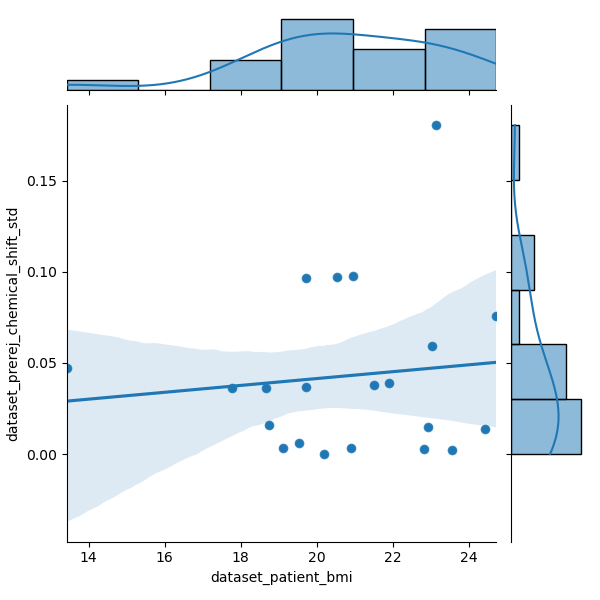

R = 0.11


<IPython.core.display.Javascript object>


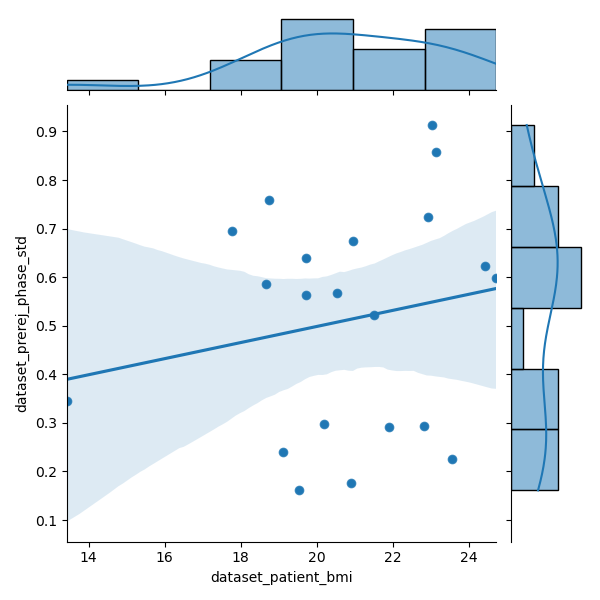

R = 0.19


In [40]:
df = df_sc

x = df["dataset_patient_bmi"].astype(np.float)
y = df["dataset_prerej_amplitude_std"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["dataset_patient_bmi"].astype(np.float)
y = df["dataset_prerej_linewidth_std"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["dataset_patient_bmi"].astype(np.float)
y = df["dataset_prerej_chemical_shift_std"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["dataset_patient_bmi"].astype(np.float)
y = df["dataset_prerej_phase_std"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

Nothing interesting here...

# SC curve and data quality ?

## Extract voxel rotation angle

In [41]:
from suspect.io.siemens import read_csa_header, rotation_matrix
import pydicom.dicomio

def add_voxel_angle(this_df):
    
    for this_index, this_row in this_df.iterrows():
        dsf = this_row["dataset_dcm_files[0]"]
        if(not dsf.endswith(".dcm")):
            dsf = dsf + "/original-primary_e09_0001.dcm"
        dataset = pydicom.dicomio.read_file(dsf)

        # now look through the tags (0029, 00xx) to work out which xx refers to the csa header
        # xx seems to start at 10 for Siemens
        xx = 0x0010
        header_index = 0
        while (0x0029, xx) in dataset:
            if dataset[0x0029, xx].value == "SIEMENS CSA HEADER":
                header_index = xx
            xx += 1
        # check that we have found the header
        if header_index == 0:
            raise KeyError("Could not find header index")
        # now we know which tag contains the CSA image header info: (0029, xx10)
        csa_header_bytes = dataset[0x0029, 0x0100 * header_index + 0x0010].value
        csa_header = read_csa_header(csa_header_bytes)
        in_plane_rot = csa_header["VoiInPlaneRotation"]
        normal_vector = csa_header["VoiOrientation"]
        rot_matrix = rotation_matrix(in_plane_rot, normal_vector)

        rot_matrix = np.array(rot_matrix)
        tetax_deg = np.arctan2(rot_matrix[3-1][2-1], rot_matrix[3-1][3-1]) * 180 / np.pi
        tetay_deg = np.arctan2(-rot_matrix[3-1][1-1], np.sqrt( rot_matrix[3-1][2-1]**2 + rot_matrix[3-1][3-1]**2)) * 180 / np.pi
        tetaz_deg = np.arctan2(rot_matrix[2-1][1-1], rot_matrix[1-1][1-1]) * 180 / np.pi

        print("VoiInPlaneRotation (deg) = %.2f" % (in_plane_rot * 180 / np.pi))
        print("X (deg) = %.2f" % tetax_deg)
        print("Y (deg) = %.2f" % tetay_deg)
        print("Z (deg) = %.2f" % tetaz_deg)
        print()

        
        # store in df
        this_df.at[this_index, "dataset_voxel_angle_max_deg"] = max(np.abs([tetax_deg, tetay_deg, tetaz_deg]))
 
    return(this_df)

df_sc = add_voxel_angle(df_sc)
df_sc_all_slaser = add_voxel_angle(df_sc_all_slaser)


VoiInPlaneRotation (deg) = -0.11
X (deg) = 0.00
Y (deg) = -0.00
Z (deg) = -0.11

VoiInPlaneRotation (deg) = -0.21
X (deg) = 0.00
Y (deg) = 0.07
Z (deg) = -0.20

VoiInPlaneRotation (deg) = 0.07
X (deg) = 0.00
Y (deg) = -0.01
Z (deg) = 0.07

VoiInPlaneRotation (deg) = -0.17
X (deg) = -0.00
Y (deg) = -0.01
Z (deg) = -0.17

VoiInPlaneRotation (deg) = 0.46
X (deg) = -0.02
Y (deg) = -0.07
Z (deg) = 0.45

VoiInPlaneRotation (deg) = -4.70
X (deg) = -4.70
Y (deg) = 0.02
Z (deg) = 0.00

VoiInPlaneRotation (deg) = -4.38
X (deg) = -4.38
Y (deg) = 0.01
Z (deg) = 0.00

VoiInPlaneRotation (deg) = -6.29
X (deg) = -6.29
Y (deg) = -0.02
Z (deg) = -0.00

VoiInPlaneRotation (deg) = 0.09
X (deg) = -0.00
Y (deg) = -0.01
Z (deg) = 0.09

VoiInPlaneRotation (deg) = 0.13
X (deg) = -0.00
Y (deg) = -0.02
Z (deg) = 0.13

VoiInPlaneRotation (deg) = -0.34
X (deg) = -0.00
Y (deg) = 0.08
Z (deg) = -0.33

VoiInPlaneRotation (deg) = 0.17
X (deg) = -0.00
Y (deg) = -0.03
Z (deg) = 0.17

VoiInPlaneRotation (deg) = 0.00
X (

## SNR vs. voxel rotation
and indirectly spinal cord curve

In [42]:
df = df_sc_all_slaser

x = df["dataset_voxel_angle_max_deg"]
y = df["dataset_snr_norm"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

<IPython.core.display.Javascript object>

R = -0.22


Nothing intesting, voxel rotation does not impact SNR.

## Extract T2w images
To check visually the cord curve

296_1
/home/tangir/crmbm/acq/296_ym_p1_brainmoelle/296-ym-p1-brainmoelle/20190626/02_0006_t2-tse-sag-2d-5sl-p2-trig-s5-nd/original-primary-m-norm-nd_e01_0005.dcm


<IPython.core.display.Javascript object>


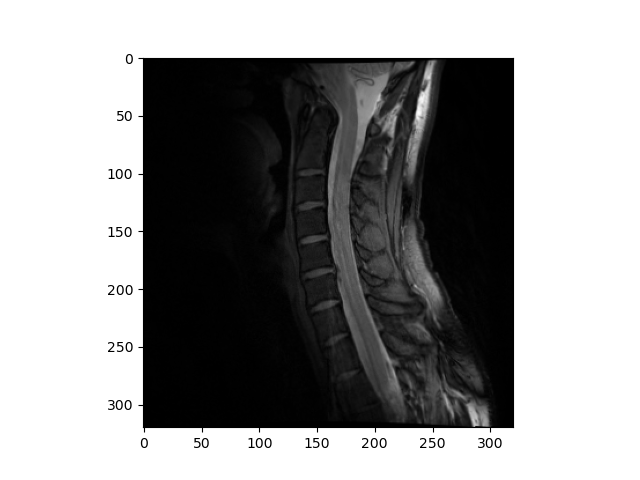

300_1
/home/tangir/crmbm/acq/300-pm-p1-moelle/20190716/01_0003_t2-tse-sag-2d-5sl-p2-trig/original-primary-m-dis2d-norm_e01_0004.dcm


<IPython.core.display.Javascript object>


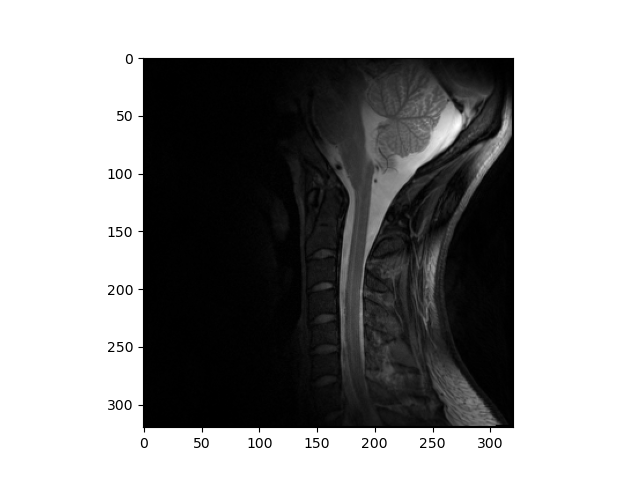

300_1
/home/tangir/crmbm/acq/300-pm-p1-moelle/20190716/01_0003_t2-tse-sag-2d-5sl-p2-trig/original-primary-m-dis2d-norm_e01_0004.dcm


<IPython.core.display.Javascript object>

304_1
/home/tangir/crmbm/acq/304-ka-p1-moelle/20190814/01_0003_t2-tse-sag-2d-5sl-p2-trig-s2-nd/original-primary-m-norm-nd_e01_0005.dcm


<IPython.core.display.Javascript object>

307_1
/home/tangir/crmbm/acq/307-ap-p1-moelle/20190821/01_0006_t2-tse-sag-2d-5sl-p2-trig-s4-nd/original-primary-m-norm-nd_e01_0005.dcm


<IPython.core.display.Javascript object>

307_1
/home/tangir/crmbm/acq/307-ap-p1-moelle/20190821/01_0006_t2-tse-sag-2d-5sl-p2-trig-s4-nd/original-primary-m-norm-nd_e01_0005.dcm


<IPython.core.display.Javascript object>


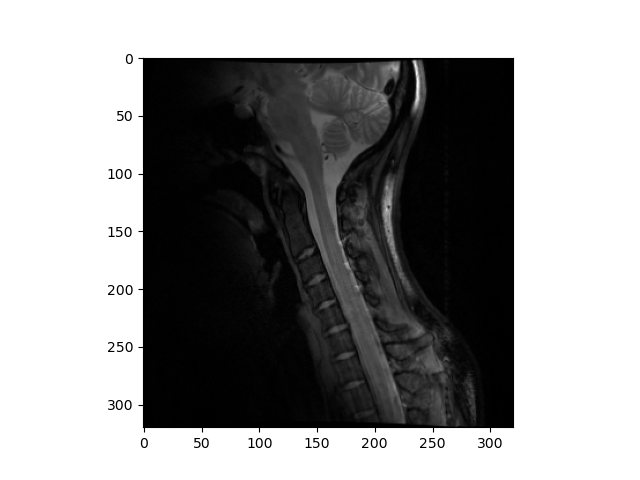

307_1
/home/tangir/crmbm/acq/307-ap-p1-moelle/20190821/01_0006_t2-tse-sag-2d-5sl-p2-trig-s4-nd/original-primary-m-norm-nd_e01_0005.dcm


<IPython.core.display.Javascript object>

307_1
/home/tangir/crmbm/acq/307-ap-p1-moelle/20190821/01_0006_t2-tse-sag-2d-5sl-p2-trig-s4-nd/original-primary-m-norm-nd_e01_0005.dcm


<IPython.core.display.Javascript object>

308_1
/home/tangir/crmbm/acq/308-rs-p1-moelle/20190827/01_0006_t2-tse-sag-2d-5sl-p2-trig-s5-nd/original-primary-m-norm-nd_e01_0005.dcm


<IPython.core.display.Javascript object>


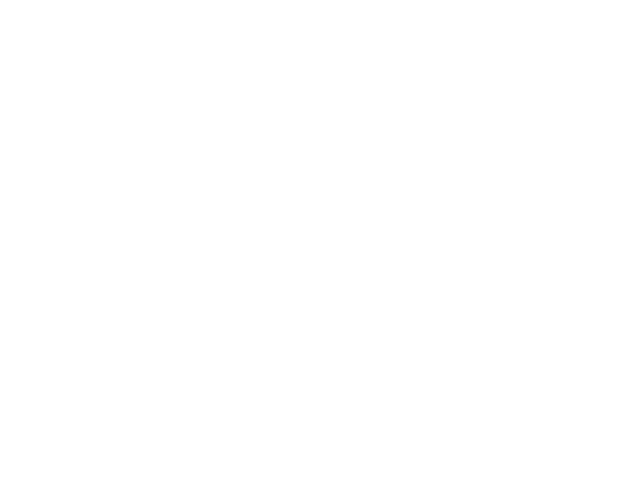

310_1
/home/tangir/crmbm/acq/310-mg-p1-moelle/20190829/01_0004_t2-tse-sag-2d-5sl-p2-trig/original-primary-m-dis2d-norm_e01_0004.dcm


<IPython.core.display.Javascript object>


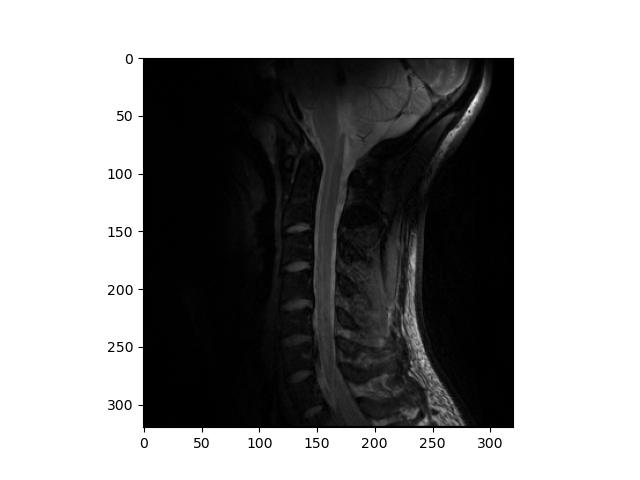

311_1
/home/tangir/crmbm/acq/311-sl-p1-moelle/20190905/01_0010_t2-tse-sag-2d-5sl-p2-trig/original-primary-m-dis2d-norm_e01_0004.dcm


<IPython.core.display.Javascript object>

313_1
/home/tangir/crmbm/acq/313-ft-p1-moelle/20190923/01_0006_t2-tse-sag-2d-5sl-p2-trig-s5-nd/original-primary-m-norm-nd_e01_0005.dcm


<IPython.core.display.Javascript object>


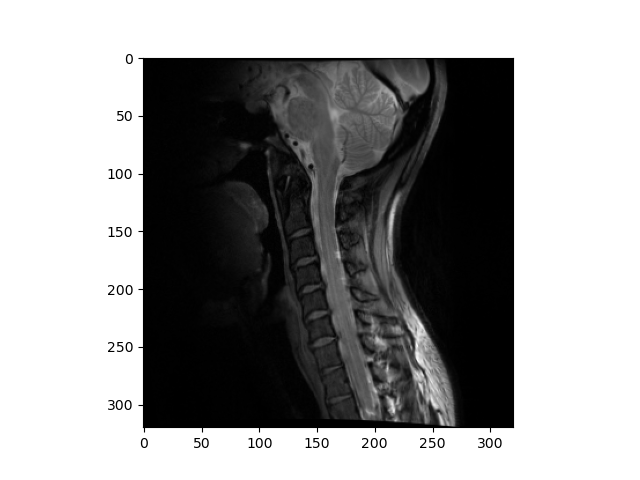

314_1
/home/tangir/crmbm/acq/314-yt-p1-moelle/20190925/01_0013_t2-tse-sag-2d-5sl-p2-trig/original-primary-m-dis2d-norm_e01_0004.dcm


<IPython.core.display.Javascript object>

314_1
/home/tangir/crmbm/acq/314-yt-p1-moelle/20190925/01_0013_t2-tse-sag-2d-5sl-p2-trig/original-primary-m-dis2d-norm_e01_0004.dcm


<IPython.core.display.Javascript object>

316_1
/home/tangir/crmbm/acq/316-ap-p1-moelle/20191003/01_0013_t2-tse-sag-2d-5sl-p2-trig/original-primary-m-dis2d-norm_e01_0004.dcm


<IPython.core.display.Javascript object>


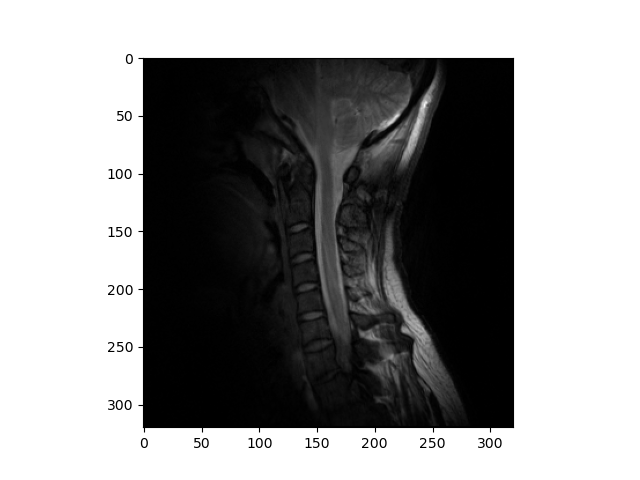

316_1
/home/tangir/crmbm/acq/316-ap-p1-moelle/20191003/01_0013_t2-tse-sag-2d-5sl-p2-trig/original-primary-m-dis2d-norm_e01_0004.dcm


<IPython.core.display.Javascript object>

319_1
/home/tangir/crmbm/acq/319-fc-p1-moelle/20191017/01_0012_t2-tse-sag-2d-5sl-p2-trig-s11-nd/original-primary-m-norm-nd_e01_0002.dcm


<IPython.core.display.Javascript object>

319_1
/home/tangir/crmbm/acq/319-fc-p1-moelle/20191017/01_0012_t2-tse-sag-2d-5sl-p2-trig-s11-nd/original-primary-m-norm-nd_e01_0002.dcm


<IPython.core.display.Javascript object>


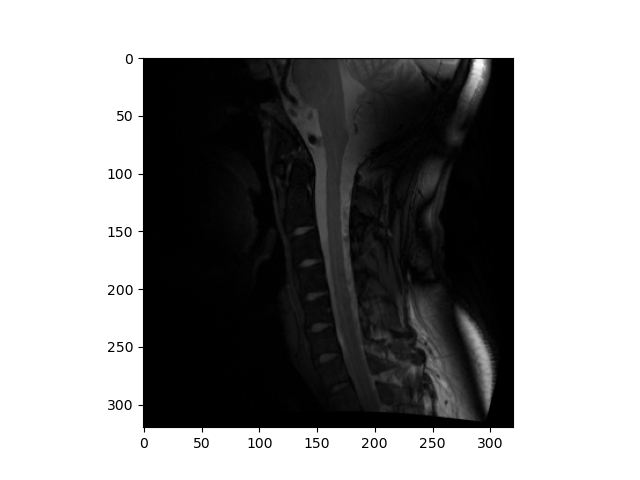

328_1
/home/tangir/crmbm/acq/328-af-p1-moelle/20191105/01_0006_t2-tse-sag-2d-5sl-p2-trig-s5-nd/original-primary-m-norm-nd_e01_0005.dcm


<IPython.core.display.Javascript object>

329_1
/home/tangir/crmbm/acq/329-pi-p1-moelle/20191108/01_0015_t2-tse-sag-2d-5sl-p2-trig-s14-nd/original-primary-m-norm-nd_e01_0005.dcm


<IPython.core.display.Javascript object>

329_1
/home/tangir/crmbm/acq/329-pi-p1-moelle/20191108/01_0015_t2-tse-sag-2d-5sl-p2-trig-s14-nd/original-primary-m-norm-nd_e01_0005.dcm


<IPython.core.display.Javascript object>


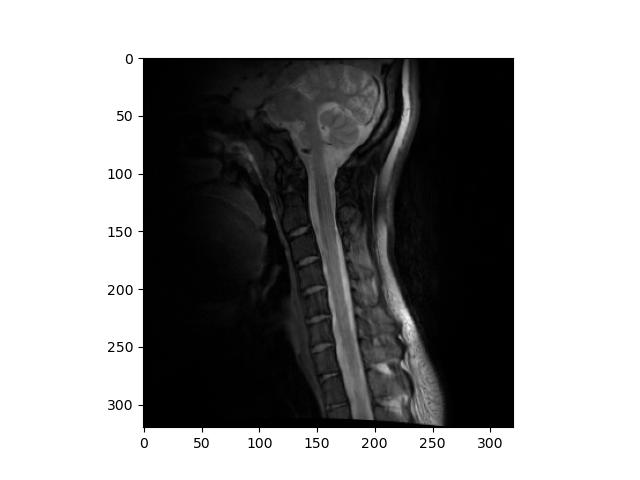

333_1
/home/tangir/crmbm/acq/333-sc-p1-moelle/20191126/01_0012_t2-tse-sag-2d-5sl-p2-trig-s11-nd/original-primary-m-norm-nd_e01_0005.dcm


<IPython.core.display.Javascript object>

336_1
/home/tangir/crmbm/acq/336-nb-p1-moelle/20191209/01_0006_t2-tse-sag-2d-5sl-p2-trig-s5-nd/original-primary-m-norm-nd_e01_0005.dcm


<IPython.core.display.Javascript object>


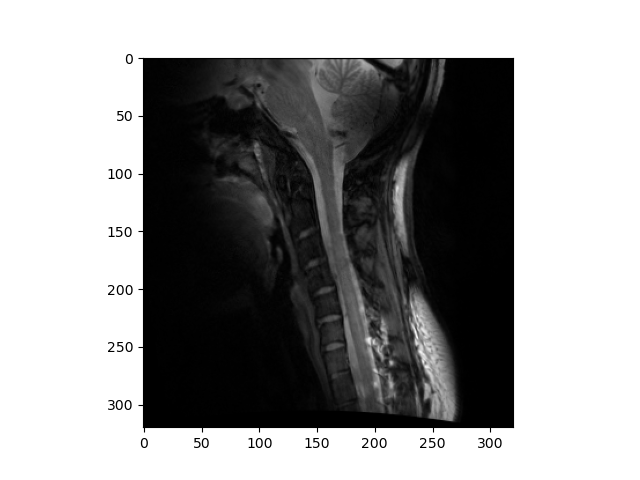

338_1
/home/tangir/crmbm/acq/338-ro-p1-moelle/20191210/01_0006_t2-tse-sag-2d-10sl-p2-trig-s5-nd/original-primary-m-norm-nd_e01_0009.dcm


<IPython.core.display.Javascript object>

300_2
/home/tangir/crmbm/acq/300-pm-p2-moelle/20200128/01_0005_t2-tse-sag-2d-10sl-p2-trig-s4-nd/original-primary-m-norm-nd_e01_0009.dcm


<IPython.core.display.Javascript object>

349_1
/home/tangir/crmbm/acq/349-ap-p1-moelle/20200206/01_0003_t2-tse-sag-2d-10sl-p2-trig/original-primary-m-dis2d-norm_e01_0008.dcm


<IPython.core.display.Javascript object>

355_1
/home/tangir/crmbm/acq/355-st-p1-moelle/20200224/01_0007_t2-tse-sag-2d-10sl-p2-trig-s6-nd/original-primary-m-norm-nd_e01_0009.dcm


<IPython.core.display.Javascript object>

304_2
/home/tangir/crmbm/acq/304-ka-p2-moelle/20200304/01_0004_t2-tse-sag-2d-10sl-p2-trig-s3-nd/original-primary-m-norm-nd_e01_0009.dcm


<IPython.core.display.Javascript object>

304_2
/home/tangir/crmbm/acq/304-ka-p2-moelle/20200304/01_0004_t2-tse-sag-2d-10sl-p2-trig-s3-nd/original-primary-m-norm-nd_e01_0009.dcm


<IPython.core.display.Javascript object>


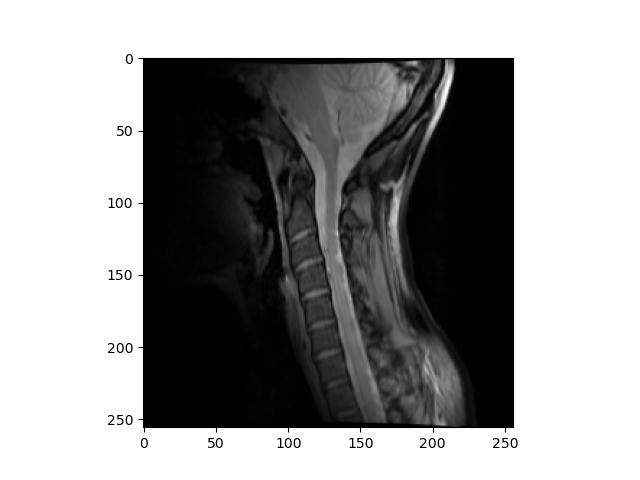

311_2
/home/tangir/crmbm/acq/311-sl-p2-moelle/20200529/01_0006_t2-tse-sag-2d-10sl-p2-trig-s5-nd/original-primary-m-norm-nd_e01_0009.dcm


<IPython.core.display.Javascript object>

311_2
/home/tangir/crmbm/acq/311-sl-p2-moelle/20200529/01_0006_t2-tse-sag-2d-10sl-p2-trig-s5-nd/original-primary-m-norm-nd_e01_0009.dcm


<IPython.core.display.Javascript object>


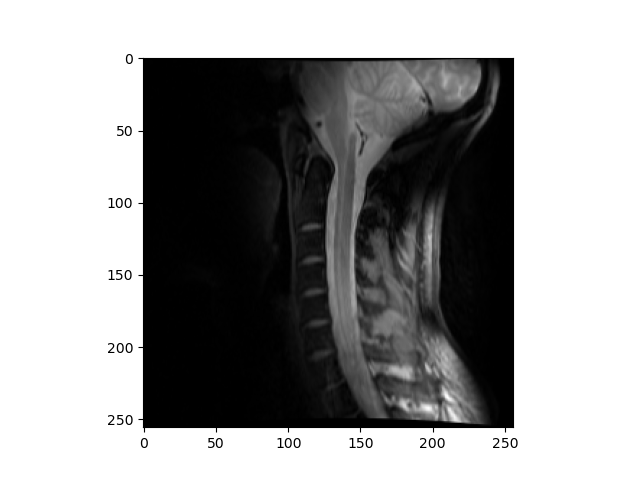

336_2
/home/tangir/crmbm/acq/336-nb-p2-moelle/20200609/01_0018_t2-tse-sag-2d-10sl-p2-trig-s17-nd/original-primary-m-norm-nd_e01_0009.dcm


<IPython.core.display.Javascript object>

336_2
/home/tangir/crmbm/acq/336-nb-p2-moelle/20200609/01_0018_t2-tse-sag-2d-10sl-p2-trig-s17-nd/original-primary-m-norm-nd_e01_0009.dcm


<IPython.core.display.Javascript object>

336_2
/home/tangir/crmbm/acq/336-nb-p2-moelle/20200609/01_0018_t2-tse-sag-2d-10sl-p2-trig-s17-nd/original-primary-m-norm-nd_e01_0009.dcm


<IPython.core.display.Javascript object>


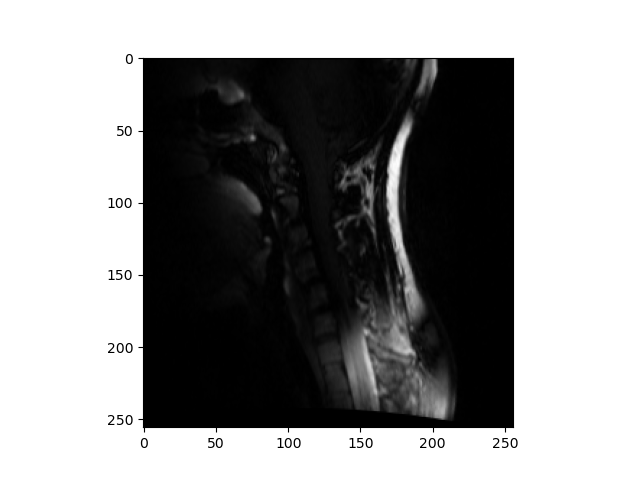

336_2
/home/tangir/crmbm/acq/336-nb-p2-moelle/20200609/01_0018_t2-tse-sag-2d-10sl-p2-trig-s17-nd/original-primary-m-norm-nd_e01_0009.dcm


<IPython.core.display.Javascript object>

319_2
/home/tangir/crmbm/acq/319-fc-p2-moelle/20200611/01_0006_t2-tse-sag-2d-10sl-p2-trig-s5-nd/original-primary-m-norm-nd_e01_0009.dcm


<IPython.core.display.Javascript object>

313_2
/home/tangir/crmbm/acq/313-ft-p2-moelle/20200615/01_0010_t2-tse-sag-2d-10sl-p2-trig-s9-nd/original-primary-m-norm-nd_e01_0009.dcm


<IPython.core.display.Javascript object>

333_2
/home/tangir/crmbm/acq/333-sc-p2-moelle/20200619/01_0005_t2-tse-sag-2d-10sl-p2-trig-s4-nd/original-primary-m-norm-nd_e01_0009.dcm


<IPython.core.display.Javascript object>


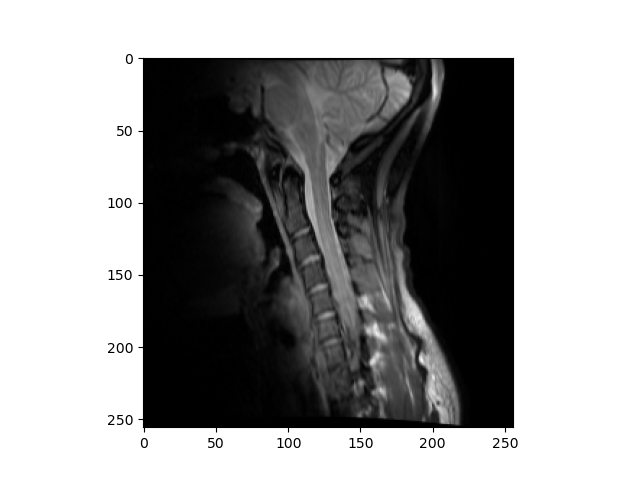

314_2
/home/tangir/crmbm/acq/314-yt-p2-moelle/20200625/01_0005_t2-tse-sag-2d-10sl-p2-trig-s4-nd/original-primary-m-norm-nd_e01_0009.dcm


<IPython.core.display.Javascript object>


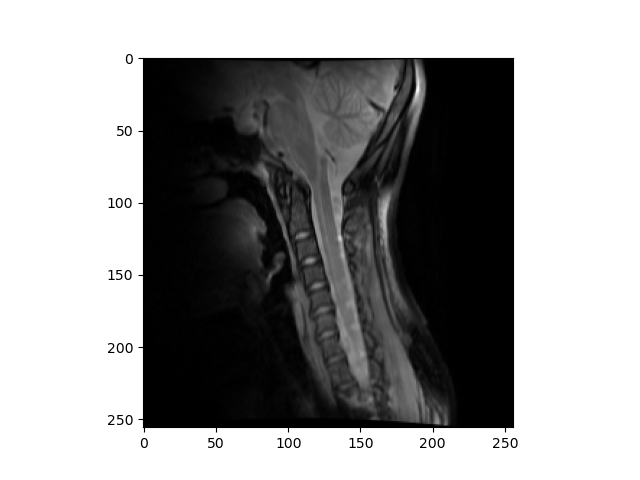

349_2
/home/tangir/crmbm/acq/349-ap-p2-moelle/20200925/01_0011_t2-tse-sag-2d-10sl-p2-trig/original-primary-m-dis2d-norm_e01_0008.dcm


<IPython.core.display.Javascript object>

In [43]:
import os

this_df = df_sc_all_slaser

for this_index, this_row in this_df.iterrows():
    
    # path to sLASER dcm file
    dsf = this_row["dataset_dcm_files[0]"]
    if(not dsf.endswith(".dcm")):
        dsf = dsf + "/original-primary_e09_0001.dcm"
        
    # get patient folder
    dsf_splitted = os.path.split(dsf)
    dsf_splitted = os.path.split(dsf_splitted[0])
    ls_res = os.listdir(dsf_splitted[0])
    
    # get T2w dcm folder
    found_r = ""
    for r in ls_res:
        if(r.find("t2-tse") > 0):
            found_r = r
    
    ls_res = os.listdir(dsf_splitted[0] + "/" + found_r)
    
    # get middle slice
    dsf_img = dsf_splitted[0] + "/" + found_r + "/" + ls_res[0]
    img = suspect.image.load_dicom_volume(dsf_img)
    ind_middle = int(img.shape[0] / 2)
    
    # display
    print(this_row["patient_study_id"])
    print(dsf_img)
    plt.figure()
    plt.imshow(img[ind_middle, :, :], cmap=plt.cm.gray)
    

In [44]:
my_estimations = {"296_1": 3,
"300_1": 1,
"304_1": 1,
"307_1": 1,
"308_1": 3,
"310_1": 1,
"311_1": 2,
"313_1": 1,
"314_1": 2,
"316_1": 2,
"319_1": 1,
"328_1": 1,
"329_1": 1,
"333_1": 3,
"336_1": 1,
"338_1": 1,
"300_2": 1,
"349_1": 2,
"355_1": 2,
"304_2": 3,
"311_2": 1,
"336_2": 1,
"319_2": 1,
"313_2": 1,
"333_2": 2,
"314_2": 1,
"349_2": 3}

def add_cord_curve_coeff(this_df, estimations_dict):
    
    for this_patient_study_id, this_coeff in estimations_dict.items():
        this_df.loc[(this_df["patient_study_id"] == this_patient_study_id), "dataset_curvy_cord"] = this_coeff
        
    return(this_df)

df_sc = add_cord_curve_coeff(df_sc, my_estimations)
df_sc_all_slaser = add_cord_curve_coeff(df_sc_all_slaser, my_estimations)


## SNR vs. curvyness ?

<IPython.core.display.Javascript object>


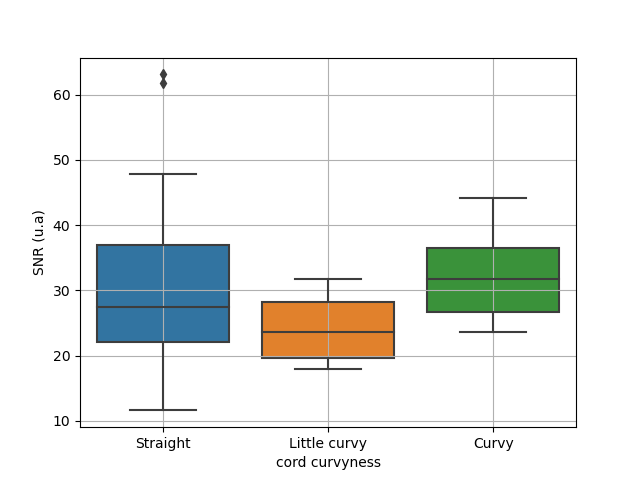

<IPython.core.display.Javascript object>

[Text(0, 0, 'Straight'), Text(1, 0, 'Little curvy'), Text(2, 0, 'Curvy')]

In [45]:
df = df_sc_all_slaser

plt.figure()
g = sns.boxplot(x="dataset_curvy_cord", y="dataset_snr_norm", data=df)
plt.ylabel("SNR (u.a)")
plt.grid('on')
plt.xlabel("cord curvyness")
g.set_xticklabels(["Straight", "Little curvy", "Curvy"])

plt.figure()
g = sns.boxplot(x="dataset_curvy_cord", y="dataset_lw", data=df)
plt.ylabel("LW (Hz)")
plt.grid('on')
plt.xlabel("cord curvyness")
g.set_xticklabels(["Straight", "Little curvy", "Curvy"])


## Curvyness vs. stuff

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


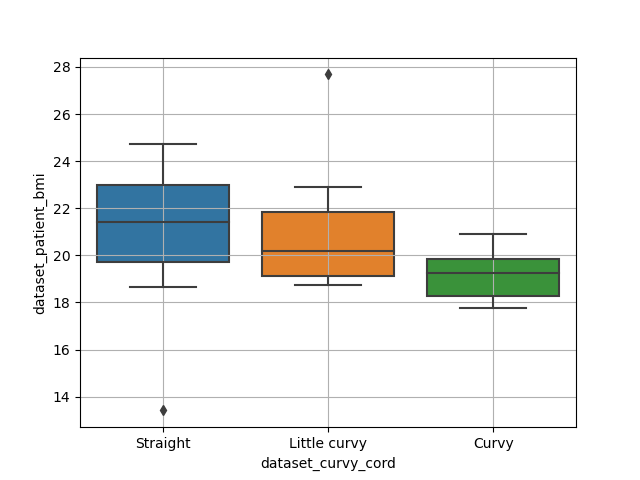

<IPython.core.display.Javascript object>

/home/tangir/miniconda/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:17: UserWarning: FixedFormatter should only be used together with FixedLocator


<IPython.core.display.Javascript object>


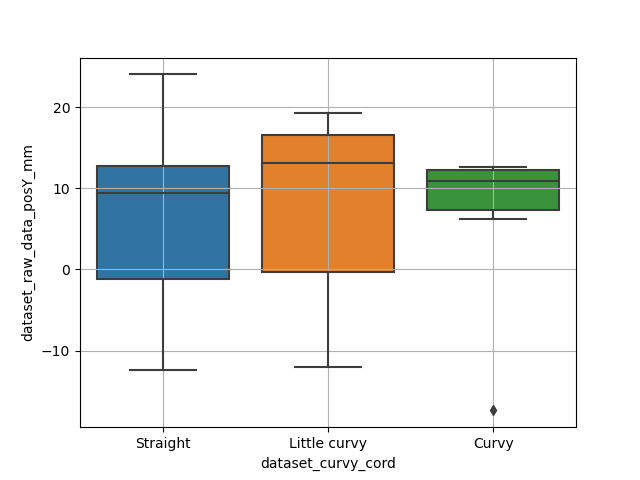

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


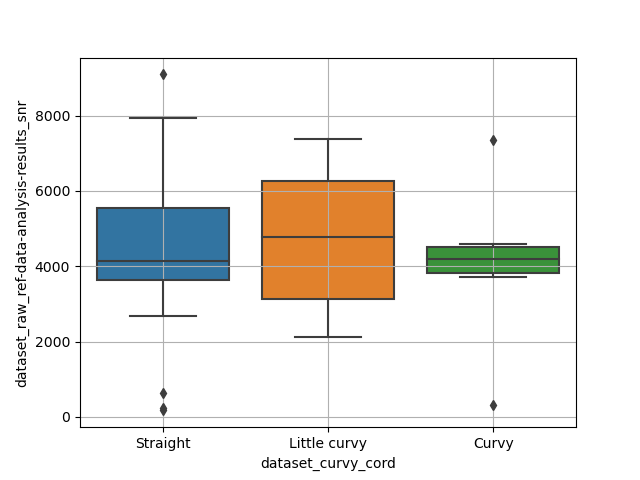

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


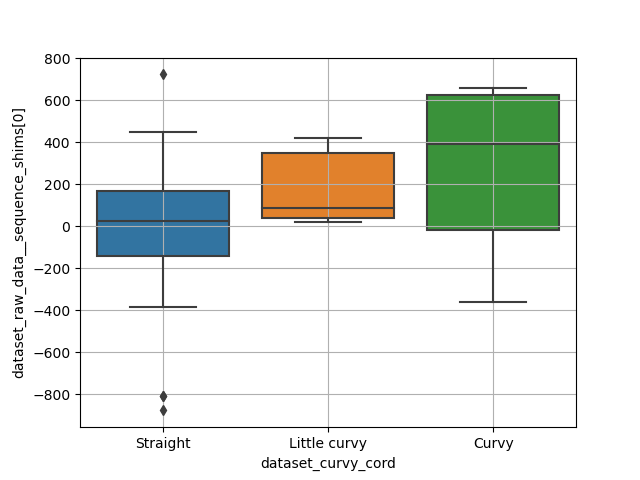

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


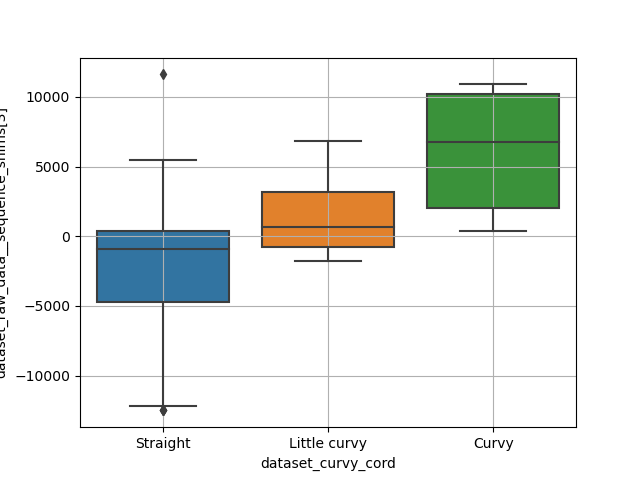

<IPython.core.display.Javascript object>


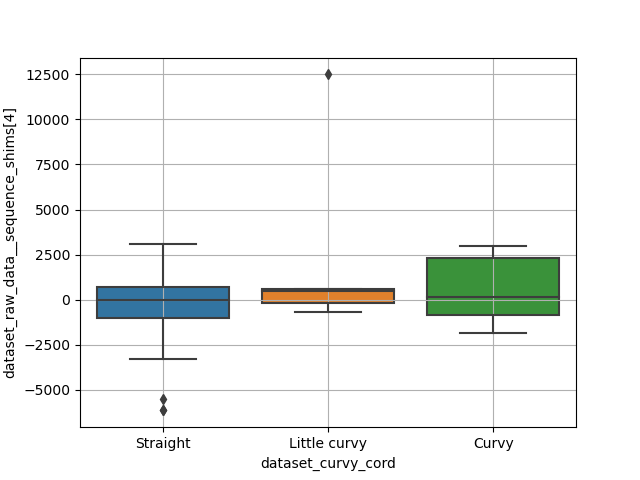

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


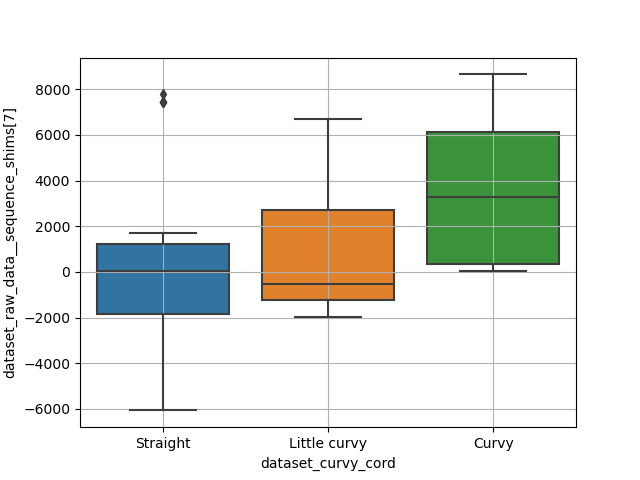

<IPython.core.display.Javascript object>


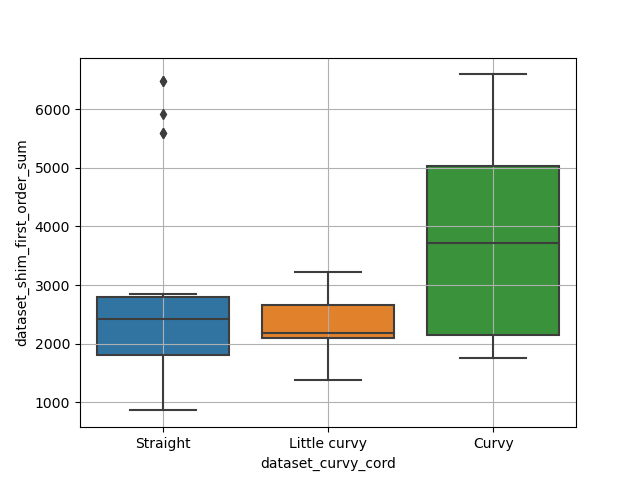

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


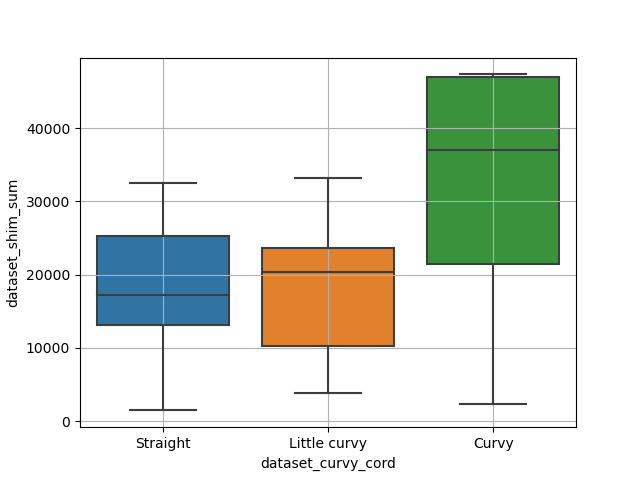

[Text(0, 0, 'Straight'), Text(1, 0, 'Little curvy'), Text(2, 0, 'Curvy')]

In [46]:
df = df_sc_all_slaser

plt.figure()
g = sns.boxplot(x="dataset_curvy_cord", y="dataset_voxel_angle_max_deg", data=df)
plt.grid('on')
plt.xlabel("cord curvyness")
g.set_xticklabels(["Straight", "Little curvy", "Curvy"])

plt.figure()
g = sns.boxplot(x="dataset_curvy_cord", y="dataset_patient_bmi", data=df)
plt.grid('on')
g.set_xticklabels(["Straight", "Little curvy", "Curvy"])

plt.figure()
g = sns.boxplot(x="dataset_curvy_cord", y="dataset_raw_data__patient_sex", data=df)
plt.grid('on')
g.set_xticklabels(["Straight", "Little curvy", "Curvy"])

plt.figure()
g = sns.boxplot(x="dataset_curvy_cord", y="dataset_raw_data_posY_mm", data=df)
plt.grid('on')
g.set_xticklabels(["Straight", "Little curvy", "Curvy"])

plt.figure()
g = sns.boxplot(x="dataset_curvy_cord", y="dataset_raw_data__sequence_vref", data=df)
plt.grid('on')
g.set_xticklabels(["Straight", "Little curvy", "Curvy"])

plt.figure()
g = sns.boxplot(x="dataset_curvy_cord", y="dataset_raw_ref-data-analysis-results_snr", data=df)
plt.grid('on')
g.set_xticklabels(["Straight", "Little curvy", "Curvy"])

plt.figure()
g = sns.boxplot(x="dataset_curvy_cord", y="dataset_raw_ref-data-analysis-results_snr", data=df)
plt.grid('on')
g.set_xticklabels(["Straight", "Little curvy", "Curvy"])

plt.figure()
g = sns.boxplot(x="dataset_curvy_cord", y="dataset_prerej_amplitude_std", data=df)
plt.grid('on')
g.set_xticklabels(["Straight", "Little curvy", "Curvy"])

plt.figure()
g = sns.boxplot(x="dataset_curvy_cord", y="dataset_prerej_linewidth_std", data=df)
plt.grid('on')
g.set_xticklabels(["Straight", "Little curvy", "Curvy"])

plt.figure()
g = sns.boxplot(x="dataset_curvy_cord", y="dataset_prerej_chemical_shift_std", data=df)
plt.grid('on')
g.set_xticklabels(["Straight", "Little curvy", "Curvy"])

plt.figure()
g = sns.boxplot(x="dataset_curvy_cord", y="dataset_prerej_phase_std", data=df)
plt.grid('on')
g.set_xticklabels(["Straight", "Little curvy", "Curvy"])

# maybe related to shimming?
first_order_shim_ranges = [-4000, 4000]
second_order_shim_ranges = [-13000, 13000]
shim_labels = ['X', 'Y', 'Z', 'Z2', 'ZX', 'ZY', 'Z2-Y2', 'XY']
shim_ranges = [first_order_shim_ranges, first_order_shim_ranges, first_order_shim_ranges, 
               second_order_shim_ranges, 
               second_order_shim_ranges, 
               second_order_shim_ranges, 
               second_order_shim_ranges, 
               second_order_shim_ranges]

df["dataset_shim_sum"] = 0

df["dataset_shim_first_order_sum"] = 0

df["dataset_shim_second_order_sum"] = 0

for this_shim_index, this_shim_name, this_shim_range in zip(range(8), shim_labels, shim_ranges):
    df_key = "dataset_raw_data__sequence_shims[" + str(this_shim_index) + "]"
    plt.figure()
    g = sns.boxplot(x="dataset_curvy_cord", y=df_key, data=df)
    plt.grid('on')
    g.set_xticklabels(["Straight", "Little curvy", "Curvy"])
    
    # add up all shims
    if(this_shim_index < 3):
        df["dataset_shim_first_order_sum"] += df[df_key].abs()
    else:
        df["dataset_shim_second_order_sum"] += df[df_key].abs()
          
    df["dataset_shim_sum"] += df[df_key].abs()

# high shim voltage in general?
plt.figure()
g = sns.boxplot(x="dataset_curvy_cord", y="dataset_shim_first_order_sum", data=df)
plt.grid('on')
g.set_xticklabels(["Straight", "Little curvy", "Curvy"])   
        
plt.figure()
g = sns.boxplot(x="dataset_curvy_cord", y="dataset_shim_second_order_sum", data=df)
plt.grid('on')
g.set_xticklabels(["Straight", "Little curvy", "Curvy"]) 
          
plt.figure()
g = sns.boxplot(x="dataset_curvy_cord", y="dataset_shim_sum", data=df)
plt.grid('on')
g.set_xticklabels(["Straight", "Little curvy", "Curvy"]) 

# Best, ok and worst spectra
According to SNR and LW and me

In [47]:
df = df_sc

k = 0
for this_index, this_row in df.iterrows():
    s = this_row["dataset_raw_data_obj"]
    if(s is None):
        s = this_row["dataset_dcm_data_obj"]
    
    s.set_display_offset(10000.0 * k)
    s.display_spectrum_1d(1000)
    k += 1

plt.legend('off')

<IPython.core.display.Javascript object>

# Minor questions and tests

## Does water LW from ref. data == WS data LW?

In [48]:
df = df_sc_all_slaser

x = df["dataset_lw"]
y = df["dataset_raw_ref-data-analysis-results_lw"]
g = sns.JointGrid(x=x, y=y, xlim=(0, 40), ylim=(0, 40))
g.plot_joint(sns.scatterplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

<IPython.core.display.Javascript object>

R = 0.29


Yes, the LW measured on water is similar to the LW measured on NAA. This observation validates the approach of constraining the metabolite damping factors during the fit to the LW observed on water.

## Intensity of ref. water peak
Is it connected to MRS quality? Maybe reflects CSF contamination?

<IPython.core.display.Javascript object>


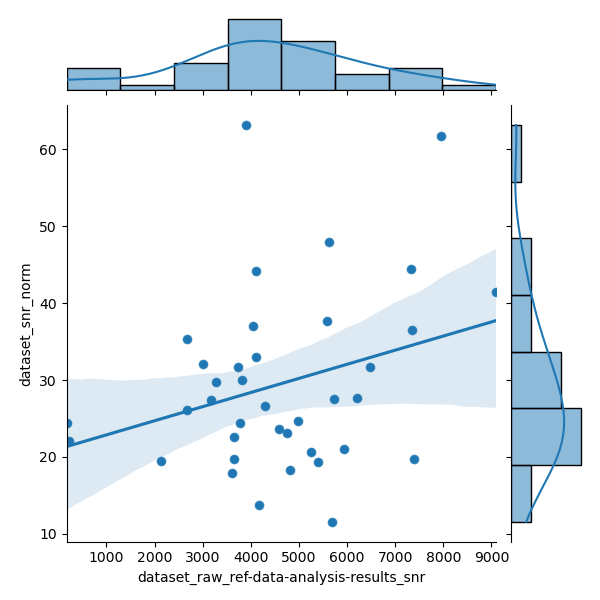

R = 0.30


<IPython.core.display.Javascript object>

R = 0.08


In [49]:
df = df_sc_all_slaser

x = df["dataset_raw_ref-data-analysis-results_snr"]
y = df["dataset_snr_norm"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["dataset_raw_ref-data-analysis-results_snr"]
y = df["dataset_lw"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))


Nope, wrong intuition. The water intensity in the ref. data is not negative correlated to the SNR or LW. More the opposite actually...

## Artefact around 5 ppm
This artefact seems to increase when voxel size decreases in the $x$ dimension. The sLASER sequence is a *semi-*LASER sequence, meaning that not all spatial dimensions are selected using adiabatic RF pulses (like in LASER). The $x$ dimension is selected using a standard asymmetric RF sinc pulse while $y$ and $z$ are selected using HSn RF pulses.

But not only...

### [FIG] for paper SI
with nice artefact spectrum

In [50]:
df = df_sc
 
# normalization of artefact SNR
# VOI normalization
mean_voxel_vol = this_df["dataset_voxel_vol_cm3"].mean()
df["dataset_artefact_signal_norm"] = df["dataset_artefact_signal"] / df["dataset_voxel_vol_cm3"] * mean_voxel_vol
# NA normalization
na_norm = 128.0
df["dataset_artefact_signal_norm"] = df["dataset_artefact_signal_norm"] / np.sqrt(df["dataset_raw_data__data_rejection[0]_Post-rejection_na"]) * np.sqrt(na_norm)


# find big artefact datasets
biggest_artefact_df = df.loc[df["dataset_artefact_signal"] == df["dataset_artefact_signal"].max()]
s = biggest_artefact_df["dataset_raw_data_obj"].iloc[0]
s._display_offset = 0
s.display_spectrum_1d(882)

ll = list(biggest_artefact_df["patient_study_id_pretty"])

plt.ylabel("Real part intensity (u.a)")
plt.xlabel("Chemical shift (ppm)")
plt.xticks(np.arange(0, 6, 0.5))
plt.xlim([6, 1])
plt.legend().remove()
plt.text(5.15, 13000, "*", fontsize=12)

plt.savefig("./notebooks/figs/fig_artefact.svg")
ll

<IPython.core.display.Javascript object>

['S07 (P1)']

<IPython.core.display.Javascript object>


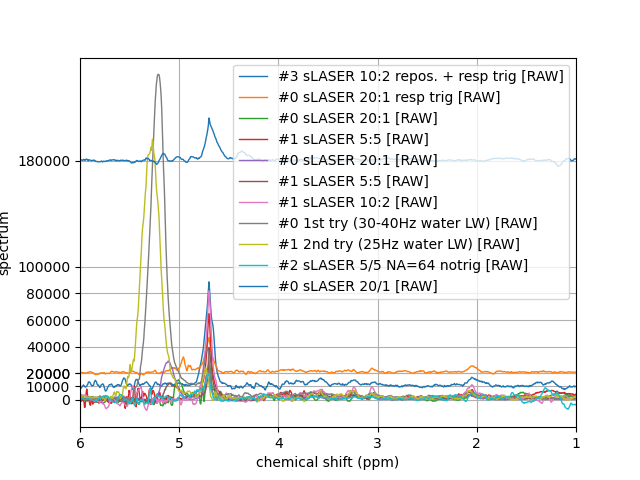

In [51]:
# look at all sLASER
df = df_sc_all_slaser

# normalization of artefact SNR
# VOI normalization
mean_voxel_vol = this_df["dataset_voxel_vol_cm3"].mean()
df["dataset_artefact_signal_norm"] = df["dataset_artefact_signal"] / df["dataset_voxel_vol_cm3"] * mean_voxel_vol
# NA normalization
na_norm = 128.0
df["dataset_artefact_signal_norm"] = df["dataset_artefact_signal_norm"] / np.sqrt(df["dataset_raw_data__data_rejection[0]_Post-rejection_na"]) * np.sqrt(na_norm)

# find big artefact datasets
artefact_df = df.loc[df["dataset_artefact_signal_norm"] > 15000.0]
for s in artefact_df["dataset_raw_data_obj"]:
    s.display_spectrum_1d(1200)

### Origins of this crappy artefact?

<IPython.core.display.Javascript object>


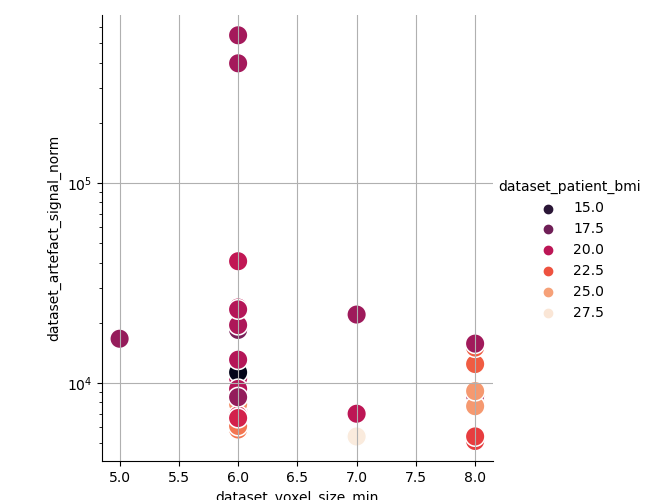

<IPython.core.display.Javascript object>


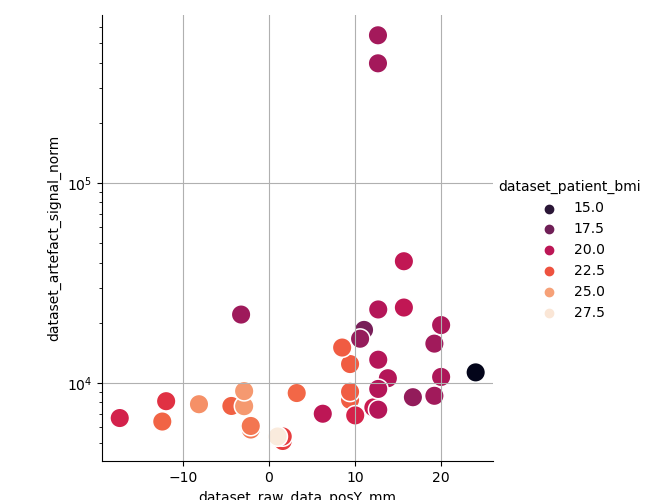

<IPython.core.display.Javascript object>


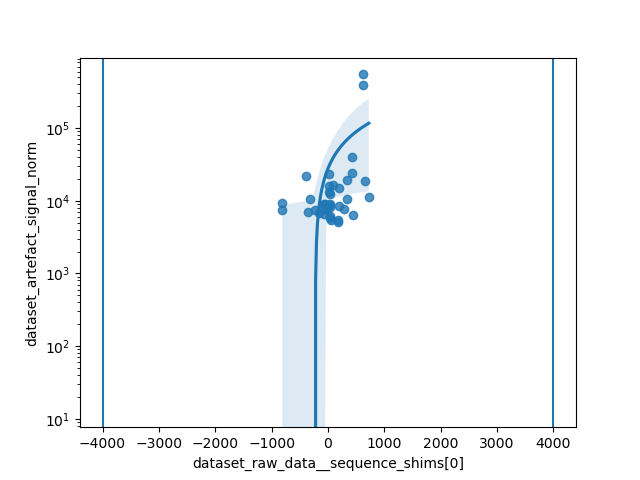

R = 0.40 for shim [X]


<IPython.core.display.Javascript object>


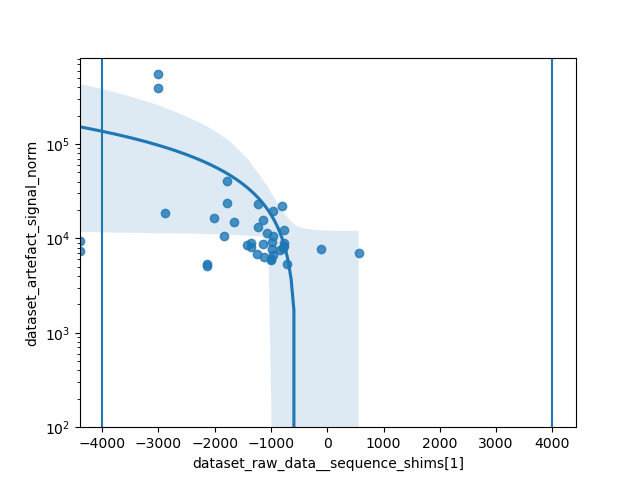

R = -0.37 for shim [Y]


<IPython.core.display.Javascript object>


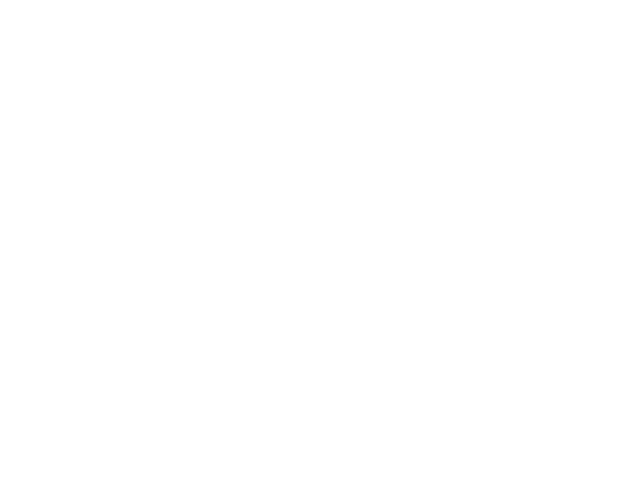

R = 0.18 for shim [Z]


<IPython.core.display.Javascript object>


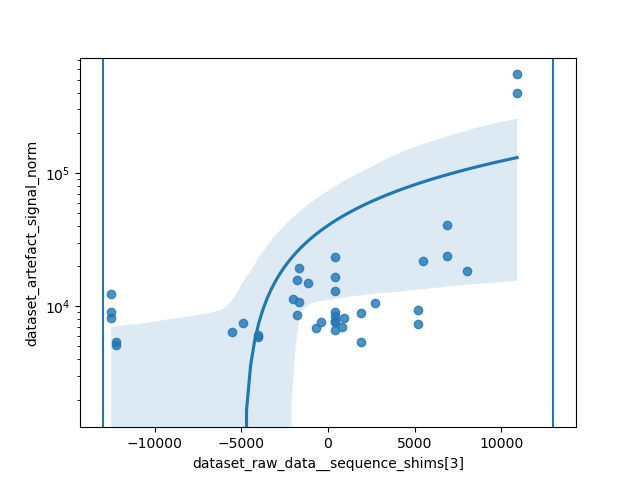

R = 0.47 for shim [Z2]


<IPython.core.display.Javascript object>


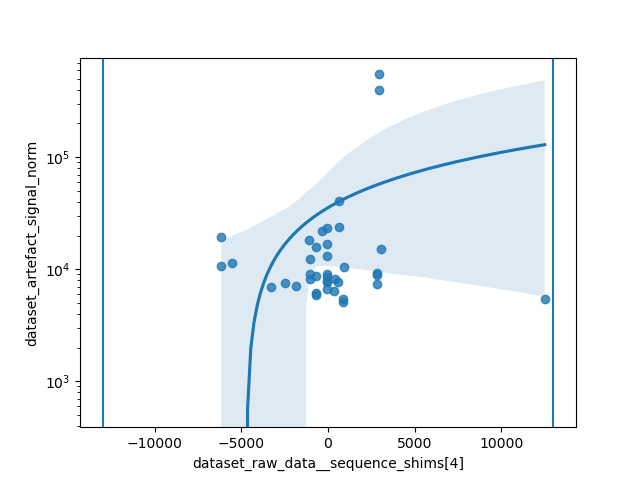

R = 0.22 for shim [ZX]


<IPython.core.display.Javascript object>


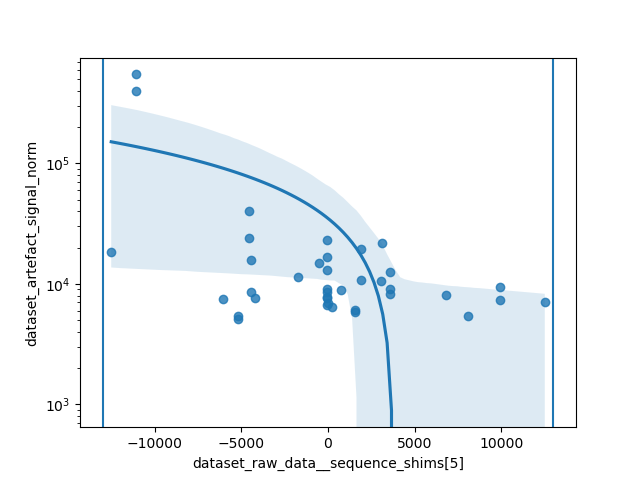

R = -0.48 for shim [ZY]


<IPython.core.display.Javascript object>

R = 0.52 for shim [Z2-Y2]


<IPython.core.display.Javascript object>

R = 0.33 for shim [XY]


<IPython.core.display.Javascript object>


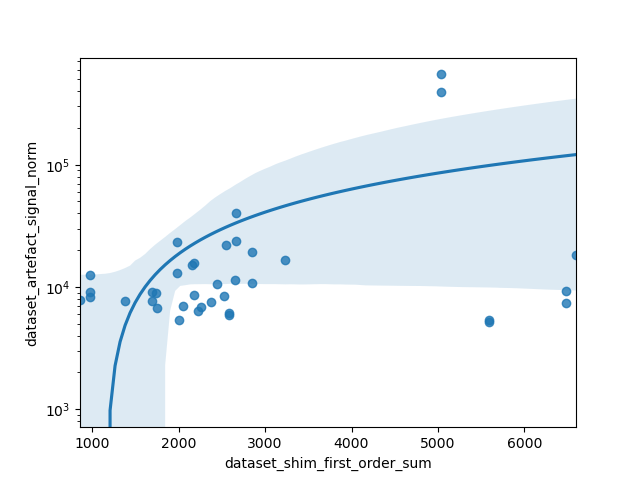

R = 0.33


<IPython.core.display.Javascript object>

R = 0.52


<IPython.core.display.Javascript object>


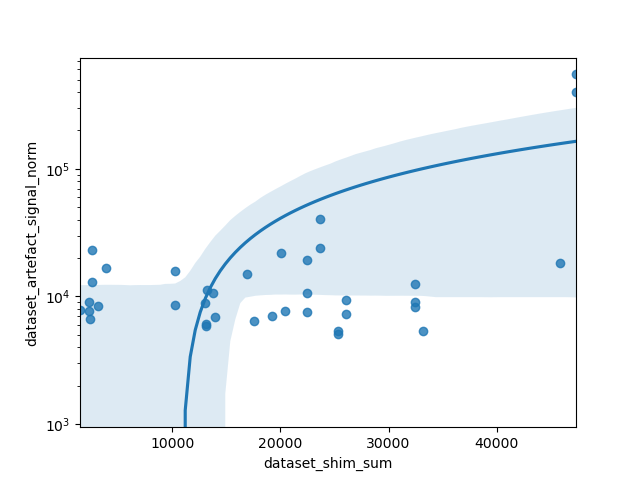

R = 0.53


,patient_study_id,dataset_artefact_signal
scan_hash,,
1baf6b702f39fefb5ad9e44179057ef7,307_1,12674.001356
a2b582b37a04bd4efc43138368bc0b96,308_1,12466.505434
01a46c3d8ebdb2912567745a61ef0d24,310_1,21843.056019
2195967ae34d5ef7dcfba4fc93a9e121,314_1,14092.724989
fe34c6902afd341a0c81de0a0b6d6373,316_1,29196.639993
5f9a42662bfe3586bee57f3ead964778,316_1,14912.680007
2a9fe3c48c69e575db0a8eeeb202d44d,329_1,14961.806405
42063831757801c81193689ead085d37,304_2,245816.065807
8b934ce052f541a6923805395f44bfb8,304_2,197078.166632


In [52]:
x = df["dataset_voxel_size_min"]
y = df["dataset_artefact_signal_norm"]
z = df["dataset_patient_bmi"]
g = sns.relplot(x=x, y=y, hue=z, palette=cm, s=200)
g.ax.xaxis.grid(True)
g.ax.yaxis.grid(True)
g.ax.set_yscale('log')

x = df["dataset_raw_data_posY_mm"]
y = df["dataset_artefact_signal_norm"]
z = df["dataset_patient_bmi"]
g = sns.relplot(x=x, y=y, hue=z, palette=cm, s=200)
g.ax.xaxis.grid(True)
g.ax.yaxis.grid(True)
g.ax.set_yscale('log')

# maybe related to shimming?
first_order_shim_ranges = [-4000, 4000]
second_order_shim_ranges = [-13000, 13000]
shim_labels = ['X', 'Y', 'Z', 'Z2', 'ZX', 'ZY', 'Z2-Y2', 'XY']
shim_ranges = [first_order_shim_ranges, first_order_shim_ranges, first_order_shim_ranges, 
               second_order_shim_ranges, 
               second_order_shim_ranges, 
               second_order_shim_ranges, 
               second_order_shim_ranges, 
               second_order_shim_ranges]

df["dataset_shim_sum"] = 0
artefact_df["dataset_shim_sum"] = 0

df["dataset_shim_first_order_sum"] = 0
artefact_df["dataset_shim_first_order_sum"] = 0

df["dataset_shim_second_order_sum"] = 0
artefact_df["dataset_shim_second_order_sum"] = 0

for this_shim_index, this_shim_name, this_shim_range in zip(range(8), shim_labels, shim_ranges):
    df_key = "dataset_raw_data__sequence_shims[" + str(this_shim_index) + "]"
    x = df[df_key]
    y = df["dataset_artefact_signal_norm"]
    plt.figure()
    g = sns.regplot(x=x, y=y)
    plt.axvline(this_shim_range[0])
    plt.axvline(this_shim_range[1])
    g.set_yscale('log')
    print("R = %.2f for shim [%s]" % (x.corr(y), this_shim_name))
    
    # add up all shims
    if(this_shim_index < 3):
        df["dataset_shim_first_order_sum"] += df[df_key].abs()
        artefact_df["dataset_shim_first_order_sum"] += df[df_key].abs()
    else:
        df["dataset_shim_second_order_sum"] += df[df_key].abs()
        artefact_df["dataset_shim_second_order_sum"] += df[df_key].abs()
          
    df["dataset_shim_sum"] += df[df_key].abs()
    artefact_df["dataset_shim_sum"] += artefact_df[df_key].abs()

# high shim voltage in general?
x = df["dataset_shim_first_order_sum"]
y = df["dataset_artefact_signal_norm"]
plt.figure()
g = sns.regplot(x=x, y=y)
g.set_yscale('log')
print("R = %.2f" % x.corr(y))         
          
x = df["dataset_shim_second_order_sum"]
y = df["dataset_artefact_signal_norm"]
plt.figure()
g = sns.regplot(x=x, y=y)
g.set_yscale('log')
print("R = %.2f" % x.corr(y))
          
x = df["dataset_shim_sum"]
y = df["dataset_artefact_signal_norm"]
plt.figure()
g = sns.regplot(x=x, y=y)
g.set_yscale('log')
print("R = %.2f" % x.corr(y)) 

artefact_df[["patient_study_id", "dataset_artefact_signal"]]

I believe this artefact originates from badly localized signal in the $x$ dimension because of the poor efficiency of the half sinc selection pulse in inhomogenous $B_1$ situation (surface coil):
* This effect is increased when this bad pulse needs to select a small slice.
* Less clear but likely to happen, this effect is also increased when the VOI is far from the coil ($y$ position is high) and the $B_1$ inhomogeneity gets even more crazy.
* This problem could be connected to $B_0$ field homogeneity too! The worst cases were observed for maximum shim voltages... especially for 2nd order shim. Basically meaning that the shim adjustment failed and the operator (me) did not check, resulting in potential huge and shim-generated $B_0$ field inhomogeneity...

Related to $B_0$ and $B_1$ fields heterogeneity in general!

## Moving average window size
This reconstruction parameter had to be set manually a few times to avoid data corruption during frequency realignment and data rejection: 2, 4, 5... What does it depend on?

<IPython.core.display.Javascript object>

R = -0.05


<IPython.core.display.Javascript object>


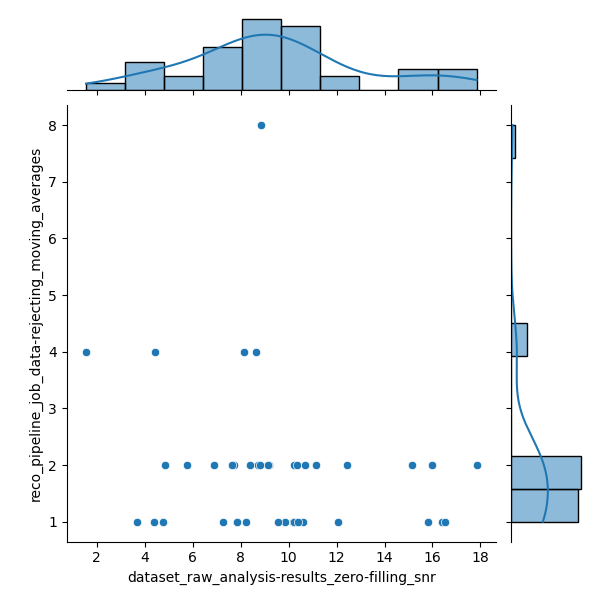

R = -0.20


<IPython.core.display.Javascript object>

R = -0.07


<IPython.core.display.Javascript object>

R = -0.05


<IPython.core.display.Javascript object>


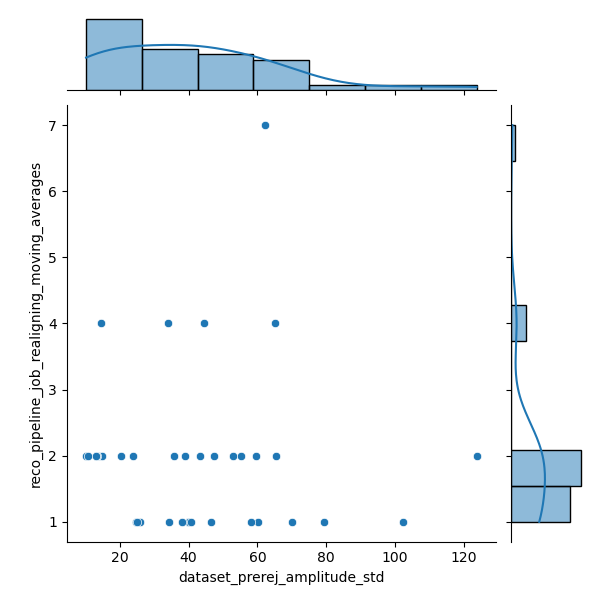

R = -0.01


<IPython.core.display.Javascript object>

R = 0.11


<IPython.core.display.Javascript object>

R = -0.00


<IPython.core.display.Javascript object>


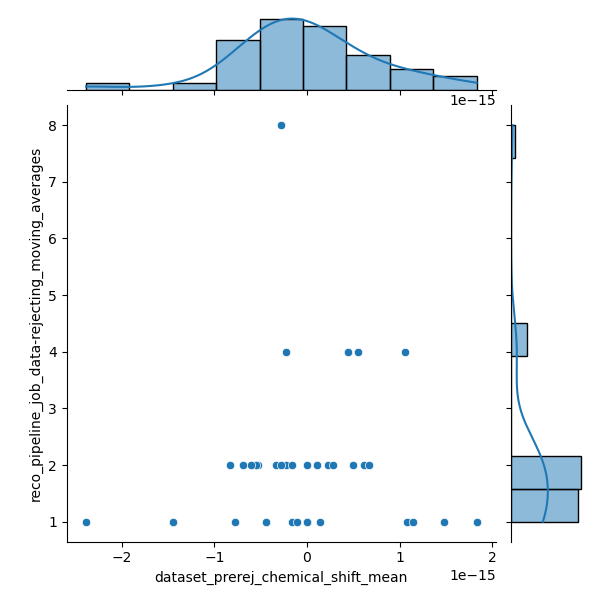

R = 0.05


<IPython.core.display.Javascript object>

R = 0.32


<IPython.core.display.Javascript object>

R = 0.26


<IPython.core.display.Javascript object>


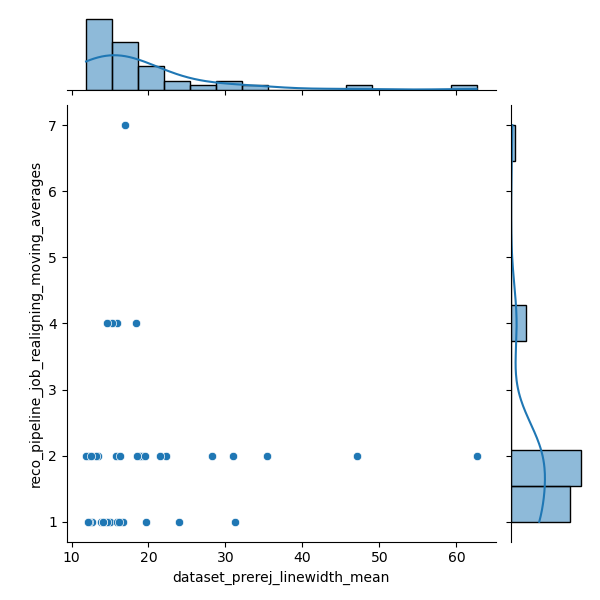

R = 0.00


<IPython.core.display.Javascript object>


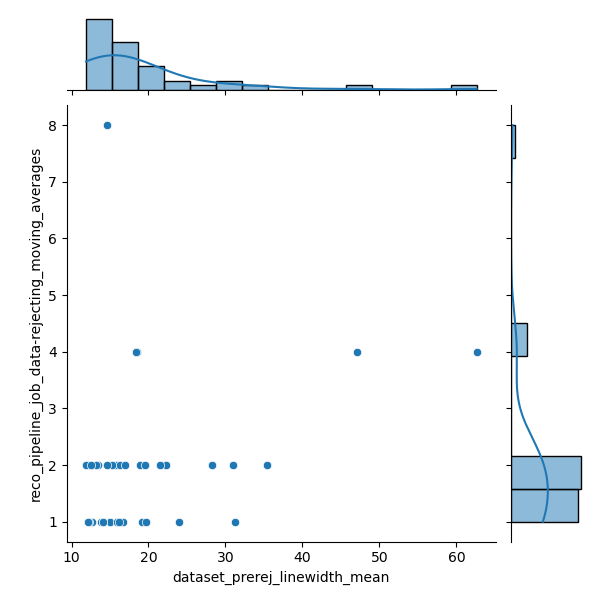

R = 0.29


<IPython.core.display.Javascript object>

R = -0.02


<IPython.core.display.Javascript object>

R = -0.00


<IPython.core.display.Javascript object>

R = -0.04


<IPython.core.display.Javascript object>


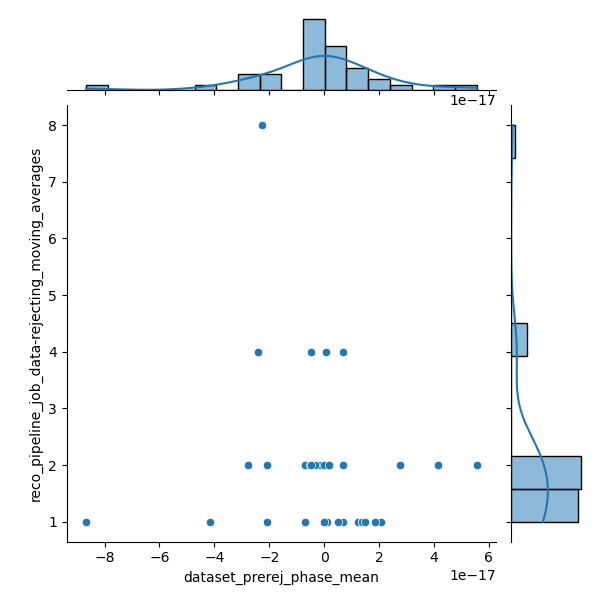

R = -0.11


<IPython.core.display.Javascript object>


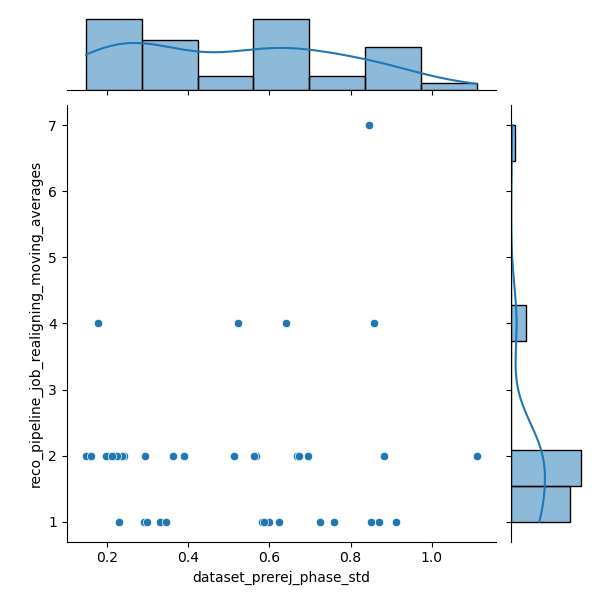

R = 0.09


<IPython.core.display.Javascript object>


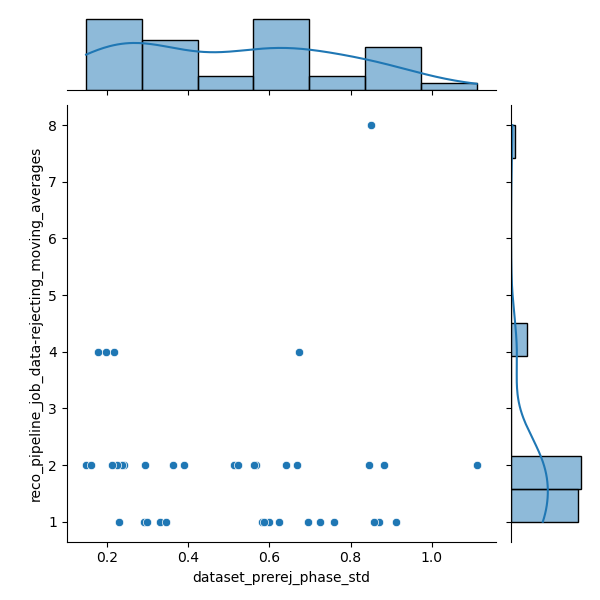

R = -0.04


In [53]:
df = df_sc_all_slaser

# extract SNR before realignment

try_this_list = ["dataset_raw_analysis-results_zero-filling_snr",
                 "dataset_prerej_amplitude_mean",
                 "dataset_prerej_amplitude_std",
                "dataset_prerej_chemical_shift_mean",
                "dataset_prerej_chemical_shift_std",
                 "dataset_prerej_linewidth_mean",
                 "dataset_prerej_linewidth_std",
                "dataset_prerej_phase_mean",
                "dataset_prerej_phase_std",]

for ttl in try_this_list:
    x = df[ttl]
    y = df["reco_pipeline_job_realigning_moving_averages"]
    g = sns.JointGrid(x=x, y=y)
    g.plot_joint(sns.scatterplot)
    g.plot_marginals(sns.histplot, kde=True)
    print("R = %.2f" % x.corr(y))

    x = df[ttl]
    y = df["reco_pipeline_job_data-rejecting_moving_averages"]
    g = sns.JointGrid(x=x, y=y)
    g.plot_joint(sns.scatterplot)
    g.plot_marginals(sns.histplot, kde=True)
    print("R = %.2f" % x.corr(y))

* Seems that some datasets with low SNR needed moving averaging for the frequency realignment and the data rejection to work. Could we maybe find a SNR threshold or a simple relation between SNR and moving average window size so that it is set automatically? **Well NO, wrong hypothesis** :P
* What else? variation of peak properties ? They are actually estimated using the moving average window... 

Could not conclude anything... I still do not know how to adjust the averaging moving window size automatically :(

## SNR & NA
Curious to see if the usual SNR and $/sqrt(NA)$ dependence is observable

In [54]:
df = df_sc_all_slaser

x = df["dataset_raw_data__sequence_na"].astype(np.float)
y = df["dataset_snr_norm"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)


<IPython.core.display.Javascript object>

## sLASER protocols
Compare protocols 20/1, 10/2, 5/5 when possible in terms of SNR/LW

In [55]:
df = df_sc_all_slaser

# get the scans hash manually
df_slaser_tests = df.loc[(df["patient_study_id"] == "314_1")
                        | (df["patient_study_id"] == "316_1")
                        | (df["patient_study_id"] == "319_1")
                        | (df["patient_study_id"] == "329_1")
                        | (df["patient_study_id"] == "336_2")]

df_slaser_tests = df_slaser_tests.drop("967a1b8dace220e916df680759f31d84")

df_slaser_tests

,patient,study,dataset_legend,dataset_raw_files[0],dataset_raw_files[1],dataset_raw_data_obj,dataset_raw_data__dt,dataset_raw_data__f0,dataset_raw_data__te,dataset_raw_data__tr,...,dataset_artefact_signal,dataset_water_signal,dataset_raw_data_posY_mm_abs,dataset_snr_norm_voxpos,dataset_voxel_angle_max_deg,dataset_curvy_cord,dataset_shim_sum,dataset_shim_first_order_sum,dataset_shim_second_order_sum,dataset_artefact_signal_norm
scan_hash,,,,,,,,,,,,,,,,,,,,,
0a58f85af8c32d06cbbca74391447ad2,314,1,#0 sLASER 20:1,/home/tangir/crmbm/acq_twix/314-yt-p1-moelle/m...,/home/tangir/crmbm/acq_twix/314-yt-p1-moelle/m...,"[(730.3440293819107-125.91066233625389j), (712...",0.0001,297.205966,41.68,4130.0,...,10881.861401,81685.213701,44.803529,24.781621,4.702408,2.0,10281.0,2175.0,8106.0,8621.281274
2195967ae34d5ef7dcfba4fc93a9e121,314,1,#1 sLASER 5:5,/home/tangir/crmbm/acq_twix/314-yt-p1-moelle/m...,/home/tangir/crmbm/acq_twix/314-yt-p1-moelle/m...,"[(1008.4807903081726-17.76038805871182j), (881...",0.0001,297.205946,19.96,3690.0,...,14092.724989,64816.699975,44.803529,23.295548,4.699944,2.0,10281.0,2175.0,8106.0,15725.025883
fe34c6902afd341a0c81de0a0b6d6373,316,1,#0 sLASER 20:1,/home/tangir/crmbm/acq_twix/316-ap-p1-moelle/m...,/home/tangir/crmbm/acq_twix/316-ap-p1-moelle/m...,"[(526.3710825321402-109.50225527879674j), (518...",0.0001,297.205277,45.96,4010.0,...,29196.639993,29295.532706,48.350496,16.312588,4.376763,2.0,23647.0,2666.0,20981.0,40621.941603
5f9a42662bfe3586bee57f3ead964778,316,1,#1 sLASER 5:5,/home/tangir/crmbm/acq_twix/316-ap-p1-moelle/m...,/home/tangir/crmbm/acq_twix/316-ap-p1-moelle/m...,"[(535.8489858681635+21.802746814175052j), (534...",0.0001,297.205276,21.16,3490.0,...,14912.680007,40761.401680,48.350496,21.936950,4.379971,2.0,23647.0,2666.0,20981.0,23830.349806
3c700829d5feb605285c5ef7cfad4055,319,1,#0 sLASER 20:1,/home/tangir/crmbm/acq_twix/319-fc-p1-moelle/m...,/home/tangir/crmbm/acq_twix/319-fc-p1-moelle/m...,"[(1208.0387209839266-395.25782076094237j), (12...",0.0001,297.205777,62.96,6350.0,...,10077.243117,58370.941268,66.932235,16.958161,6.290586,1.0,2312.0,1689.0,623.0,7648.661330
f416f6db6cda52195e3b8046fc586ef2,319,1,#1 sLASER 10:2,/home/tangir/crmbm/acq_twix/319-fc-p1-moelle/m...,/home/tangir/crmbm/acq_twix/319-fc-p1-moelle/m...,"[(1760.5827174966569-749.9357520232237j), (188...",0.0001,297.205787,38.96,6190.0,...,14410.552598,98877.792137,66.932235,27.943621,6.289956,1.0,2312.0,1689.0,623.0,9100.681360
fc8cb0e8f7b3747a10eeabc1cf8ab9fb,329,1,#0 sLASER 20:1,/home/tangir/crmbm/acq_twix/329-pi-p1-moelle/m...,/home/tangir/crmbm/acq_twix/329-pi-p1-moelle/m...,"[(720.6111834553235+65.9576964885443j), (683.9...",0.0001,297.206029,45.96,4190.0,...,10929.409805,64697.452980,44.017452,28.513759,0.128695,1.0,22462.0,2848.0,19614.0,10714.754328
2a9fe3c48c69e575db0a8eeeb202d44d,329,1,#1 sLASER 10:2,/home/tangir/crmbm/acq_twix/329-pi-p1-moelle/m...,/home/tangir/crmbm/acq_twix/329-pi-p1-moelle/m...,"[(813.7178356519605+124.02770726354633j), (771...",0.0001,297.206047,29.96,4070.0,...,14961.806405,81993.983942,44.017452,36.903447,0.128695,1.0,22462.0,2848.0,19614.0,19469.766947
355445d1bac5ee682c88f889b4c01d09,336,2,#0 sLASER 10/2 NA=64 notrig,/home/tangir/crmbm/acq_twix/336-nb-p2-moelle/m...,/home/tangir/crmbm/acq_twix/336-nb-p2-moelle/m...,"[(382.94042219267186+82.29010962310511j), (340...",0.0001,297.205894,32.28,5300.0,...,6586.186608,32263.037103,51.333126,21.969146,0.019602,1.0,2601.0,1978.0,623.0,13064.936560


In [56]:
df_slaser_results = pd.DataFrame(columns=["patient_study_id",
                 "r20_snr",
                 "r20_lw",
                 "r20_te",
                 "r10_snr",
                 "r10_lw",
                 "r10_te",
                 "r5_snr",
                 "r5_lw",
                 "r5_te"])

df_slaser_results = df_slaser_results.set_index("patient_study_id")

# initialize
for this_index, this_row in df_slaser_tests.iterrows():
    this_patient_study_id = this_row["patient_study_id"]
    df_slaser_results.loc[this_patient_study_id] = [np.nan] * 9

# complete
for this_index, this_row in df_slaser_tests.iterrows():
    this_patient_study_id = this_row["patient_study_id"]
    this_r = this_row["dataset_raw_data__sequence_pulse_rfc_r"]
    if(this_r >= 20):
        df_slaser_results.loc[this_patient_study_id]["r20_snr"] = this_row["dataset_snr_norm"]
        df_slaser_results.loc[this_patient_study_id]["r20_lw"] = this_row["dataset_lw"]
        df_slaser_results.loc[this_patient_study_id]["r20_te"] = this_row["dataset_raw_data__sequence_te"]

    elif(this_r == 10):
        df_slaser_results.loc[this_patient_study_id]["r10_snr"] = this_row["dataset_snr_norm"]
        df_slaser_results.loc[this_patient_study_id]["r10_lw"] = this_row["dataset_lw"]
        df_slaser_results.loc[this_patient_study_id]["r10_te"] = this_row["dataset_raw_data__sequence_te"]

    elif(this_r == 5):
        df_slaser_results.loc[this_patient_study_id]["r5_snr"] = this_row["dataset_snr_norm"]
        df_slaser_results.loc[this_patient_study_id]["r5_lw"] = this_row["dataset_lw"]
        df_slaser_results.loc[this_patient_study_id]["r5_te"] = this_row["dataset_raw_data__sequence_te"]

df_slaser_results

,r20_snr,r20_lw,r20_te,r10_snr,r10_lw,r10_te,r5_snr,r5_lw,r5_te
patient_study_id,,,,,,,,,
314_1,31.682838,16.276042,41.68,NaN,NaN,NaN,29.782922,16.276042,19.96
316_1,19.443650,17.903646,45.96,NaN,NaN,NaN,26.147561,13.020833,21.16
319_1,13.700674,11.393229,62.96,22.575940,13.020833,38.96,NaN,NaN,NaN
329_1,37.014098,19.531250,45.96,47.904866,21.158854,29.96,NaN,NaN,NaN
336_2,33.003784,11.393229,52.36,24.651461,19.531250,32.28,35.340279,19.531250,22.68


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


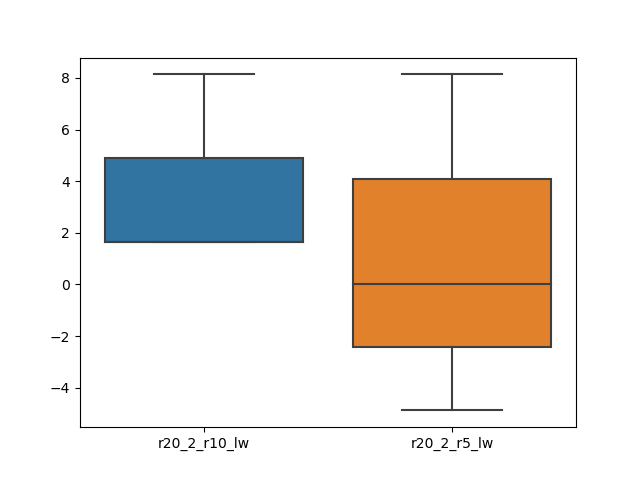

<IPython.core.display.Javascript object>

<AxesSubplot:>

In [57]:
# replace 0 by nan
df_slaser_results = df_slaser_results.replace(0, np.nan)

# estimate relative changes of all this
df_slaser_results["r20_2_r10_snr_prct"] = (df_slaser_results["r10_snr"] - df_slaser_results["r20_snr"]) / df_slaser_results["r20_snr"] * 100
df_slaser_results["r20_2_r10_lw"] = df_slaser_results["r10_lw"] - df_slaser_results["r20_lw"]
df_slaser_results["r20_2_r10_te"] = df_slaser_results["r10_te"] - df_slaser_results["r20_te"]
#
df_slaser_results["r20_2_r5_snr_prct"] = (df_slaser_results["r5_snr"] - df_slaser_results["r20_snr"]) / df_slaser_results["r20_snr"] * 100
df_slaser_results["r20_2_r5_lw"] = df_slaser_results["r5_lw"] - df_slaser_results["r20_lw"]
df_slaser_results["r20_2_r5_te"] = df_slaser_results["r5_te"] - df_slaser_results["r20_te"]

# display
plt.figure()
y=df_slaser_results[["r20_2_r10_snr_prct", "r20_2_r5_snr_prct"]]
sns.boxplot(data=y)

plt.figure()
y=df_slaser_results[["r20_2_r10_lw", "r20_2_r5_lw"]]
sns.boxplot(data=y)

plt.figure()
y=df_slaser_results[["r20_2_r10_te", "r20_2_r5_te"]]
sns.boxplot(data=y)


Interesting... I see that the R=20/1 is maybe not the best protocol to use... 
* The SNR is increased when switching to R=10/2, the LW looks unchanged
* The SNR is not really increased when switching to R=5 (starting to suffer from bad selectivity ?)
* The TE is reduced in both cases quite a lot >20ms

Seems I should have used 10/2 as the standard protocol. In theory less adiabatic but gives a shorter TE and higher SNR (probably connected but not sure when looking at the 5/5 results).

However, I need to find or remember why I used the 20/1 most of the time to justify in the paper. First let's see the proportion of this and that protocol in the P1/P2 data. In theory, the 10/2 scans should remain because the highest SNR scan per study was kept.

In [58]:
df = df_sc

df_20 = df.loc[df["dataset_raw_data__sequence_pulse_rfc_r"] >= 20]
df_10 = df.loc[df["dataset_raw_data__sequence_pulse_rfc_r"] == 10]
df_5 = df.loc[df["dataset_raw_data__sequence_pulse_rfc_r"] == 5]

print("* P1 and P2 scans represent %d datasets" % len(df))
print("* sLASER R>=20 was used %d times (%.2f%%)" % (len(df_20), len(df_20)/len(df) * 100))
print("* sLASER R==10 was used %d times (%.2f%%)" % (len(df_10), len(df_10)/len(df) * 100))
print("* sLASER R==5 was used %d times (%.2f%%)" % (len(df_5), len(df_5)/len(df) * 100))

df

* P1 and P2 scans represent 21 datasets
* sLASER R>=20 was used 15 times (71.43%)
* sLASER R==10 was used 5 times (23.81%)
* sLASER R==5 was used 1 times (4.76%)


,patient,study,dataset_legend,dataset_raw_files[0],dataset_raw_files[1],dataset_raw_data_obj,dataset_raw_data__dt,dataset_raw_data__f0,dataset_raw_data__te,dataset_raw_data__tr,...,dataset_rejection_rate_prct,dataset_acqtime,dataset_acqtime_eff,dataset_artefact_signal,dataset_water_signal,patient_pretty,patient_study_id_pretty,dataset_voxel_angle_max_deg,dataset_curvy_cord,dataset_artefact_signal_norm
2fff316122fc89a0b4d1f918f6cd62d8,300,1,#1 sLASER R:N=25:1 trig,/home/tangir/crmbm/acq_twix/300-pm-p1-moelle/m...,/home/tangir/crmbm/acq_twix/300-pm-p1-moelle/m...,"[(466.7910467092009+42.6625311942012j), (449.5...",0.0001,297.206850,49.96,3550.0,...,16.406250,468.60,NaN,7208.212015,62234.761255,S01,S01 (P1),0.110008,1.0,5398.139247
1baf6b702f39fefb5ad9e44179057ef7,307,1,#3 sLASER 10:2 repos. + resp trig,/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/m...,/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/m...,"[(781.0128721121888-57.03888725364891j), (754....",0.0001,297.205912,29.96,4570.0,...,15.625000,310.76,425.0,12674.001356,78781.944153,S02,S02 (P1),0.198216,1.0,15030.640756
a2b582b37a04bd4efc43138368bc0b96,308,1,#0 sLASER 20:1 resp trig,/home/tangir/crmbm/acq_twix/308-rs-p1-moelle/m...,/home/tangir/crmbm/acq_twix/308-rs-p1-moelle/m...,"[(425.20132747556744+26.922286521821697j), (40...",0.0001,297.204864,41.96,3780.0,...,14.062500,498.96,799.0,12466.505434,27047.133237,S03,S03 (P1),0.069668,3.0,18415.629982
7cb024e470b0b2b072436635a19a1c00,311,1,#0 sLASER 20:1,/home/tangir/crmbm/acq_twix/311-sl-p1-moelle/m...,/home/tangir/crmbm/acq_twix/311-sl-p1-moelle/m...,"[(454.6048151740534-114.46837806711163j), (472...",0.0001,297.205785,90.00,5810.0,...,17.968750,766.92,NaN,10144.079020,81678.461267,S04,S04 (P1),0.169272,2.0,7668.778668
9f8067ea065153da5b3a352d58f6ca23,313,1,#0 sLASER 20:1,/home/tangir/crmbm/acq_twix/313-ft-p1-moelle/m...,/home/tangir/crmbm/acq_twix/313-ft-p1-moelle/m...,"[(1108.8833324440807-501.8758589220622j), (116...",0.0001,297.206221,49.96,4290.0,...,6.250000,566.28,888.0,8175.118929,28657.452328,S05,S05 (P1),0.452177,1.0,7540.596472
0a58f85af8c32d06cbbca74391447ad2,314,1,#0 sLASER 20:1,/home/tangir/crmbm/acq_twix/314-yt-p1-moelle/m...,/home/tangir/crmbm/acq_twix/314-yt-p1-moelle/m...,"[(730.3440293819107-125.91066233625389j), (712...",0.0001,297.205966,41.68,4130.0,...,5.468750,545.16,893.0,10881.861401,81685.213701,S06,S06 (P1),4.702408,2.0,8621.281274
5f9a42662bfe3586bee57f3ead964778,316,1,#1 sLASER 5:5,/home/tangir/crmbm/acq_twix/316-ap-p1-moelle/m...,/home/tangir/crmbm/acq_twix/316-ap-p1-moelle/m...,"[(535.8489858681635+21.802746814175052j), (534...",0.0001,297.205276,21.16,3490.0,...,2.083333,349.00,486.0,14912.680007,40761.401680,S07,S07 (P1),4.379971,2.0,23830.349806
f416f6db6cda52195e3b8046fc586ef2,319,1,#1 sLASER 10:2,/home/tangir/crmbm/acq_twix/319-fc-p1-moelle/m...,/home/tangir/crmbm/acq_twix/319-fc-p1-moelle/m...,"[(1760.5827174966569-749.9357520232237j), (188...",0.0001,297.205787,38.96,6190.0,...,18.750000,619.00,676.0,14410.552598,98877.792137,S08,S08 (P1),6.289956,1.0,9100.681360
b9875913db5c0f321922f819401cc02e,328,1,#0 sLASER 20:1,/home/tangir/crmbm/acq_twix/328-af-p1-moelle/m...,/home/tangir/crmbm/acq_twix/328-af-p1-moelle/m...,"[(343.0588823233081-161.2041404346132j), (367....",0.0001,297.205548,50.28,4840.0,...,10.156250,638.88,843.0,7083.762108,38935.585001,S09,S09 (P1),0.089529,1.0,8899.299622
fc8cb0e8f7b3747a10eeabc1cf8ab9fb,329,1,#0 sLASER 20:1,/home/tangir/crmbm/acq_twix/329-pi-p1-moelle/m...,/home/tangir/crmbm/acq_twix/329-pi-p1-moelle/m...,"[(720.6111834553235+65.9576964885443j), (683.9...",0.0001,297.206029,45.96,4190.0,...,13.281250,553.08,678.0,10929.409805,64697.452980,S10,S10 (P1),0.128695,1.0,10714.754328


Ok, and when did I prefer using this or that protocol. Did it depend on Vref, BMI ? 

<IPython.core.display.Javascript object>


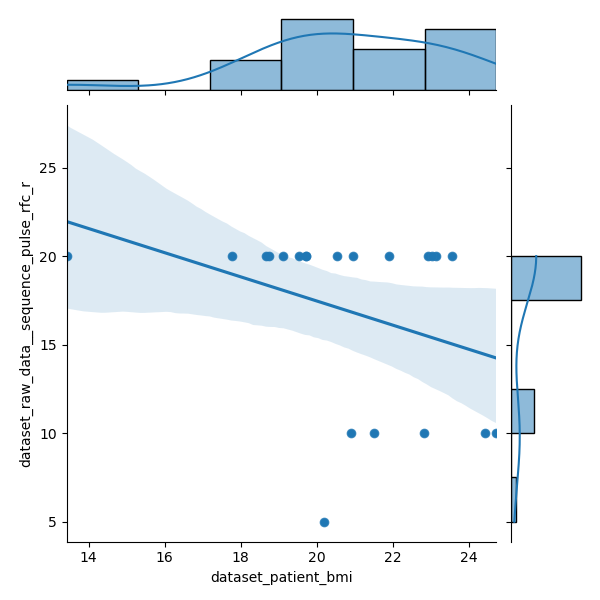

R = -0.35


<IPython.core.display.Javascript object>

R = -0.43


In [59]:
x = df["dataset_patient_bmi"]
y = df["dataset_raw_data__sequence_pulse_rfc_r"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["dataset_raw_data__sequence_vref"]
y = df["dataset_raw_data__sequence_pulse_rfc_r"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.scatterplot)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))


Ok makes sense. Since I was preferably scanning at R=20, I reduced R when BMI/Vref was too high (~300V). So it's not really like I had a choice.

But still I should performed R=10 systematically, it gives lower TE and stronger SNR. This was probably not the case in vitro because of long T2s...

It would be nice to estimate spectral quality with more than just SNR and LW. I suspect artefacts, lipids and shit showing up when reducing R because of bad selectivity and voxel contamination.

# Shimming: what is the best? 1st vs. 2nd order?
- Did 2nd order shim help? Extracting data from notebooks.

In [60]:
df = df_sc

# found this in my labbooks:
patient_list = [313,     319,     328, 329, 333, 336,  338,  300,    311,  336,  319,  313,  314,  349  ]
study_list = [    1,       1,       1,   1,   1,   1,    1,    2,      2,    1,    2,    2,    2,    2  ]
lw_linear = [    45,      25,      25,  30,  45,  30,   25,   35, np.nan,  np.nan,   39,   30,   20,   26  ]
lw_full = [      55,  np.nan,      40,  25,  50,  60,   35, 37.5,     25,   27,  np.nan,   50,   25,   30  ]

# keep only patient and study present in df
patient_list2 = []
study_list2 = []
lw_linear2 = []
lw_full2 = []
for p, s, lw1, lw2 in zip(patient_list, study_list, lw_linear, lw_full):
    if(p in df["patient"].to_list() and s in df.loc[df["patient"] == p]["study"].to_list()):
        patient_list2.append(p)
        study_list2.append(s)
        lw_linear2.append(lw1)
        lw_full2.append(lw2)

lw_linear2 = np.array(lw_linear2)
lw_full2 = np.array(lw_full2)
lw_diff2 = lw_full2 - lw_linear2
lw_diff2 = lw_diff2[~np.isnan(lw_diff2)]
print("In average, there was a %.2f +/- %.2f Hz change for the water LW when going from 1st to 2nd order shimming!" % (lw_diff2.mean(),lw_diff2.std()))


In average, there was a 9.65 +/- 9.44 Hz change for the water LW when going from 1st to 2nd order shimming!


# Scan-time, number of averages and data rejection

## Theoretical, effective (gated) and post-cor. acquisition duration
Compare theory, effective acquisition durations and "useful" acquisition durations (post-correction)

In [61]:
df = df_sc

# calculating usefull acqusition time post-correction
df["dataset_acqtime_eff_usefull"] = df["dataset_acqtime_eff"] - (df["dataset_acqtime_eff"] * df["dataset_rejection_rate_prct"] / 100.0)

# make a nice stackplot for each scan with: effective, and usefull
plt.figure()
sns.set_color_codes("pastel")
sns.barplot(x=df["dataset_acqtime_eff"], y=df["patient_study_id"],
            label="dataset_acqtime_eff", color="b")
sns.set_color_codes("muted")
sns.barplot(x=df["dataset_acqtime_eff_usefull"], y=df["patient_study_id"],
            label="dataset_acqtime_eff_usefull", color="b")


<IPython.core.display.Javascript object>

<AxesSubplot:xlabel='dataset_acqtime_eff_usefull', ylabel='patient_study_id'>

<IPython.core.display.Javascript object>


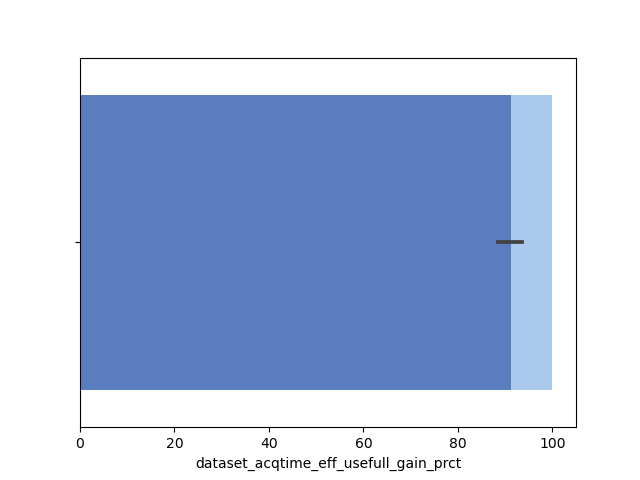

<AxesSubplot:xlabel='dataset_acqtime_eff_usefull_gain_prct'>

In [62]:
# to summarize into one bargraph:
# relative gain estimations between
# theory and effective durations
# effective durations and post-corrected durations

df["dataset_acqtime_eff_gain_prct"] = (df["dataset_acqtime_eff"] - df["dataset_acqtime"]) / df["dataset_acqtime"] * 100.0
df["dataset_acqtime_eff_usefull_gain_prct"] = (df["dataset_acqtime_eff_usefull"] - df["dataset_acqtime_eff"]) / df["dataset_acqtime_eff"] * 100.0
df["dataset_acqtime_eff_usefull_gain_prct_full"] = 100.0

plt.figure()
y = df["dataset_acqtime_eff_usefull_gain_prct_full"]
sns.set_color_codes("pastel")
sns.barplot(x=y, label="100%", color="b")

y = 100 + df["dataset_acqtime_eff_usefull_gain_prct"]
sns.set_color_codes("muted")
sns.barplot(x=y, label="dataset_acqtime_eff_usefull_gain_prct", color="b")


## Ideal acquisition time?
Any idea of how long shoud we scan?
Does it depend on SNR (I hope!) or BMI?

<IPython.core.display.Javascript object>

R = 0.89


<IPython.core.display.Javascript object>


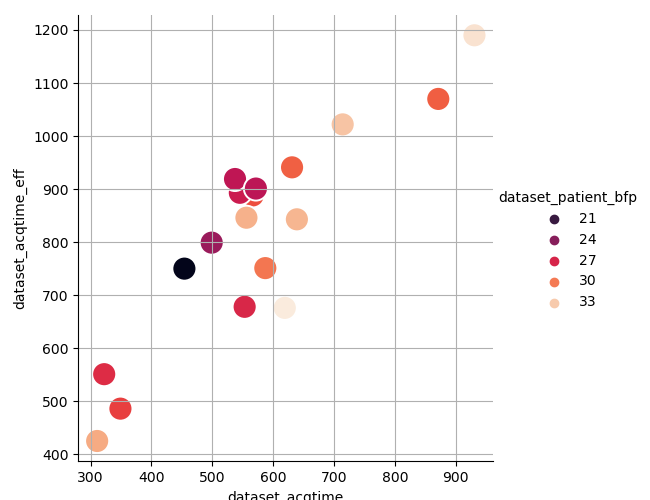

<IPython.core.display.Javascript object>


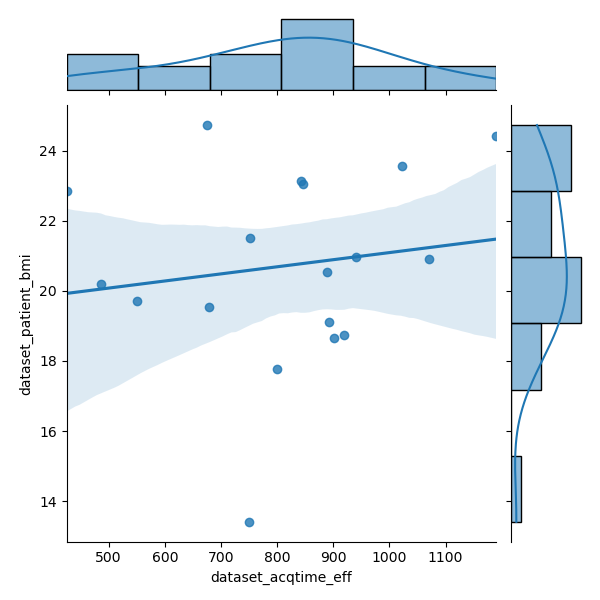

R = 0.15


<IPython.core.display.Javascript object>

R = 0.03


<IPython.core.display.Javascript object>


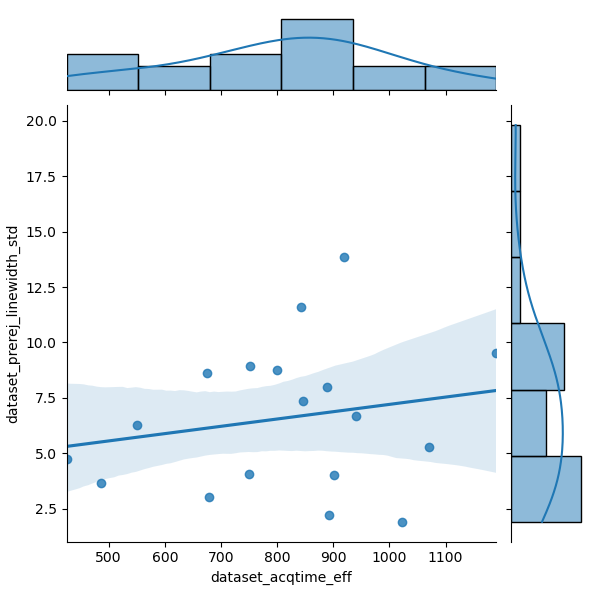

R = 0.20


In [63]:
df = df_sc

x = df["dataset_acqtime"]
y = df["dataset_acqtime_eff"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["dataset_acqtime"]
y = df["dataset_acqtime_eff"]
z = df["dataset_patient_bfp"]
g = sns.relplot(x=x, y=y, hue=z, palette=cm, s=300)
g.ax.xaxis.grid(True)
g.ax.yaxis.grid(True)

x = df["dataset_acqtime_eff"]
y = df["dataset_patient_bmi"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["dataset_acqtime_eff"]
y = df["dataset_snr_final"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))

x = df["dataset_acqtime_eff"]
y = df["dataset_prerej_linewidth_std"]
g = sns.JointGrid(x=x, y=y)
g.plot_joint(sns.regplot)
g.plot_marginals(sns.histplot, kde=True)
print("R = %.2f" % x.corr(y))


This what we can see:
* fat subjects need longer scan time (actually constrained by SAR and long TR
* no correlation between SNR and acquisition time
* the longer we scan, the less stable is the signal...

## Group-averaged rejected spectrum
Average over all subjects the data rejected into one crappy spectrum

<IPython.core.display.Javascript object>


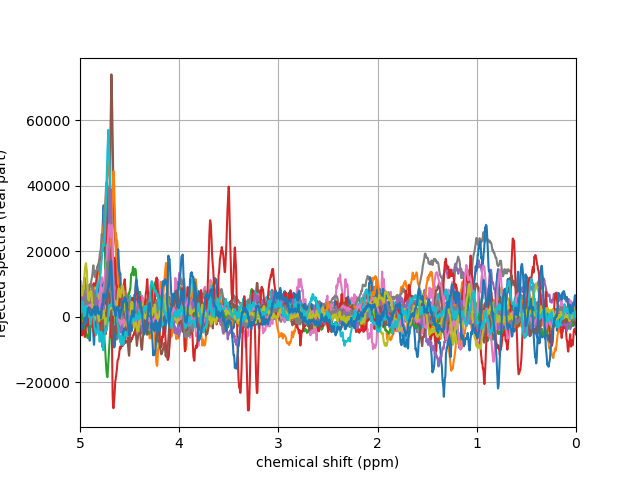

<IPython.core.display.Javascript object>

Text(0, 0.5, 'average rejected spectra (real part)')

In [64]:
df = df_sc

#init
s_arr = None
dt_final = 0.0001

fig = plt.figure()
ax = fig.subplots()

# extract rej spectrum for each dataset
for s in df["dataset_raw_data__data_rejection[0]_Rejected spectrum_obj"]:
    if(type(s) is not np.float):
        # resample so that all data can be averaged
        old_t = np.arange(0, s.shape[0] * s.dt, s.dt)
        new_t = np.arange(0, s.shape[0] * dt_final, dt_final) 

        s_interp = np.interp(new_t, old_t, s)

        # convert to suspect
        s_MRSData = suspect.MRSData(s_interp, dt_final, s.f0)
        s_MRSData2 = s_MRSData.view(reco.MRSData2)        

        s_MRSData2 = s_MRSData2.correct_zerofill_nd()
        if(s_arr is None):
            s_arr = s
        else:
            s_arr = np.vstack((s_arr, s_MRSData2))

        ax.plot(s_MRSData2.frequency_axis_ppm(), np.real(s_MRSData2.spectrum()))

ax.grid('on')
ax.set_xlim(5, 0)
ax.set_xlabel("chemical shift (ppm)")
ax.set_ylabel("rejected spectra (real part)")

# make the average + std plot
s_mean = np.mean(s_arr, axis=0)
s_mean = suspect.MRSData(s_mean, dt_final, s.f0)
s_mean = s_mean.view(reco.MRSData2)

s_std = np.std(s_arr, axis=0)
s_std = suspect.MRSData(s_std, dt_final, s.f0)
s_std = s_std.view(reco.MRSData2)

fig = plt.figure()
ax = fig.subplots()
ax.plot(s_mean.frequency_axis_ppm(), np.real(s_mean.spectrum()))
ax.grid('on')
ax.set_xlim(5, 0)
ax.set_xlabel("chemical shift (ppm)")
ax.set_ylabel("average rejected spectra (real part)")


Looks bad:
* Many artefact peaks
* Lipids
* NAA, Cho, Cre residue at 2 and 3 ppm ! :(
* Not sure about the 3-4 ppm region
* Usual artefact 5-6ppm

## Frequency realignment & data rejection: gain in SNR & LW
- Evaluate data rejection approach with peak properties estimated before and after :)

<IPython.core.display.Javascript object>


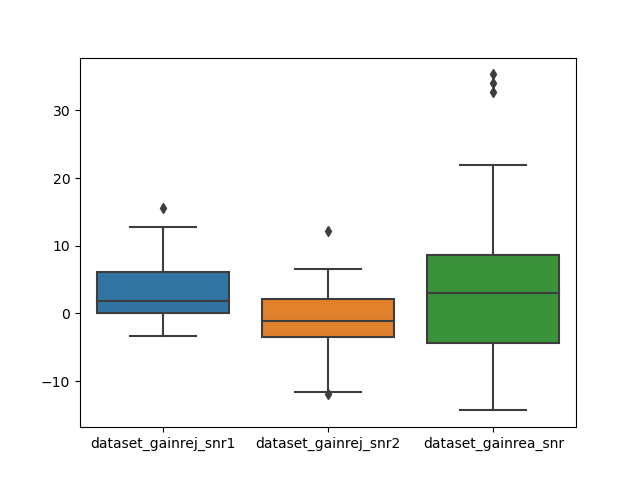

<IPython.core.display.Javascript object>

<AxesSubplot:>

In [65]:
df = df_sc

# extract SNR and LW estimation regarding frequency realignment and data rejection 
df["dataset_prerej_snr1"] = df["dataset_raw_data__data_rejection[0]_Pre-rejection_snr"]
df["dataset_prerej_snr2"] = df["dataset_raw_analysis-results_frequency realigning_snr"]
df["dataset_postrej_snr1"] = df["dataset_raw_data__data_rejection[0]_Post-rejection_snr"]
df["dataset_postrej_snr2"] = df["dataset_raw_analysis-results_data rejecting_snr"]
#
df["dataset_prerej_lw1"] = df["dataset_raw_data__data_rejection[0]_Pre-rejection_lw"]
df["dataset_prerej_lw2"] = df["dataset_raw_analysis-results_frequency realigning_lw"]
df["dataset_postrej_lw1"] = df["dataset_raw_data__data_rejection[0]_Post-rejection_lw"]
df["dataset_postrej_lw2"] = df["dataset_raw_analysis-results_data rejecting_lw"]
#
df["dataset_prerea_snr"] = df["dataset_raw_analysis-results_apodizing_snr"]
df["dataset_postrea_snr"] = df["dataset_raw_analysis-results_frequency realigning_snr"]
#
df["dataset_prerea_lw"] = df["dataset_raw_analysis-results_apodizing_lw"]
df["dataset_postrea_lw"] = df["dataset_raw_analysis-results_frequency realigning_lw"]

# SNR and LW gain calculation
df["dataset_gainrej_snr1"] = (df["dataset_postrej_snr1"] - df["dataset_prerej_snr1"]) / df["dataset_prerej_snr1"] * 100.0
df["dataset_gainrej_snr2"] = (df["dataset_postrej_snr2"] - df["dataset_prerej_snr2"]) / df["dataset_prerej_snr2"] * 100.0
df["dataset_gainrej_lw1"] = (df["dataset_postrej_lw1"] - df["dataset_prerej_lw1"])
df["dataset_gainrej_lw2"] = (df["dataset_postrej_lw2"] - df["dataset_prerej_lw2"])
#
df["dataset_gainrea_snr"] = (df["dataset_postrea_snr"] - df["dataset_prerea_snr"]) / df["dataset_prerea_snr"] * 100.0
df["dataset_gainrea_lw"] = (df["dataset_postrea_lw"] - df["dataset_prerea_lw"])

plt.figure()
y=df[["dataset_gainrej_snr1", "dataset_gainrej_snr2", "dataset_gainrea_snr"]]
sns.boxplot(data=y)

plt.figure()
y=df[["dataset_gainrej_lw1", "dataset_gainrej_lw2", "dataset_gainrea_lw"]]
sns.boxplot(data=y)


# Gating approaches
For subjects who were scanned with different gating methods
* compare final SNR and LW
* compare peak properties variability (before data rejection)

In [66]:
df = df_sc_all_slaser

# get the scans hash manually
df_gating_tests = df.loc[(df["patient_study_id"] == "300_1")
                        | (df["patient_study_id"] == "307_1")
                        | (df["patient_study_id"] == "311_2")
                        | (df["patient_study_id"] == "336_2")]
df_gating_tests

,patient,study,dataset_legend,dataset_raw_files[0],dataset_raw_files[1],dataset_raw_data_obj,dataset_raw_data__dt,dataset_raw_data__f0,dataset_raw_data__te,dataset_raw_data__tr,...,dataset_artefact_signal,dataset_water_signal,dataset_raw_data_posY_mm_abs,dataset_snr_norm_voxpos,dataset_voxel_angle_max_deg,dataset_curvy_cord,dataset_shim_sum,dataset_shim_first_order_sum,dataset_shim_second_order_sum,dataset_artefact_signal_norm
scan_hash,,,,,,,,,,,,,,,,,,,,,
fb81785a61e346c7fdbb37479f312ca5,300,1,#0 sLASER R:N=25:1,/home/tangir/crmbm/acq_twix/300-pm-p1-moelle/m...,/home/tangir/crmbm/acq_twix/300-pm-p1-moelle/m...,"[(426.508162270165-25.29576424165769j), (419.8...",0.0001,297.206850,49.96,3550.0,...,7363.055537,63713.006135,62.444581,24.845647,0.110008,1.0,25290.0,5588.0,19702.0,5122.189642
2fff316122fc89a0b4d1f918f6cd62d8,300,1,#1 sLASER R:N=25:1 trig,/home/tangir/crmbm/acq_twix/300-pm-p1-moelle/m...,/home/tangir/crmbm/acq_twix/300-pm-p1-moelle/m...,"[(466.7910467092009+42.6625311942012j), (449.5...",0.0001,297.206850,49.96,3550.0,...,7208.212015,62234.761255,62.444581,27.444340,0.110008,1.0,25290.0,5588.0,19702.0,5398.139247
40ef3af628211f936a93c79adb00ac9d,307,1,#0 sLASER 20:1 cardiac trig,/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/m...,/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/m...,"[(407.49602726268415-207.9086346239237j), (425...",0.0001,297.206696,49.96,4290.0,...,6045.466805,55922.483183,54.610250,11.046607,0.195988,1.0,32449.0,974.0,31475.0,8228.091086
159437f4b7de93d40c7fef7853019df3,307,1,#1 sLASER 20:1 resp trig,/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/m...,/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/m...,"[(498.05689346512656+329.8932319576538j), (420...",0.0001,297.206696,49.96,4290.0,...,9565.560998,65713.221497,54.610250,18.403263,0.195988,1.0,32449.0,974.0,31475.0,12426.973346
4a3a0b1b9f85f1928b9bfb342358fef4,307,1,#2 sLASER 20:1 no trig,/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/m...,/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/m...,"[(509.3192079352583+42.15127719925854j), (507....",0.0001,297.206696,49.96,4290.0,...,7027.041068,43694.626555,54.610250,26.174819,0.195988,1.0,32449.0,974.0,31475.0,9029.313957
1baf6b702f39fefb5ad9e44179057ef7,307,1,#3 sLASER 10:2 repos. + resp trig,/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/m...,/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/m...,"[(781.0128721121888-57.03888725364891j), (754....",0.0001,297.205912,29.96,4570.0,...,12674.001356,78781.944153,55.530276,22.437391,0.198216,1.0,16957.0,2150.0,14807.0,15030.640756
75ae13bc44bf3d55f5be46d4c59df84d,311,2,#0 sLASER 20/1 NA=128 trig,/home/tangir/crmbm/acq_twix/311-sl-p2-moelle/m...,/home/tangir/crmbm/acq_twix/311-sl-p2-moelle/m...,"[(278.27531875958914-2.7295633846843037j), (26...",0.0001,297.206034,52.48,5410.0,...,4201.862765,46863.526205,66.161886,50.397283,0.019994,1.0,13165.0,2583.0,10582.0,5846.141368
caf8ec7f9e1026afbfa1e2c41ba43539,311,2,#1 sLASER 20/1 NA=128 notrig,/home/tangir/crmbm/acq_twix/311-sl-p2-moelle/m...,/home/tangir/crmbm/acq_twix/311-sl-p2-moelle/m...,"[(273.0080880478138+48.28108955825748j), (269....",0.0001,297.206030,52.48,5410.0,...,4215.349858,42850.848720,66.161886,54.023279,0.019994,1.0,13165.0,2583.0,10582.0,6090.079987
355445d1bac5ee682c88f889b4c01d09,336,2,#0 sLASER 10/2 NA=64 notrig,/home/tangir/crmbm/acq_twix/336-nb-p2-moelle/m...,/home/tangir/crmbm/acq_twix/336-nb-p2-moelle/m...,"[(382.94042219267186+82.29010962310511j), (340...",0.0001,297.205894,32.28,5300.0,...,6586.186608,32263.037103,51.333126,21.969146,0.019602,1.0,2601.0,1978.0,623.0,13064.936560


In [67]:
# remove some scans
df_gating_tests = df_gating_tests.drop("1baf6b702f39fefb5ad9e44179057ef7")
df_gating_tests = df_gating_tests.drop("fd2940e9489a5d28773792aeb95f54e7")
df_gating_tests = df_gating_tests.drop("355445d1bac5ee682c88f889b4c01d09")
df_gating_tests

,patient,study,dataset_legend,dataset_raw_files[0],dataset_raw_files[1],dataset_raw_data_obj,dataset_raw_data__dt,dataset_raw_data__f0,dataset_raw_data__te,dataset_raw_data__tr,...,dataset_artefact_signal,dataset_water_signal,dataset_raw_data_posY_mm_abs,dataset_snr_norm_voxpos,dataset_voxel_angle_max_deg,dataset_curvy_cord,dataset_shim_sum,dataset_shim_first_order_sum,dataset_shim_second_order_sum,dataset_artefact_signal_norm
scan_hash,,,,,,,,,,,,,,,,,,,,,
fb81785a61e346c7fdbb37479f312ca5,300,1,#0 sLASER R:N=25:1,/home/tangir/crmbm/acq_twix/300-pm-p1-moelle/m...,/home/tangir/crmbm/acq_twix/300-pm-p1-moelle/m...,"[(426.508162270165-25.29576424165769j), (419.8...",0.0001,297.206850,49.96,3550.0,...,7363.055537,63713.006135,62.444581,24.845647,0.110008,1.0,25290.0,5588.0,19702.0,5122.189642
2fff316122fc89a0b4d1f918f6cd62d8,300,1,#1 sLASER R:N=25:1 trig,/home/tangir/crmbm/acq_twix/300-pm-p1-moelle/m...,/home/tangir/crmbm/acq_twix/300-pm-p1-moelle/m...,"[(466.7910467092009+42.6625311942012j), (449.5...",0.0001,297.206850,49.96,3550.0,...,7208.212015,62234.761255,62.444581,27.444340,0.110008,1.0,25290.0,5588.0,19702.0,5398.139247
40ef3af628211f936a93c79adb00ac9d,307,1,#0 sLASER 20:1 cardiac trig,/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/m...,/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/m...,"[(407.49602726268415-207.9086346239237j), (425...",0.0001,297.206696,49.96,4290.0,...,6045.466805,55922.483183,54.610250,11.046607,0.195988,1.0,32449.0,974.0,31475.0,8228.091086
159437f4b7de93d40c7fef7853019df3,307,1,#1 sLASER 20:1 resp trig,/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/m...,/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/m...,"[(498.05689346512656+329.8932319576538j), (420...",0.0001,297.206696,49.96,4290.0,...,9565.560998,65713.221497,54.610250,18.403263,0.195988,1.0,32449.0,974.0,31475.0,12426.973346
4a3a0b1b9f85f1928b9bfb342358fef4,307,1,#2 sLASER 20:1 no trig,/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/m...,/home/tangir/crmbm/acq_twix/307-AP-P1-MOELLE/m...,"[(509.3192079352583+42.15127719925854j), (507....",0.0001,297.206696,49.96,4290.0,...,7027.041068,43694.626555,54.610250,26.174819,0.195988,1.0,32449.0,974.0,31475.0,9029.313957
75ae13bc44bf3d55f5be46d4c59df84d,311,2,#0 sLASER 20/1 NA=128 trig,/home/tangir/crmbm/acq_twix/311-sl-p2-moelle/m...,/home/tangir/crmbm/acq_twix/311-sl-p2-moelle/m...,"[(278.27531875958914-2.7295633846843037j), (26...",0.0001,297.206034,52.48,5410.0,...,4201.862765,46863.526205,66.161886,50.397283,0.019994,1.0,13165.0,2583.0,10582.0,5846.141368
caf8ec7f9e1026afbfa1e2c41ba43539,311,2,#1 sLASER 20/1 NA=128 notrig,/home/tangir/crmbm/acq_twix/311-sl-p2-moelle/m...,/home/tangir/crmbm/acq_twix/311-sl-p2-moelle/m...,"[(273.0080880478138+48.28108955825748j), (269....",0.0001,297.206030,52.48,5410.0,...,4215.349858,42850.848720,66.161886,54.023279,0.019994,1.0,13165.0,2583.0,10582.0,6090.079987
967a1b8dace220e916df680759f31d84,336,2,#0 sLASER 20/1 NA=128 trig,/home/tangir/crmbm/acq_twix/336-nb-p2-moelle/m...,/home/tangir/crmbm/acq_twix/336-nb-p2-moelle/m...,"[(206.36435565745376+17.488918356728902j), (18...",0.0001,297.205346,52.36,5240.0,...,5236.826664,29836.236119,51.333126,33.593262,0.019602,1.0,26099.0,6480.0,19619.0,7345.586465
49872ea4c73b9206c804c4fdaa298ed9,336,2,#1 sLASER 20/1 NA=64 notrig,/home/tangir/crmbm/acq_twix/336-nb-p2-moelle/m...,/home/tangir/crmbm/acq_twix/336-nb-p2-moelle/m...,"[(214.2803366718213+30.293871740800583j), (240...",0.0001,297.205316,52.36,5220.0,...,4128.851393,18507.912154,51.333126,29.412655,0.019602,1.0,26099.0,6480.0,19619.0,9330.792126


In [68]:
df_gating_results = pd.DataFrame(columns=["patient_study_id",
                 "notrig_dataset_snr_norm",
                 "notrig_dataset_lw",
                 "notrig_prerej_amplitude_std",
                 "notrig_prerej_linewidth_std",
                 "notrig_prerej_chemical_shift_std",
                 "notrig_prerej_phase_std",
                 "cardiac_dataset_snr_norm",
                 "cardiac_dataset_lw",
                 "cardiac_prerej_amplitude_std",
                 "cardiac_prerej_linewidth_std",
                 "cardiac_prerej_chemical_shift_std",
                 "cardiac_prerej_phase_std",
                 "resp_dataset_snr_norm",
                 "resp_dataset_lw",
                 "resp_prerej_amplitude_std",
                 "resp_prerej_linewidth_std",
                 "resp_prerej_chemical_shift_std",
                 "resp_prerej_phase_std"])
df_gating_results = df_gating_results.set_index("patient_study_id")

# initialize
for this_index, this_row in df_gating_tests.iterrows():
    this_patient_study_id = this_row["patient_study_id"]
    df_gating_results.loc[this_patient_study_id] = [np.nan] * 18

# complete
for this_index, this_row in df_gating_tests.iterrows():
    this_patient_study_id = this_row["patient_study_id"]
    this_gating = this_row["dataset_raw_data__sequence_gating_mode"]
    if(this_gating == sim.gating_signal_source.NO_GATING):
        df_gating_results.loc[this_patient_study_id]["notrig_dataset_snr_norm"] = this_row["dataset_snr_norm"]
        df_gating_results.loc[this_patient_study_id]["notrig_dataset_lw"] = this_row["dataset_lw"]
        df_gating_results.loc[this_patient_study_id]["notrig_prerej_amplitude_std"] = this_row["dataset_prerej_amplitude_std"]
        df_gating_results.loc[this_patient_study_id]["notrig_prerej_linewidth_std"] = this_row["dataset_prerej_linewidth_std"]
        df_gating_results.loc[this_patient_study_id]["notrig_prerej_chemical_shift_std"] = this_row["dataset_prerej_chemical_shift_std"]
        df_gating_results.loc[this_patient_study_id]["notrig_prerej_phase_std"] = this_row["dataset_prerej_phase_std"]

    elif(this_gating == sim.gating_signal_source.CARDIAC_GATING):
        df_gating_results.loc[this_patient_study_id]["cardiac_dataset_snr_norm"] = this_row["dataset_snr_norm"]
        df_gating_results.loc[this_patient_study_id]["cardiac_dataset_lw"] = this_row["dataset_lw"]
        df_gating_results.loc[this_patient_study_id]["cardiac_prerej_amplitude_std"] = this_row["dataset_prerej_amplitude_std"]
        df_gating_results.loc[this_patient_study_id]["cardiac_prerej_linewidth_std"] = this_row["dataset_prerej_linewidth_std"]
        df_gating_results.loc[this_patient_study_id]["cardiac_prerej_chemical_shift_std"] = this_row["dataset_prerej_chemical_shift_std"]
        df_gating_results.loc[this_patient_study_id]["cardiac_prerej_phase_std"] = this_row["dataset_prerej_phase_std"]

    elif(this_gating == sim.gating_signal_source.RESP_GATING):
        df_gating_results.loc[this_patient_study_id]["resp_dataset_snr_norm"] = this_row["dataset_snr_norm"]
        df_gating_results.loc[this_patient_study_id]["resp_dataset_lw"] = this_row["dataset_lw"]
        df_gating_results.loc[this_patient_study_id]["resp_prerej_amplitude_std"] = this_row["dataset_prerej_amplitude_std"]
        df_gating_results.loc[this_patient_study_id]["resp_prerej_linewidth_std"] = this_row["dataset_prerej_linewidth_std"]
        df_gating_results.loc[this_patient_study_id]["resp_prerej_chemical_shift_std"] = this_row["dataset_prerej_chemical_shift_std"]
        df_gating_results.loc[this_patient_study_id]["resp_prerej_phase_std"] = this_row["dataset_prerej_phase_std"]
             
df_gating_results

,notrig_dataset_snr_norm,notrig_dataset_lw,notrig_prerej_amplitude_std,notrig_prerej_linewidth_std,notrig_prerej_chemical_shift_std,notrig_prerej_phase_std,cardiac_dataset_snr_norm,cardiac_dataset_lw,cardiac_prerej_amplitude_std,cardiac_prerej_linewidth_std,cardiac_prerej_chemical_shift_std,cardiac_prerej_phase_std,resp_dataset_snr_norm,resp_dataset_lw,resp_prerej_amplitude_std,resp_prerej_linewidth_std,resp_prerej_chemical_shift_std,resp_prerej_phase_std
patient_study_id,,,,,,,,,,,,,,,,,,
300_1,22.092170,13.020833,24.668068,4.588132,0.000000,0.228364,NaN,NaN,NaN,NaN,NaN,NaN,24.402867,14.648438,34.181638,7.964201,0.039159,0.291642
307_1,27.451628,27.669271,65.434805,13.599369,0.024930,0.667752,11.585461,22.786458,43.415324,5.451473,0.028608,0.512939,19.300975,29.296875,47.316849,17.893917,0.005962,0.361885
311_2,44.371489,14.648437,13.072020,2.441215,0.003959,0.213035,NaN,NaN,NaN,NaN,NaN,NaN,41.393313,13.020833,13.012755,1.923682,0.002442,0.224967
336_2,33.003784,11.393229,59.662187,6.172741,0.095425,0.883059,NaN,NaN,NaN,NaN,NaN,NaN,37.694820,11.393229,38.994880,4.057220,0.036815,0.562552


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


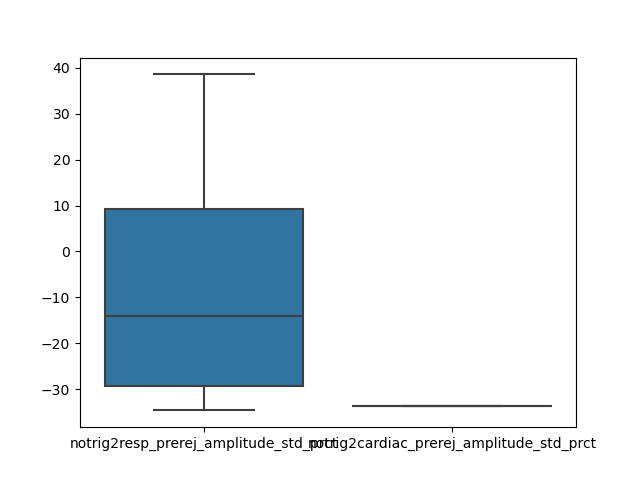

<IPython.core.display.Javascript object>


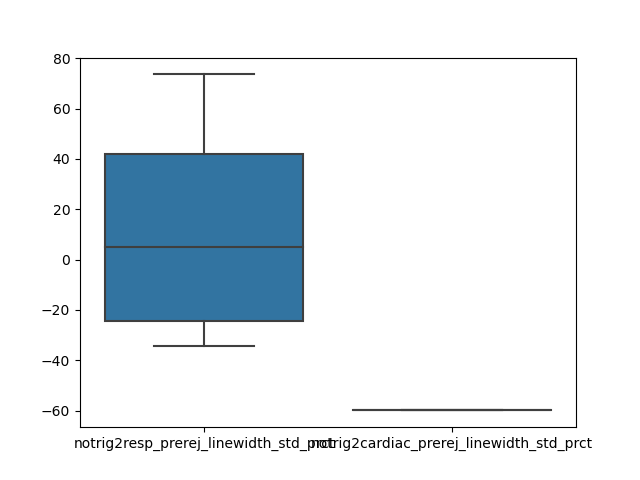

<IPython.core.display.Javascript object>


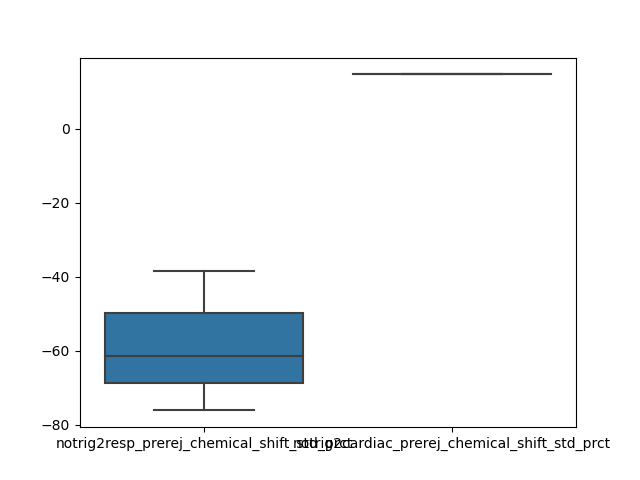

<IPython.core.display.Javascript object>

<AxesSubplot:>

In [69]:
# replace 0 by nan
df_gating_results = df_gating_results.replace(0, np.nan)

# estimate relative changes of all this
df_gating_results["notrig2resp_dataset_snr_norm_prct"] = (df_gating_results["resp_dataset_snr_norm"] - df_gating_results["notrig_dataset_snr_norm"]) / df_gating_results["notrig_dataset_snr_norm"] * 100
df_gating_results["notrig2resp_dataset_lw"] = df_gating_results["resp_dataset_lw"] - df_gating_results["notrig_dataset_lw"]
df_gating_results["notrig2resp_prerej_amplitude_std_prct"] = (df_gating_results["resp_prerej_amplitude_std"] - df_gating_results["notrig_prerej_amplitude_std"]) / df_gating_results["notrig_prerej_amplitude_std"] * 100
df_gating_results["notrig2resp_prerej_linewidth_std_prct"] = (df_gating_results["resp_prerej_linewidth_std"] - df_gating_results["notrig_prerej_linewidth_std"]) / df_gating_results["notrig_prerej_linewidth_std"] * 100
df_gating_results["notrig2resp_prerej_chemical_shift_std_prct"] = (df_gating_results["resp_prerej_chemical_shift_std"] - df_gating_results["notrig_prerej_chemical_shift_std"]) / df_gating_results["notrig_prerej_chemical_shift_std"] * 100
df_gating_results["notrig2resp_prerej_phase_std_prct"] = (df_gating_results["resp_prerej_phase_std"] - df_gating_results["notrig_prerej_phase_std"]) / df_gating_results["notrig_prerej_phase_std"] * 100
#
df_gating_results["notrig2cardiac_dataset_snr_norm_prct"] = (df_gating_results["cardiac_dataset_snr_norm"] - df_gating_results["notrig_dataset_snr_norm"]) / df_gating_results["notrig_dataset_snr_norm"] * 100
df_gating_results["notrig2cardiac_dataset_lw"] = df_gating_results["cardiac_dataset_lw"] - df_gating_results["notrig_dataset_lw"]
df_gating_results["notrig2cardiac_prerej_amplitude_std_prct"] = (df_gating_results["cardiac_prerej_amplitude_std"] - df_gating_results["notrig_prerej_amplitude_std"]) / df_gating_results["notrig_prerej_amplitude_std"] * 100
df_gating_results["notrig2cardiac_prerej_linewidth_std_prct"] = (df_gating_results["cardiac_prerej_linewidth_std"] - df_gating_results["notrig_prerej_linewidth_std"]) / df_gating_results["notrig_prerej_linewidth_std"] * 100
df_gating_results["notrig2cardiac_prerej_chemical_shift_std_prct"] = (df_gating_results["cardiac_prerej_chemical_shift_std"] - df_gating_results["notrig_prerej_chemical_shift_std"]) / df_gating_results["notrig_prerej_chemical_shift_std"] * 100
df_gating_results["notrig2cardiac_prerej_phase_std_prct"] = (df_gating_results["cardiac_prerej_phase_std"] - df_gating_results["notrig_prerej_phase_std"]) / df_gating_results["notrig_prerej_phase_std"] * 100

# display
plt.figure()
y=df_gating_results[["notrig2resp_dataset_snr_norm_prct", "notrig2cardiac_dataset_snr_norm_prct"]]
sns.boxplot(data=y)

plt.figure()
y=df_gating_results[["notrig2resp_dataset_lw", "notrig2cardiac_dataset_lw"]]
sns.boxplot(data=y)

plt.figure()
y=df_gating_results[["notrig2resp_prerej_amplitude_std_prct", "notrig2cardiac_prerej_amplitude_std_prct"]]
sns.boxplot(data=y)

plt.figure()
y=df_gating_results[["notrig2resp_prerej_linewidth_std_prct", "notrig2cardiac_prerej_linewidth_std_prct"]]
sns.boxplot(data=y)

plt.figure()
y=df_gating_results[["notrig2resp_prerej_chemical_shift_std_prct", "notrig2cardiac_prerej_chemical_shift_std_prct"]]
sns.boxplot(data=y)

plt.figure()
y=df_gating_results[["notrig2resp_prerej_phase_std_prct", "notrig2cardiac_prerej_phase_std_prct"]]
sns.boxplot(data=y)


All this was hard to program... but interesting however poorly significant results:
* too few points for cardiac gating to conclude anything
* the use of resp gating increases signal stability during scan: all peak properties (amplitude, linewidth, chemical shift and phase) standard deviations are reduced
* however, the gain in SNR/LW is really poor when comparing resp to no trig. Need more subjects if I really want to show this.

# Save dataframes to files

In [70]:
df_sc.to_pickle("/home/tangir/crmbm/acq_db/sc_notebook.pkl")
df_brain.to_pickle("/home/tangir/crmbm/acq_db/brain_notebook.pkl")